In [1]:
import os

# Directory containing the files
directory = '/Users/User/Downloads/WQD7002 Data Science Research Project/Verification/SLEEP STUDY, HR, SPO2/sleepdata'

# List all files in the directory
files = os.listdir(directory)

# Filter files if needed (e.g., only consider CSV files)
files = [file for file in files if file.endswith('.csv')]

import pandas as pd

for file in files:
    # Construct the full file path
    file_path = os.path.join(directory, file)

    # Read the file into a DataFrame
    df = pd.read_csv(file_path)

    # Perform data cleaning operations on df (e.g., remove columns, modify data)
    df = df.iloc[:, 0:7]
    
    from datetime import datetime
    # Convert the start and end times to datetime objects
    df['start'] = pd.to_datetime(df['start'])
    df['stop'] = pd.to_datetime(df['stop'])

    # Calculate the sleep duration in minutes
    df['sleep_duration'] = (df['stop'] - df['start']).dt.total_seconds() / 60

    # Convert the column from float to int
    df['sleep_duration'] = df['sleep_duration'].astype(int)
    
    # drop unwanted columns
#     df.drop(columns=['start', 'stop'],axis=1, inplace=True)

    # Rename the DataFrame if needed
    new_name = 'cleaned_' + file  # Modify the renaming logic as needed
    df.to_csv(os.path.join(directory, new_name), index=False)
    

In [14]:
import os

# Directory containing the files
# Load the Excel sheet into a DataFrame
df = pd.read_csv('/Users/User/Downloads/sleep_study_10,17.11.2023.csv')  

from datetime import datetime
# Convert the start and end times to datetime objects
df['start'] = pd.to_datetime(df['start'])
df['stop'] = pd.to_datetime(df['stop'])

# Calculate the sleep duration in minutes
df['sd'] = (df['stop'] - df['start']).dt.total_seconds() / 60

# Convert the column from float to int
df['sd'] = df['sd'].astype(int)
    
# Rename the DataFrame if needed
new_name = 'cleaned_' + file  # Modify the renaming logic as needed
df.to_csv(new_name, index=False)

In [7]:
import os

# Directory containing the files
directory = '/Users/User/Downloads/heartratedata'

# List all files in the directory
files = os.listdir(directory)

# Filter files if needed (e.g., only consider CSV files)
files = [file for file in files if file.endswith('.csv')]

import pandas as pd

for file in files:
    # Construct the full file path
    file_path = os.path.join(directory, file)

    # Read the file into a DataFrame
    df = pd.read_csv(file_path)

    # Perform data cleaning operations on df (e.g., remove columns, modify data)
    
    from datetime import datetime
    
    # Convert the 'date' and 'time' columns to a datetime column
    df['Timestamp'] = pd.to_datetime(df['date'] + ' ' + df['time'])
    df = df.drop(['date', 'time'], axis=1)
    
    # Group the data by date and calculate the mean, median, min, and max
    result = df.groupby(df['Timestamp'].dt.date).agg(
        Mean=('heartRate', 'mean'),
        Median=('heartRate', 'median'),
        Min=('heartRate', 'min'),
        Max=('heartRate', 'max')
    )
    
    # Group the data by date and calculate the mode
    mode_data = df.groupby(df['Timestamp'].dt.date)['heartRate'].apply(lambda x: x.mode().iat[0] if not x.mode().empty else None).reset_index()
    mode_data.columns = ['Timestamp', 'Mode']
    
    # Merge the results
    result = result.merge(mode_data, on='Timestamp')

    # Reset the index
    result = result.reset_index(drop=True)
    
    # Change the name of the 'OldColumnName' to 'NewColumnName'
    result = result.rename(columns={'Timestamp': 'Date'})
    
    # Round the 'Value' column to 2 decimal places
    result['Mean'] = result['Mean'].apply(lambda x: f'{x:.2f}')
    
    # Specify the column to move (20th column)
    column_to_move = 'Mode'

    # Create a new DataFrame with the desired column order
    new_order = list(result.columns[:3]) + [column_to_move] + list(result.columns[3:5])

    # Reassign the column order
    result = result[new_order]
    
    # Convert the column from float to int
    result['Median'] = result['Median'].astype(int)
    
    # Convert the column from object to float
    result['Mean'] = result['Mean'].astype(float)

    # Rename the DataFrame if needed
    new_name = 'cleaned_' + file  # Modify the renaming logic as needed
    result.to_csv(os.path.join(directory, new_name), index=False)

C:\Users\User\AppData\Local\Temp\ipykernel_6356\3681768552.py:38: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  mode_data = df.groupby(df['Timestamp'].dt.date)['heartRate'].apply(lambda x: x.mode().iat[0] if not x.mode().empty else None).reset_index()


In [ ]:
import os
import pandas as pd

folder_path = '/Users/User/Downloads/heartratedata'
patient_data = []

for filename in os.listdir(folder_path):
    if filename.endswith('.csv'):  # Assuming the files are in Excel format
        file_path = os.path.join(folder_path, filename)
        df = pd.read_csv(file_path)
        patient_name = os.path.splitext(filename)[0]  # Extract patient name from the filename
        patient_data.append((df, patient_name))

        import matplotlib.pyplot as plt

num_patients = len(patient_data)
fig, axes = plt.subplots(num_patients, 1, figsize=(10, 5*num_patients), sharex=True)

for i, (df, patient_name) in enumerate(patient_data):
    ax = axes[i]
    ax.plot(df['Date'], df['HeartRate'], label=patient_name)
    ax.set_title(f"Heart Rate Trend - {patient_name}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Heart Rate")
    ax.legend()

plt.tight_layout()

plt.show()


In [ ]:
import pandas as pd

# Load data from three Excel files
df1 = pd.read_excel("file1.xlsx")
df2 = pd.read_excel("file2.xlsx")
df3 = pd.read_excel("file3.xlsx")

# Merge the DataFrames on the 'Date' column
merged_df = df1.merge(df2, on='Date', how='inner').merge(df3, on='Date', how='inner')

# The 'inner' parameter specifies that only rows with matching dates will be included

# Save the merged DataFrame to a CSV file
merged_df.to_csv("merged_data.csv", index=False)

In [ ]:
import os
import glob
import pandas as pd

folder_paths = ['/Users/User/Downloads/a', '/Users/User/Downloads/s', '/Users/User/Downloads/hr']  # List of folder paths
merged_dfs = []  # List to store merged DataFrames

for folder_path in folder_paths:
    files = glob.glob(os.path.join(folder_path, "ppum001.csv"))  # Match files with the same end name

    folder_merged_df = pd.DataFrame()  # Initialize an empty DataFrame for each folder

    for file_path in files:
        df = pd.read_csv(file_path)
        folder_merged_df = pd.concat([folder_merged_df, df], ignore_index=True)

    # Append the merged DataFrame for the folder to the list
    merged_dfs.append(folder_merged_df)


In [ ]:
import os
import glob
import pandas as pd

def merge_files_by_date(folder_paths, end_name):
    merged_dfs = []  # List to store merged DataFrames

    for folder_path in folder_paths:
        files = glob.glob(os.path.join(folder_path, f"*{end_name}"))  # Match files with the same end name

        folder_merged_df = pd.DataFrame()  # Initialize an empty DataFrame for each folder

        for file_path in files:
            df = pd.read_csv(file_path)
            folder_merged_df = pd.concat([folder_merged_df, df], ignore_index=True)

        # Sort the merged DataFrame by the date column
        folder_merged_df['date'] = pd.to_datetime(folder_merged_df['date'])  # Convert 'date' column to datetime
        folder_merged_df = folder_merged_df.sort_values(by='date').reset_index(drop=True)

        # Append the merged DataFrame for the folder to the list
        merged_dfs.append(folder_merged_df)

    # Merge the DataFrames from different folders
#     final_merged_df = pd.concat(merged_dfs, ignore_index=True)

#     return final_merged_df

# Example usage:
folder_paths = ['folder1', 'folder2', 'folder3']  # List of folder paths
end_name = "file1.xlsx"  # Common end name of files
merged_data = merge_files_by_date(folder_paths, end_name)

def save_merged_data(data, new_folder_path, new_filename):
    # Create the new folder if it doesn't exist
    os.makedirs(new_folder_path, exist_ok=True)

    # Save the merged DataFrame to a CSV file in the new folder with the new name
    data.to_csv(os.path.join(new_folder_path, new_filename), index=False)

# Example usage:
new_folder_path = 'new_folder'  # Path to the new folder
new_filename = 'new_merged_data.csv'  # New name for the merged data
save_merged_data(merged_data, new_folder_path, new_filename)

new_end_name = "file2.xlsx"  # New end name of files
new_merged_data = merge_files_by_date(folder_paths, new_end_name)

new_folder_path = 'new_folder'  # Path to the new folder
new_filename = 'new_merged_data2.csv'  # New name for the merged data
save_merged_data(new_merged_data, new_folder_path, new_filename)


In [36]:
import pandas as pd

# Load the Excel sheet into a DataFrame
df = pd.read_excel('/Users/User/Downloads/WQD7002 Data Science Research Project/Symptoms Questionnaire (Responses).xlsx')  # Replace with your Excel file's name

# Identify the email address for which you want to extract data
email_to_extract = ['ep017.miband@hotmail.com' , 'iirgcovid+047@hotmail.com']  # Replace with the email address you want to extract data for

# Filter the DataFrame to extract data for the specific email
filtered_data = df[df['Email'] .isin(email_to_extract)]  # Replace 'Email' with the actual column name

# Define the desired path to save the output CSV file
output_file_path = 'C:/Users/User/Downloads/symptoms_017.csv'  # Replace with your desired path and file name

# Save the filtered data to the specified path
filtered_data.to_csv(output_file_path, index=False)

filtered_data


,Timestamp,Email,Oxygen level (SpO2),Cardiovascular,Skin,Gastrointestinal symptoms,Eye/ears/nose/throat symptoms,Musculoskeletal,Neuropsychiatric symptoms,Respiratory,"Genitourinary, reproductive",Systemic,Please fill in the date of the questionnaire (NOTE: please change the date if you are filling in for previous questionnaire day)
65,2023-02-20 17:43:20.213,ep017.miband@hotmail.com,99,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NaN
82,2023-02-22 18:31:53.997,ep017.miband@hotmail.com,99,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NaN
100,2023-02-24 17:52:36.923,ep017.miband@hotmail.com,97,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NaN
117,2023-02-26 20:45:03.532,ep017.miband@hotmail.com,96,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NaN
132,2023-02-28 21:59:48.286,ep017.miband@hotmail.com,97,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NaN
140,2023-03-01 18:08:20.019,ep017.miband@hotmail.com,97,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NaN
156,2023-03-04 09:05:09.454,ep017.miband@hotmail.com,97,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NaN
163,2023-03-05 18:06:31.604,ep017.miband@hotmail.com,99,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NaN
177,2023-03-06 22:05:03.339,ep017.miband@hotmail.com,96,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NaN
199,2023-03-10 23:44:28.826,iirgcovid+047@hotmail.com,99,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NaN


In [37]:
filtered_data.shape

(41, 13)

In [34]:
import pandas as pd

# Load the Excel sheet into a DataFrame
df = pd.read_csv('/Users/User/Downloads/Daily Symptoms Questionnaire (1).csv')  # Replace with your Excel file's name

# Identify the email address for which you want to extract data
email_to_extract = 'iirgcovid+018@hotmail.com'  # Replace with the email address you want to extract data for

# Filter the DataFrame to extract data for the specific email
filtered_data = df[df['Mi Account Email'] == email_to_extract]  # Replace 'Email' with the actual column name

# Define the desired path to save the output CSV file
output_file_path = 'C:/Users/User/Downloads/symptoms_ppum018.csv'  # Replace with your desired path and file name

# Save the filtered data to the specified path
filtered_data.to_csv(output_file_path, index=False)

filtered_data


,Timestamp,Username,Mi Account Email,Oxygen level (SpO2),Cardiovascular,Skin,Gastrointestinal symptoms,Eye/ears/nose/throat symptoms,Musculoskeletal,Neuropsychiatric symptoms,Respiratory,"Genitourinary, reproductive",Systemic
526,2022/11/11 6:14:05 PM GMT+8,mohdjulian@um.edu.my,iirgcovid+018@hotmail.com,100.0,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS
530,2022/11/13 5:47:13 PM GMT+8,mohdjulian@um.edu.my,iirgcovid+018@hotmail.com,97.0,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS
538,2022/11/16 5:25:20 PM GMT+8,mohdjulian@um.edu.my,iirgcovid+018@hotmail.com,97.0,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS
543,2022/11/18 6:06:51 PM GMT+8,mohdjulian@um.edu.my,iirgcovid+018@hotmail.com,96.0,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS
548,2022/11/21 5:40:40 PM GMT+8,mohdjulian@um.edu.my,iirgcovid+018@hotmail.com,99.0,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS
554,2022/11/23 9:53:08 PM GMT+8,mohdjulian@um.edu.my,iirgcovid+018@hotmail.com,98.0,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS
560,2022/11/27 6:33:33 PM GMT+8,mohdjulian@um.edu.my,iirgcovid+018@hotmail.com,98.0,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS
563,2022/11/28 10:11:07 PM GMT+8,mohdjulian@um.edu.my,iirgcovid+018@hotmail.com,NaN,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS
570,2022/12/04 11:24:03 AM GMT+8,mohdjulian@um.edu.my,iirgcovid+018@hotmail.com,99.0,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS
574,2022/12/05 7:08:11 PM GMT+8,mohdjulian@um.edu.my,iirgcovid+018@hotmail.com,98.0,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS,NO SYMPTOMS


In [35]:
filtered_data.shape

(25, 13)

In [203]:
import pandas as pd

# Load the Excel sheet into a DataFrame
df = pd.read_csv('/Users/User/Downloads/WQD7002 Data Science Research Project/symptoms/symptoms_014.csv')
df

,Timestamp,Email,Oxygen level (SpO2),Cardiovascular,Skin,Gastrointestinal symptoms,Eye/ears/nose/throat symptoms,Musculoskeletal,Neuropsychiatric symptoms,Respiratory,"Genitourinary, reproductive",Systemic
0,2/11/2023,ep014.miband@hotmail.com,89.00,NO SYMPTOM,Chapped lips,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,Difficulty sleeping,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
1,2/14/2023,ep014.miband@hotmail.com,98.00,NO SYMPTOM,Chapped lips,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
2,2/15/2023,ep014.miband@hotmail.com,94.00,NO SYMPTOM,Chapped lips,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
3,2/17/2023,ep014.miband@hotmail.com,99.00,NO SYMPTOM,Chapped lips,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
4,2/19/2023,ep014.miband@hotmail.com,96.00,NO SYMPTOM,NO SYMPTOM,Constipation,Ringing or buzzing in the ear,NO SYMPTOM,Difficulty sleeping,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
...,...,...,...,...,...,...,...,...,...,...,...,...
58,7/10/2023,iirgcovid+044@hotmail.com,95.89,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Sore throat,NO SYMPTOM,Headaches,Sneezing,NO SYMPTOM,NO SYMPTOM
59,7/12/2023,iirgcovid+044@hotmail.com,95.89,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Dry cough,NO SYMPTOM,NO SYMPTOM
60,7/21/2023,iirgcovid+044@hotmail.com,95.89,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
61,7/24/2023,iirgcovid+044@hotmail.com,95.00,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM


In [204]:
df.shape

(63, 12)

In [205]:
df.describe()

,Oxygen level (SpO2)
count,63.000000
mean,95.889048
std,2.197261
min,89.000000
25%,95.000000
50%,95.890000
75%,98.000000
max,99.000000


In [206]:
df.isnull().sum()

Timestamp                        0
Email                            0
Oxygen level (SpO2)              0
Cardiovascular                   0
Skin                             0
Gastrointestinal symptoms        0
Eye/ears/nose/throat symptoms    0
Musculoskeletal                  0
Neuropsychiatric symptoms        0
Respiratory                      0
Genitourinary, reproductive      0
Systemic                         0
dtype: int64

In [190]:
df = df.iloc[:, :-1]
df

,Timestamp,Email,Oxygen level (SpO2),Cardiovascular,Skin,Gastrointestinal symptoms,Eye/ears/nose/throat symptoms,Musculoskeletal,Neuropsychiatric symptoms,Respiratory,"Genitourinary, reproductive",Systemic
0,2/11/2023,ep014.miband@hotmail.com,89.0,NaN,Chapped lips,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,Difficulty sleeping,NaN,NO SYMPTOM,NO SYMPTOM
1,2/14/2023,ep014.miband@hotmail.com,98.0,NO SYMPTOM,Chapped lips,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
2,2/15/2023,ep014.miband@hotmail.com,94.0,NO SYMPTOM,Chapped lips,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
3,2/17/2023,ep014.miband@hotmail.com,99.0,NO SYMPTOM,Chapped lips,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
4,2/19/2023,ep014.miband@hotmail.com,96.0,NO SYMPTOM,NO SYMPTOM,Constipation,Ringing or buzzing in the ear,NO SYMPTOM,Difficulty sleeping,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
...,...,...,...,...,...,...,...,...,...,...,...,...
58,7/10/2023,iirgcovid+044@hotmail.com,NaN,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Sore throat,NO SYMPTOM,Headaches,Sneezing,NO SYMPTOM,NO SYMPTOM
59,7/12/2023,iirgcovid+044@hotmail.com,NaN,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Dry cough,NO SYMPTOM,NO SYMPTOM
60,7/21/2023,iirgcovid+044@hotmail.com,NaN,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
61,7/24/2023,iirgcovid+044@hotmail.com,95.0,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM


In [191]:
df.isna().sum()

Timestamp                        0
Email                            0
Oxygen level (SpO2)              9
Cardiovascular                   2
Skin                             0
Gastrointestinal symptoms        0
Eye/ears/nose/throat symptoms    0
Musculoskeletal                  0
Neuropsychiatric symptoms        0
Respiratory                      2
Genitourinary, reproductive      0
Systemic                         0
dtype: int64

In [192]:
missing_rows = df[df.isna().any(axis=1)]
missing_rows

,Timestamp,Email,Oxygen level (SpO2),Cardiovascular,Skin,Gastrointestinal symptoms,Eye/ears/nose/throat symptoms,Musculoskeletal,Neuropsychiatric symptoms,Respiratory,"Genitourinary, reproductive",Systemic
0,2/11/2023,ep014.miband@hotmail.com,89.0,NaN,Chapped lips,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,Difficulty sleeping,NaN,NO SYMPTOM,NO SYMPTOM
8,2/26/2023,ep014.miband@hotmail.com,91.0,NaN,NO SYMPTOM,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NaN,NO SYMPTOM,NO SYMPTOM
52,6/21/2023,iirgcovid+044@hotmail.com,NaN,NO SYMPTOM,NO SYMPTOM,Constipation,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
53,6/23/2023,iirgcovid+044@hotmail.com,NaN,NO SYMPTOM,NO SYMPTOM,Diarrhoea,Sore throat,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
54,6/26/2023,iirgcovid+044@hotmail.com,NaN,NO SYMPTOM,NO SYMPTOM,Constipation,"Sore throat, Hoarseness of voice",NO SYMPTOM,NO SYMPTOM,Dry cough,NO SYMPTOM,"Chills, Fever"
55,6/28/2023,iirgcovid+044@hotmail.com,NaN,NO SYMPTOM,NO SYMPTOM,"Constipation, Nausea","Sore throat, Ringing or buzzing in the ear, Ho...",Muscle ache,NO SYMPTOM,"Wet cough, Sneezing",NO SYMPTOM,Fever
56,6/30/2023,iirgcovid+044@hotmail.com,NaN,NO SYMPTOM,NO SYMPTOM,Diarrhoea,"Runny nose, Ringing or buzzing in the ear, Hoa...",NO SYMPTOM,Change in taste,"Wet cough, Sneezing",NO SYMPTOM,NO SYMPTOM
57,7/5/2023,iirgcovid+044@hotmail.com,NaN,NO SYMPTOM,NO SYMPTOM,"Diarrhoea, Nausea",Sore throat,NO SYMPTOM,NO SYMPTOM,Wet cough,NO SYMPTOM,NO SYMPTOM
58,7/10/2023,iirgcovid+044@hotmail.com,NaN,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Sore throat,NO SYMPTOM,Headaches,Sneezing,NO SYMPTOM,NO SYMPTOM
59,7/12/2023,iirgcovid+044@hotmail.com,NaN,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Dry cough,NO SYMPTOM,NO SYMPTOM


In [193]:
# Value to fill missing cells with
fill_value = 'NO SYMPTOM'  # Replace with the value you want to use

# Fill missing values in the specified column with the fill_value
df['Cardiovascular'] = df['Cardiovascular'].fillna(fill_value)

rows_to_display = df.iloc[[0, 8]]
rows_to_display

,Timestamp,Email,Oxygen level (SpO2),Cardiovascular,Skin,Gastrointestinal symptoms,Eye/ears/nose/throat symptoms,Musculoskeletal,Neuropsychiatric symptoms,Respiratory,"Genitourinary, reproductive",Systemic
0,2/11/2023,ep014.miband@hotmail.com,89.0,NO SYMPTOM,Chapped lips,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,Difficulty sleeping,NaN,NO SYMPTOM,NO SYMPTOM
8,2/26/2023,ep014.miband@hotmail.com,91.0,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NaN,NO SYMPTOM,NO SYMPTOM


In [194]:
# Value to fill missing cells with
fill_value = 'NO SYMPTOM'  # Replace with the value you want to use

# Fill missing values in the specified column with the fill_value
df['Respiratory'] = df['Respiratory'].fillna(fill_value)

rows_to_display = df.iloc[[0, 8]]
rows_to_display

,Timestamp,Email,Oxygen level (SpO2),Cardiovascular,Skin,Gastrointestinal symptoms,Eye/ears/nose/throat symptoms,Musculoskeletal,Neuropsychiatric symptoms,Respiratory,"Genitourinary, reproductive",Systemic
0,2/11/2023,ep014.miband@hotmail.com,89.0,NO SYMPTOM,Chapped lips,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,Difficulty sleeping,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
8,2/26/2023,ep014.miband@hotmail.com,91.0,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM


In [195]:
missing_rows = df[df.isna().any(axis=1)]
missing_rows

,Timestamp,Email,Oxygen level (SpO2),Cardiovascular,Skin,Gastrointestinal symptoms,Eye/ears/nose/throat symptoms,Musculoskeletal,Neuropsychiatric symptoms,Respiratory,"Genitourinary, reproductive",Systemic
52,6/21/2023,iirgcovid+044@hotmail.com,NaN,NO SYMPTOM,NO SYMPTOM,Constipation,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
53,6/23/2023,iirgcovid+044@hotmail.com,NaN,NO SYMPTOM,NO SYMPTOM,Diarrhoea,Sore throat,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
54,6/26/2023,iirgcovid+044@hotmail.com,NaN,NO SYMPTOM,NO SYMPTOM,Constipation,"Sore throat, Hoarseness of voice",NO SYMPTOM,NO SYMPTOM,Dry cough,NO SYMPTOM,"Chills, Fever"
55,6/28/2023,iirgcovid+044@hotmail.com,NaN,NO SYMPTOM,NO SYMPTOM,"Constipation, Nausea","Sore throat, Ringing or buzzing in the ear, Ho...",Muscle ache,NO SYMPTOM,"Wet cough, Sneezing",NO SYMPTOM,Fever
56,6/30/2023,iirgcovid+044@hotmail.com,NaN,NO SYMPTOM,NO SYMPTOM,Diarrhoea,"Runny nose, Ringing or buzzing in the ear, Hoa...",NO SYMPTOM,Change in taste,"Wet cough, Sneezing",NO SYMPTOM,NO SYMPTOM
57,7/5/2023,iirgcovid+044@hotmail.com,NaN,NO SYMPTOM,NO SYMPTOM,"Diarrhoea, Nausea",Sore throat,NO SYMPTOM,NO SYMPTOM,Wet cough,NO SYMPTOM,NO SYMPTOM
58,7/10/2023,iirgcovid+044@hotmail.com,NaN,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Sore throat,NO SYMPTOM,Headaches,Sneezing,NO SYMPTOM,NO SYMPTOM
59,7/12/2023,iirgcovid+044@hotmail.com,NaN,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Dry cough,NO SYMPTOM,NO SYMPTOM
60,7/21/2023,iirgcovid+044@hotmail.com,NaN,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM


In [196]:
# Fill missing values in column 'A' with the mean of non-missing values
mean_spo2 = round(df['Oxygen level (SpO2)'].mean(),2)

# # Step 2: Round the mean to 2 decimal places
# rounded_mean = round(mean_spo2, 2)

df['Oxygen level (SpO2)'] = df['Oxygen level (SpO2)'].fillna(mean_spo2)
# df['Oxygen level (SpO2)'] = df['Oxygen level (SpO2)'].apply(lambda x: f'{x:.2f}')
rows_to_display = df.iloc[52 : 61]
rows_to_display


,Timestamp,Email,Oxygen level (SpO2),Cardiovascular,Skin,Gastrointestinal symptoms,Eye/ears/nose/throat symptoms,Musculoskeletal,Neuropsychiatric symptoms,Respiratory,"Genitourinary, reproductive",Systemic
52,6/21/2023,iirgcovid+044@hotmail.com,95.89,NO SYMPTOM,NO SYMPTOM,Constipation,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
53,6/23/2023,iirgcovid+044@hotmail.com,95.89,NO SYMPTOM,NO SYMPTOM,Diarrhoea,Sore throat,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
54,6/26/2023,iirgcovid+044@hotmail.com,95.89,NO SYMPTOM,NO SYMPTOM,Constipation,"Sore throat, Hoarseness of voice",NO SYMPTOM,NO SYMPTOM,Dry cough,NO SYMPTOM,"Chills, Fever"
55,6/28/2023,iirgcovid+044@hotmail.com,95.89,NO SYMPTOM,NO SYMPTOM,"Constipation, Nausea","Sore throat, Ringing or buzzing in the ear, Ho...",Muscle ache,NO SYMPTOM,"Wet cough, Sneezing",NO SYMPTOM,Fever
56,6/30/2023,iirgcovid+044@hotmail.com,95.89,NO SYMPTOM,NO SYMPTOM,Diarrhoea,"Runny nose, Ringing or buzzing in the ear, Hoa...",NO SYMPTOM,Change in taste,"Wet cough, Sneezing",NO SYMPTOM,NO SYMPTOM
57,7/5/2023,iirgcovid+044@hotmail.com,95.89,NO SYMPTOM,NO SYMPTOM,"Diarrhoea, Nausea",Sore throat,NO SYMPTOM,NO SYMPTOM,Wet cough,NO SYMPTOM,NO SYMPTOM
58,7/10/2023,iirgcovid+044@hotmail.com,95.89,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Sore throat,NO SYMPTOM,Headaches,Sneezing,NO SYMPTOM,NO SYMPTOM
59,7/12/2023,iirgcovid+044@hotmail.com,95.89,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Dry cough,NO SYMPTOM,NO SYMPTOM
60,7/21/2023,iirgcovid+044@hotmail.com,95.89,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM


In [207]:
df.loc[52:60, "Oxygen level (SpO2)"] = df.loc[52:60, "Oxygen level (SpO2)"].round(0)
rows_to_display = df.iloc[52 : 61]
rows_to_display

,Timestamp,Email,Oxygen level (SpO2),Cardiovascular,Skin,Gastrointestinal symptoms,Eye/ears/nose/throat symptoms,Musculoskeletal,Neuropsychiatric symptoms,Respiratory,"Genitourinary, reproductive",Systemic
52,6/21/2023,iirgcovid+044@hotmail.com,96.0,NO SYMPTOM,NO SYMPTOM,Constipation,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
53,6/23/2023,iirgcovid+044@hotmail.com,96.0,NO SYMPTOM,NO SYMPTOM,Diarrhoea,Sore throat,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
54,6/26/2023,iirgcovid+044@hotmail.com,96.0,NO SYMPTOM,NO SYMPTOM,Constipation,"Sore throat, Hoarseness of voice",NO SYMPTOM,NO SYMPTOM,Dry cough,NO SYMPTOM,"Chills, Fever"
55,6/28/2023,iirgcovid+044@hotmail.com,96.0,NO SYMPTOM,NO SYMPTOM,"Constipation, Nausea","Sore throat, Ringing or buzzing in the ear, Ho...",Muscle ache,NO SYMPTOM,"Wet cough, Sneezing",NO SYMPTOM,Fever
56,6/30/2023,iirgcovid+044@hotmail.com,96.0,NO SYMPTOM,NO SYMPTOM,Diarrhoea,"Runny nose, Ringing or buzzing in the ear, Hoa...",NO SYMPTOM,Change in taste,"Wet cough, Sneezing",NO SYMPTOM,NO SYMPTOM
57,7/5/2023,iirgcovid+044@hotmail.com,96.0,NO SYMPTOM,NO SYMPTOM,"Diarrhoea, Nausea",Sore throat,NO SYMPTOM,NO SYMPTOM,Wet cough,NO SYMPTOM,NO SYMPTOM
58,7/10/2023,iirgcovid+044@hotmail.com,96.0,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Sore throat,NO SYMPTOM,Headaches,Sneezing,NO SYMPTOM,NO SYMPTOM
59,7/12/2023,iirgcovid+044@hotmail.com,96.0,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Dry cough,NO SYMPTOM,NO SYMPTOM
60,7/21/2023,iirgcovid+044@hotmail.com,96.0,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM


In [208]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 63 entries, 0 to 62
Data columns (total 12 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Timestamp                      63 non-null     object 
 1   Email                          63 non-null     object 
 2   Oxygen level (SpO2)            63 non-null     float64
 3   Cardiovascular                 63 non-null     object 
 4   Skin                           63 non-null     object 
 5   Gastrointestinal symptoms      63 non-null     object 
 6   Eye/ears/nose/throat symptoms  63 non-null     object 
 7   Musculoskeletal                63 non-null     object 
 8   Neuropsychiatric symptoms      63 non-null     object 
 9   Respiratory                    63 non-null     object 
 10  Genitourinary, reproductive    63 non-null     object 
 11  Systemic                       63 non-null     object 
dtypes: float64(1), object(11)
memory usage: 6.0+ KB


In [209]:
# Convert the column from float to int
df['Oxygen level (SpO2)'] = df['Oxygen level (SpO2)'].astype(int)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 63 entries, 0 to 62
Data columns (total 12 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   Timestamp                      63 non-null     object
 1   Email                          63 non-null     object
 2   Oxygen level (SpO2)            63 non-null     int32 
 3   Cardiovascular                 63 non-null     object
 4   Skin                           63 non-null     object
 5   Gastrointestinal symptoms      63 non-null     object
 6   Eye/ears/nose/throat symptoms  63 non-null     object
 7   Musculoskeletal                63 non-null     object
 8   Neuropsychiatric symptoms      63 non-null     object
 9   Respiratory                    63 non-null     object
 10  Genitourinary, reproductive    63 non-null     object
 11  Systemic                       63 non-null     object
dtypes: int32(1), object(11)
memory usage: 5.8+ KB


In [210]:
df

,Timestamp,Email,Oxygen level (SpO2),Cardiovascular,Skin,Gastrointestinal symptoms,Eye/ears/nose/throat symptoms,Musculoskeletal,Neuropsychiatric symptoms,Respiratory,"Genitourinary, reproductive",Systemic
0,2/11/2023,ep014.miband@hotmail.com,89,NO SYMPTOM,Chapped lips,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,Difficulty sleeping,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
1,2/14/2023,ep014.miband@hotmail.com,98,NO SYMPTOM,Chapped lips,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
2,2/15/2023,ep014.miband@hotmail.com,94,NO SYMPTOM,Chapped lips,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
3,2/17/2023,ep014.miband@hotmail.com,99,NO SYMPTOM,Chapped lips,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
4,2/19/2023,ep014.miband@hotmail.com,96,NO SYMPTOM,NO SYMPTOM,Constipation,Ringing or buzzing in the ear,NO SYMPTOM,Difficulty sleeping,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
...,...,...,...,...,...,...,...,...,...,...,...,...
58,7/10/2023,iirgcovid+044@hotmail.com,96,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Sore throat,NO SYMPTOM,Headaches,Sneezing,NO SYMPTOM,NO SYMPTOM
59,7/12/2023,iirgcovid+044@hotmail.com,96,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Dry cough,NO SYMPTOM,NO SYMPTOM
60,7/21/2023,iirgcovid+044@hotmail.com,96,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM
61,7/24/2023,iirgcovid+044@hotmail.com,95,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,Ringing or buzzing in the ear,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM,NO SYMPTOM


In [198]:
missing_rows = df[df.isna().any(axis=1)]
missing_rows

,Timestamp,Email,Oxygen level (SpO2),Cardiovascular,Skin,Gastrointestinal symptoms,Eye/ears/nose/throat symptoms,Musculoskeletal,Neuropsychiatric symptoms,Respiratory,"Genitourinary, reproductive",Systemic


In [200]:
df.isna().sum()

Timestamp                        0
Email                            0
Oxygen level (SpO2)              0
Cardiovascular                   0
Skin                             0
Gastrointestinal symptoms        0
Eye/ears/nose/throat symptoms    0
Musculoskeletal                  0
Neuropsychiatric symptoms        0
Respiratory                      0
Genitourinary, reproductive      0
Systemic                         0
dtype: int64

In [213]:
# Define the desired path to save the output CSV file
output_file_path = 'C:/Users/User/Downloads/WQD7002 Data Science Research Project/symptoms/symptoms_014-1.csv'  # Replace with your desired path and file name

# Save the filtered data to the specified path
df.to_csv(output_file_path, index=False)

In [214]:
df.shape

(63, 12)

In [245]:
import pandas as pd

df = pd.read_csv('/Users/User/Downloads/WQD7002 Data Science Research Project/symptoms/symptoms_ppum018.csv') 
# Set the date and time format

date_format = "%Y/%m/%d %I:%M:%S %p GMT+8"

# Convert the 'timestamp' column to a datetime format using the specified format
df['Timestamp'] = pd.to_datetime(df['Timestamp'], format=date_format)

# Format the 'timestamp' column as "M/DD/YYYY" and store it in a new column 'formatted_date'
df['date'] = df['Timestamp'].dt.strftime("%-m/%d/%Y")

# Reorder the columns to place 'formatted_date' beside 'timestamp'
formatted_date = df.pop('date')  # Remove 'formatted_date' from the DataFrame
df.insert(1, 'date', formatted_date)

# Display the modified DataFrame
df

# Define the desired path to save the output CSV file
output_file_path = 'C:/Users/User/Downloads/WQD7002 Data Science Research Project/symptoms/symptoms_ppum018-0.csv'  # Replace with your desired path and file name

# Save the filtered data to the specified path
df.to_csv(output_file_path, index=False)

In [7]:
# import pandas as pd
# import os

# def calculate_zero_percentage(df):
#     total_rows = len(df)
#     zero_percentages = (df == 0).sum() / total_rows * 100
#     return zero_percentages

# def process_file(file_path):
#     # Read the CSV file into a Pandas dataframe, assuming the file is in CSV format.
#     df = pd.read_csv(file_path)
    
#     # Replace missing data with 0
#     df.fillna(0, inplace=True)
    
#     # Calculate zero percentages for each column
#     zero_percentages = calculate_zero_percentage(df)
    
#     return zero_percentages

# def process_folder(folder_path):
#     zero_percentages_dict = {}
    
#     for file_name in os.listdir(folder_path):
#         if file_name.endswith(".csv"):  # Adjust the file extension as needed
#             file_path = os.path.join(folder_path, file_name)
#             zero_percentages = process_file(file_path)
#             zero_percentages_dict[file_name] = zero_percentages
    
#     return zero_percentages_dict

# folder_path = 'C:/Users/User/Downloads/trial'  # Replace with the path to your folder
# result = process_folder(folder_path)

# for file_name, zero_percentages in result.items():
#     print(f"Zero percentages for {file_name}:")
#     print(zero_percentages)
#     print()

# # Plot the zero percentages as a bar chart
# import matplotlib.pyplot as plt
# plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
# zero_percentages.plot(kind='bar', rot=45)
# plt.title("Zero Percentages for Each Column")
# plt.xlabel("Columns")
# plt.ylabel("Percentage of Zeros")
# plt.show()

In [8]:
# import pandas as pd
# import os
# import matplotlib.pyplot as plt

# def calculate_zero_percentage(df):
#     total_rows = len(df)
#     zero_percentages = (df == 0).sum() / total_rows * 100
#     return zero_percentages

# def process_file(file_path):
#     # Read the CSV file into a Pandas dataframe, assuming the file is in CSV format.
#     df = pd.read_csv(file_path)
    
#     # Replace missing data with 0
#     df.fillna(0, inplace=True)
    
#     # Calculate zero percentages for each column
#     zero_percentages = calculate_zero_percentage(df)
    
#     return df, zero_percentages

# def process_folder(folder_path):
#     zero_percentages_dict = {}
    
#     for file_name in os.listdir(folder_path):
#         if file_name.endswith(".csv"):  # Adjust the file extension as needed
#             file_path = os.path.join(folder_path, file_name)
#             df, zero_percentages = process_file(file_path)
#             zero_percentages_dict[file_name] = zero_percentages
            
#             # Plot the zero percentages for the current file
#             plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
#             zero_percentages.plot(kind='bar', rot=45)
#             plt.title(f"Zero Percentages for {file_name}")
#             plt.xlabel("Columns")
#             plt.ylabel("Percentage of Zeros")
#             plt.show()
    
#     return zero_percentages_dict

# folder_path = 'C:/Users/User/Downloads/trial'  # Replace with the path to your folder
# result = process_folder(folder_path)

# for file_name, zero_percentages in result.items():
#     print(f"Zero percentages for {file_name}:")
#     print(zero_percentages)
#     print()


In [9]:
# import pandas as pd
# import os
# import matplotlib.pyplot as plt

# def calculate_zero_percentage(df):
#     total_rows = len(df)
#     zero_percentages = (df == 0).sum() / total_rows * 100
#     return zero_percentages

# def process_file(file_path):
#     # Read the CSV file into a Pandas dataframe, assuming the file is in CSV format.
#     df = pd.read_csv(file_path)
    
#     # Replace missing data with 0
#     df.fillna(0, inplace=True)
    
#     # Calculate zero percentages for each column
#     zero_percentages = calculate_zero_percentage(df)
    
#     return df, zero_percentages

# def process_folder(folder_path):
#     all_results = []
    
#     for file_name in os.listdir(folder_path):
#         if file_name.endswith(".csv"):  # Adjust the file extension as needed
#             file_path = os.path.join(folder_path, file_name)
#             df, zero_percentages = process_file(file_path)
            
#             # Append the zero percentages to the summary list
#             all_results.append(zero_percentages)
            
#             # Plot the zero percentages for the current file
#             plt.figure(figsize=(12, 4))  # Adjust the figure size as needed
#             plt.subplots_adjust(wspace=0.4)  # Adjust the horizontal space between subplots
            
#             # Create a 1x3 grid of subplots
#             for i in range(3):
#                 plt.subplot(1, 3, i+1)
#                 column_subset = zero_percentages[i*int(len(zero_percentages)/3): (i+1)*int(len(zero_percentages)/3)]
#                 column_subset.plot(kind='bar', rot=45)
#                 plt.title(f"Zero Percentages - {file_name} (Cols {i*int(len(zero_percentages)/3)+1} to {(i+1)*int(len(zero_percentages)/3)})")
#                 plt.xlabel("Columns")
#                 plt.ylabel("Percentage of Zeros")
            
#             plt.show()
    
#     # Create a summary dataframe
#     summary_df = pd.DataFrame(all_results, columns=df.columns)
    
#     return summary_df

# folder_path = 'C:/Users/User/Downloads/trial'  # Replace with the path to your folder
# result_df = process_folder(folder_path)

# # Display the summary dataframe
# print("Summary Dataframe:")
# print(result_df)


In [10]:
# result_df

In [11]:
# import pandas as pd
# import os

# def calculate_zero_percentage(df):
#     total_rows = len(df)
#     zero_percentages = (df == 0).sum() / total_rows * 100
#     return zero_percentages

# def process_file(file_path):
#     # Read the CSV file into a Pandas dataframe, assuming the file is in CSV format.
#     df = pd.read_csv(file_path)
    
#     # Replace missing data with 0
#     df.fillna(0, inplace=True)
    
#     # Calculate zero percentages for each column
#     zero_percentages = calculate_zero_percentage(df)
    
#     return zero_percentages

# def process_folder(folder_path):
#     zero_percentages_dict = {}
    
#     for file_name in os.listdir(folder_path):
#         if file_name.endswith(".csv"):  # Adjust the file extension as needed
#             file_path = os.path.join(folder_path, file_name)
#             zero_percentages = process_file(file_path)
#             zero_percentages_dict[file_name] = zero_percentages
    
#     return zero_percentages_dict

# # Create a summary dataframe
#     summary_df = pd.DataFrame(all_results, columns=df.columns)
    
#     return summary_df

# folder_path = 'C:/Users/User/Downloads/trial'  # Replace with the path to your folder
# result = process_folder(folder_path)

# # for file_name, zero_percentages in result.items():
# #     print(f"Zero percentages for {file_name}:")
# #     print(zero_percentages)
# #     print()

# # Plot the zero percentages as a bar chart
# import matplotlib.pyplot as plt
# plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
# zero_percentages.plot(kind='bar', rot=45)
# plt.title("Zero Percentages for Each Column")
# plt.xlabel("Columns")
# plt.ylabel("Percentage of Zeros")
# plt.show()

# for file_name, zero_percentages in result.items():
#     print(f"Zero percentages for {file_name}:")
#     print(zero_percentages)
#     print()
    
# # Display the summary dataframe
# print("Summary Dataframe:")
# result_df

In [12]:
# import pandas as pd
# import os
# import matplotlib.pyplot as plt

# def calculate_zero_percentage(df):
#     total_rows = len(df)
#     zero_percentages = (df == 0).sum() / total_rows * 100
#     return zero_percentages

# def process_file(file_path):
#     # Read the CSV file into a Pandas dataframe, assuming the file is in CSV format.
#     df = pd.read_csv(file_path)
    
#     # Replace missing data with 0
#     df.fillna(0, inplace=True)
    
#     # Calculate zero percentages for each column
#     zero_percentages = calculate_zero_percentage(df)
    
#     return df, zero_percentages

# def process_folder(folder_path):
#     zero_percentages_dict = {}
    
#     for file_name in os.listdir(folder_path):
#         if file_name.endswith(".csv"):  # Adjust the file extension as needed
#             file_path = os.path.join(folder_path, file_name)
#             df, zero_percentages = process_file(file_path)
#             zero_percentages_dict[file_name] = zero_percentages
            
#             # Plot the zero percentages for the current file
#             plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
#             zero_percentages.plot(kind='bar', rot=45)
#             plt.title(f"Zero Percentages for {file_name}")
#             plt.xlabel("Columns")
#             plt.ylabel("Percentage of Zeros")
#             plt.show()
    
#     return zero_percentages_dict

#     # Create a summary dataframe
#     summary_df = pd.DataFrame(all_results, columns=df.columns)
    
#     return summary_df

# folder_path = 'C:/Users/User/Downloads/trial'  # Replace with the path to your folder
# result = process_folder(folder_path)

# for file_name, zero_percentages in result.items():
#     print(f"Zero percentages for {file_name}:")
#     print(zero_percentages)
#     print()

# # Display the summary dataframe
# print("Summary Dataframe:")
# result_df


# # example ***

In [13]:
# import pandas as pd
# import os
# import matplotlib.pyplot as plt

# def calculate_zero_percentage(df):
#     total_rows = len(df)
#     zero_percentages = (df == 0).sum() / total_rows * 100
#     return zero_percentages

# def process_file(file_path):
#     # Read the CSV file into a Pandas dataframe, assuming the file is in CSV format.
#     df = pd.read_csv(file_path)
    
#     # Replace missing data with 0
#     df.fillna(0, inplace=True)
    
#     # Calculate zero percentages for each column
#     zero_percentages = calculate_zero_percentage(df)
    
#     return df, zero_percentages

# def process_folder(folder_path):
#     zero_percentages_dict = {}
    
#     for i, file_name in enumerate(os.listdir(folder_path)):
#         if file_name.endswith(".csv"):  # Adjust the file extension as needed
#             file_path = os.path.join(folder_path, file_name)
#             df, zero_percentages = process_file(file_path)
#             zero_percentages_dict[file_name] = zero_percentages
            
#             # Plot the zero percentages for the current file in a different color
#             color = plt.cm.tab20(i % 20)
#             plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
#             zero_percentages.plot(kind='bar', rot=45, color=color)
#             plt.title(f"Zero Percentages for {file_name}")
#             plt.xlabel("Columns")
#             plt.ylabel("Percentage of Zeros")
#             plt.show()
    
#     return zero_percentages_dict

#     # Create a summary dataframe
#     summary_df = pd.DataFrame(all_results, columns=df.columns)
    
#     return summary_df

# folder_path = 'C:/Users/User/Downloads/trial'  # Replace with the path to your folder
# result = process_folder(folder_path)

# for file_name, zero_percentages in result.items():
#     print(f"Zero percentages for {file_name}:")
#     print(zero_percentages)
#     print()

# # Display the summary dataframe
# print("Summary Dataframe:")
# all_results

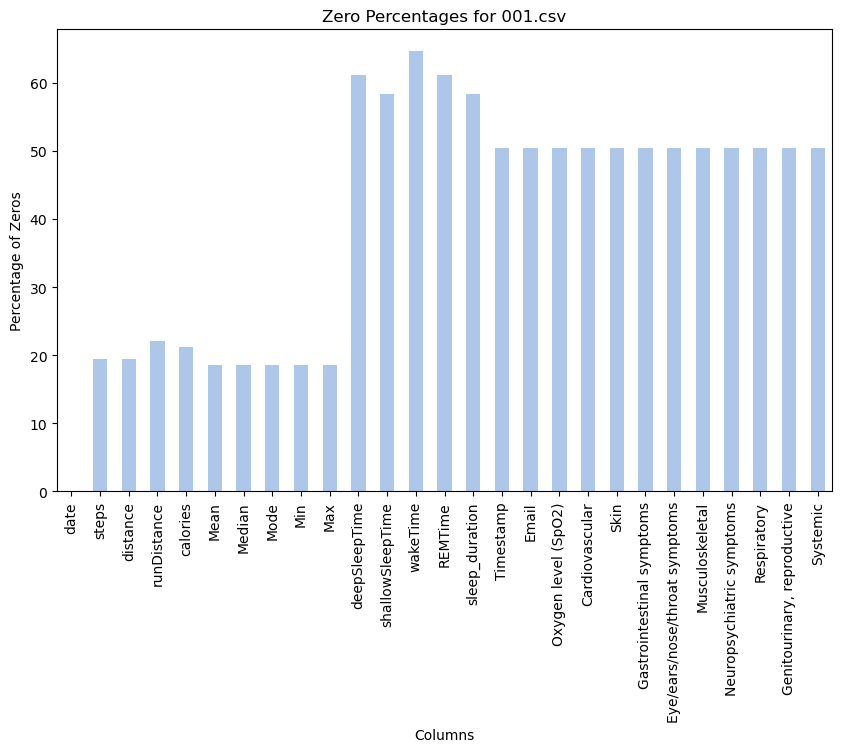

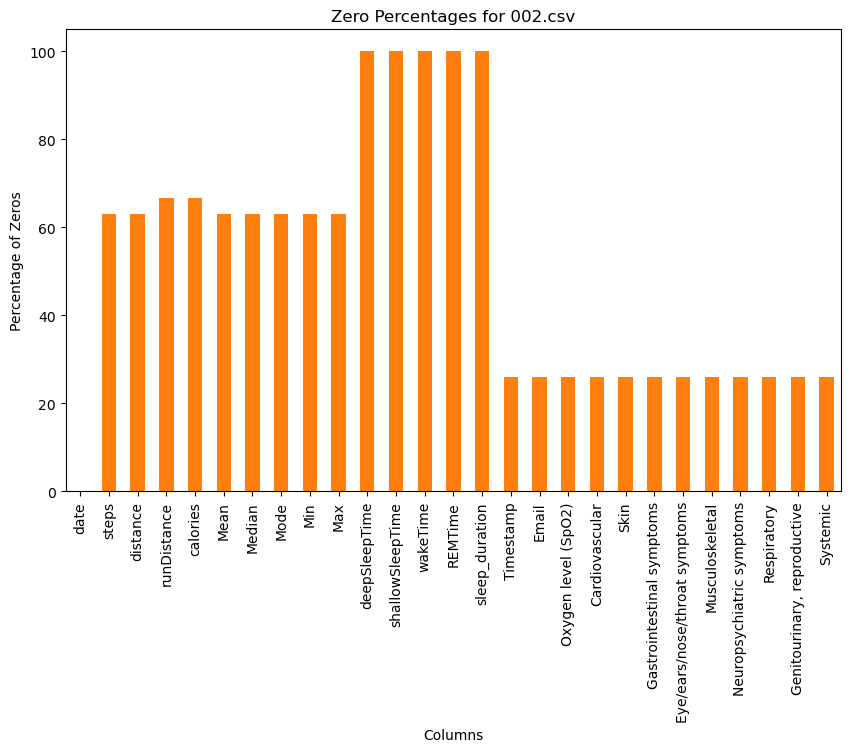

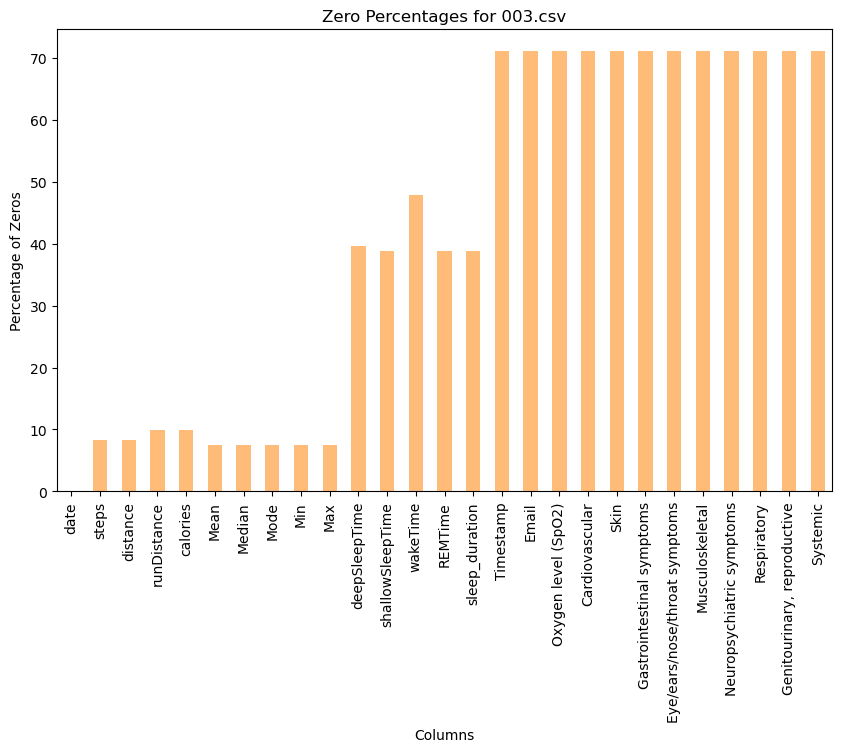

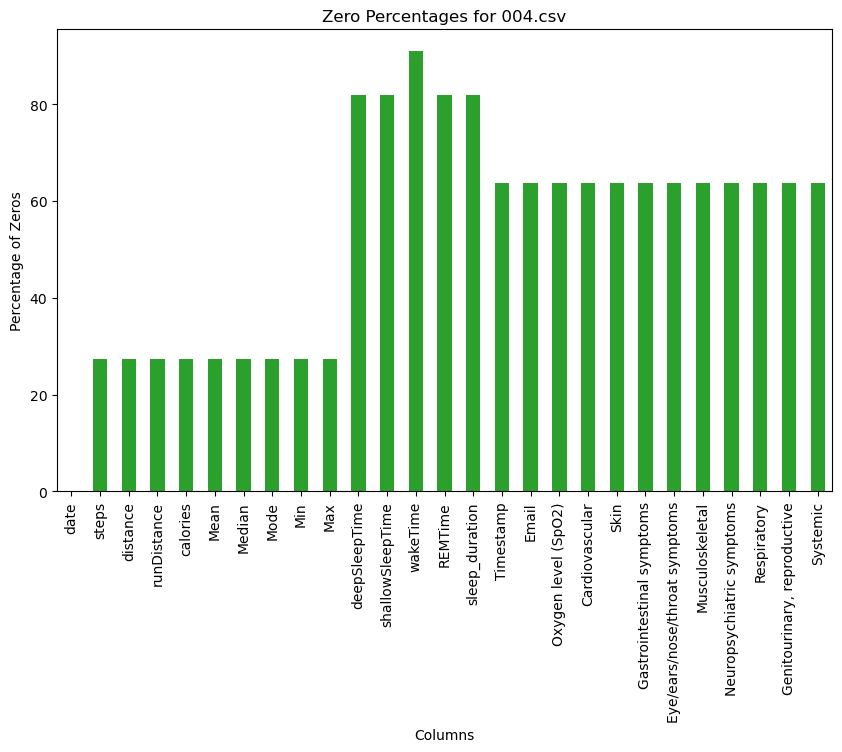

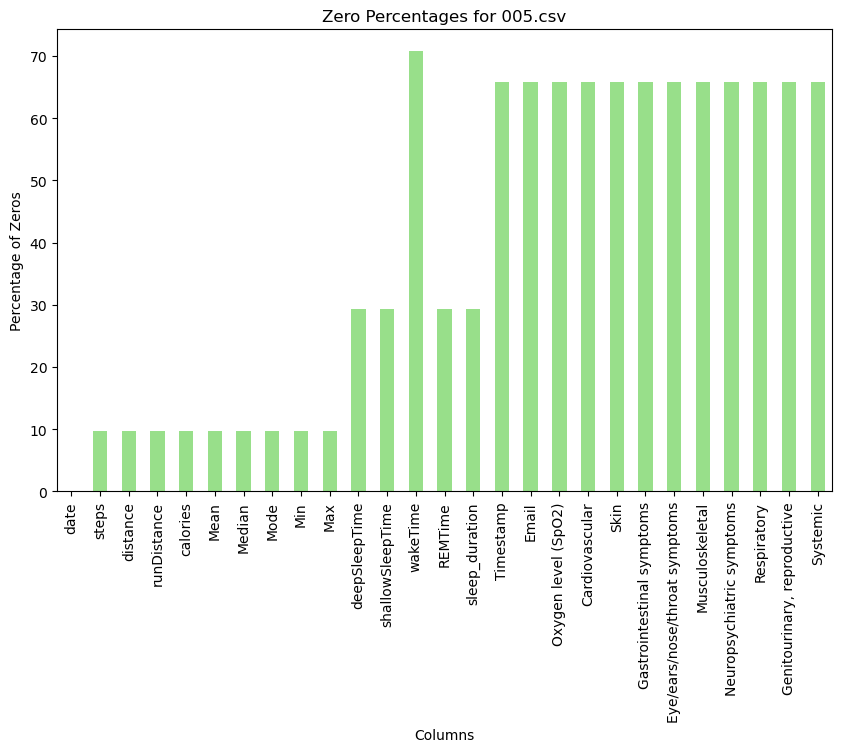

...

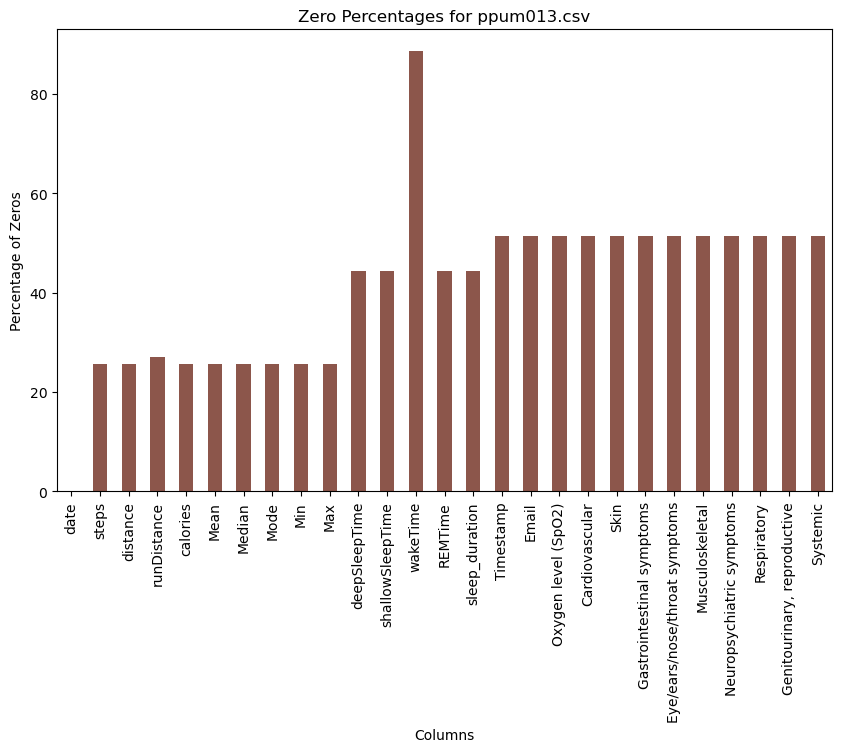

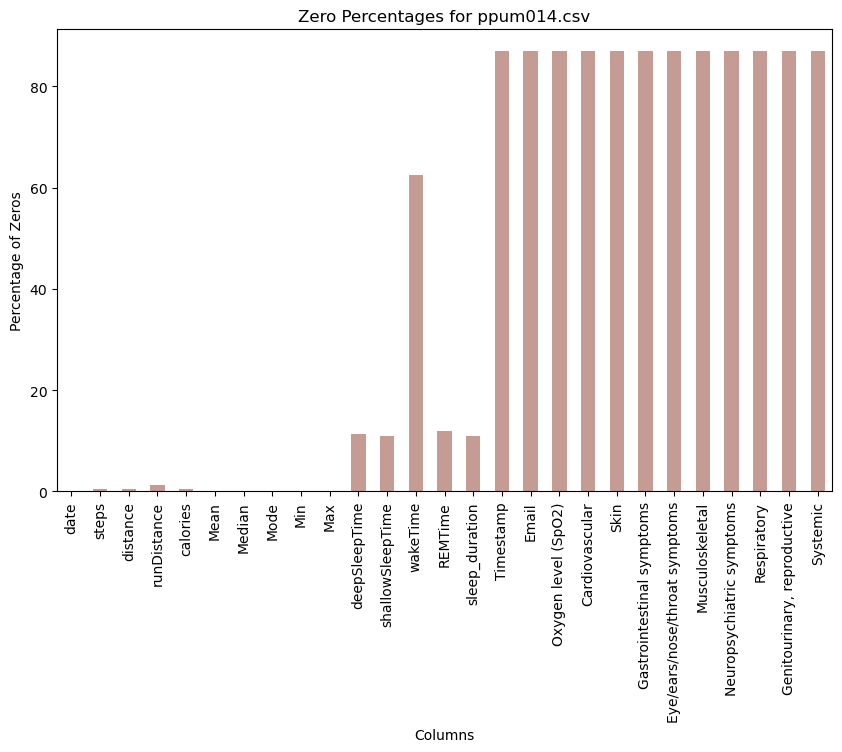

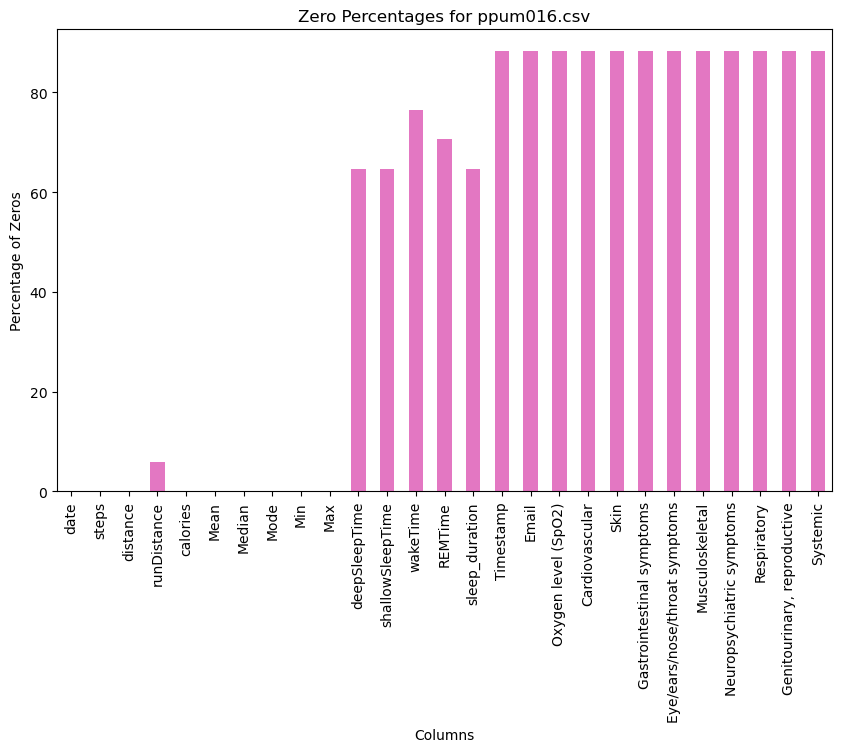

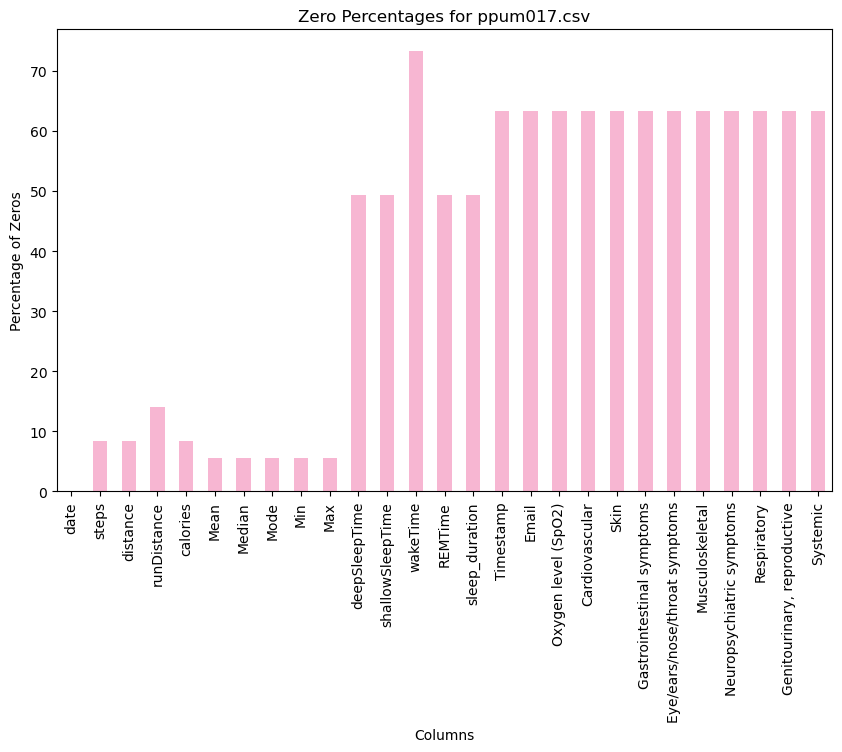

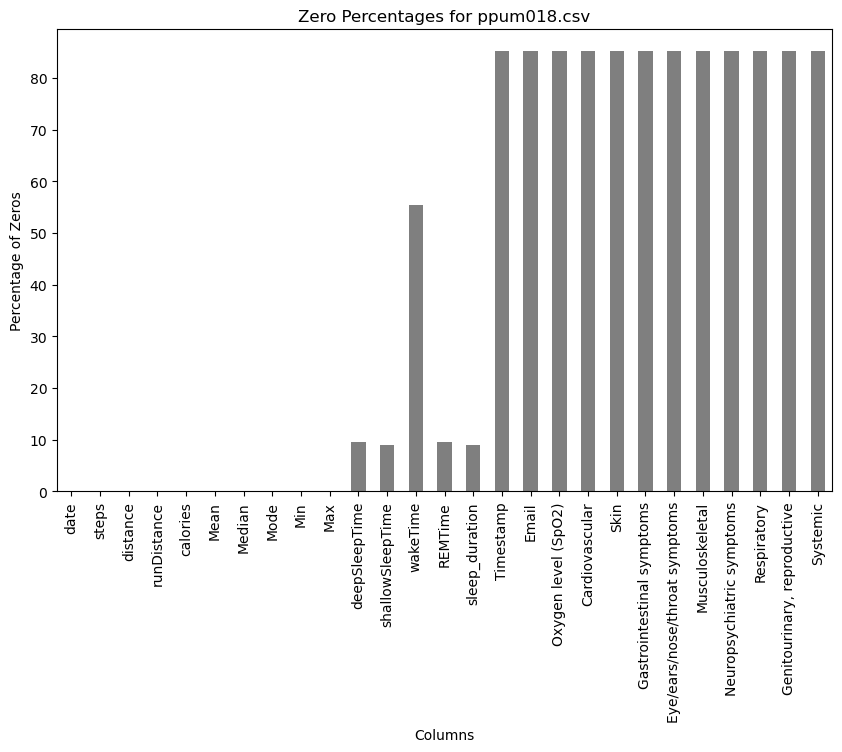

Summary Dataframe:


In [35]:
import pandas as pd
import os
import matplotlib.pyplot as plt

def calculate_zero_percentage(df):
    total_rows = len(df)
    zero_percentages = (df == 0).sum() / total_rows * 100
    return zero_percentages

def process_file(file_path):
    # Read the CSV file into a Pandas dataframe, assuming the file is in CSV format.
    df = pd.read_csv(file_path)
    
    # Replace missing data with 0
    df.fillna(0, inplace=True)
    
    # Calculate zero percentages for each column
    zero_percentages = calculate_zero_percentage(df)
    
    return df, zero_percentages

def process_folder(folder_path):
    zero_percentages_dict = {}
    
    for file_name in os.listdir(folder_path):
        if file_name.endswith(".csv"):  # Adjust the file extension as needed
            file_path = os.path.join(folder_path, file_name)
            df, zero_percentages = process_file(file_path)
            zero_percentages_dict[file_name] = zero_percentages
            
            # Plot the zero percentages for the current file in a different color
            color = plt.cm.tab20(len(zero_percentages_dict) % 20)
            plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
            zero_percentages.plot(kind='bar', rot=90, color=color)
            plt.title(f"Zero Percentages for {file_name}")
            plt.xlabel("Columns")
            plt.ylabel("Percentage of Zeros")
            plt.show()
    
    # Create a summary dataframe with file names as columns
    summary_df = pd.DataFrame(zero_percentages_dict)
    
    return summary_df

folder_path = 'C:/Users/User/Downloads/trial'  # Replace with the path to your folder
result_df = process_folder(folder_path)

# Display the summary dataframe
print("Summary Dataframe:")
result_df

# Save the summary dataframe to a CSV file for future reference
result_df.to_csv('zero_percentages_summary.csv', index=True)

In [36]:
result_df

,001.csv,002.csv,003.csv,004.csv,005.csv,006.csv,007.csv,008.csv,009.csv,010.csv,...,ppum007.csv,ppum008.csv,ppum009.csv,ppum011.csv,ppum012.csv,ppum013.csv,ppum014.csv,ppum016.csv,ppum017.csv,ppum018.csv
Cardiovascular,50.442478,25.925926,71.074380,63.636364,65.853659,48.717949,64.705882,42.0,57.055215,55.294118,...,99.532710,82.294264,58.088235,0.0,39.756098,51.428571,86.938776,88.235294,63.380282,85.119048
Email,50.442478,25.925926,71.074380,63.636364,65.853659,48.717949,64.705882,42.0,57.055215,55.294118,...,99.532710,82.294264,58.088235,0.0,39.756098,51.428571,86.938776,88.235294,63.380282,85.119048
Eye/ears/nose/throat symptoms,50.442478,25.925926,71.074380,63.636364,65.853659,48.717949,64.705882,42.0,57.055215,55.294118,...,99.532710,82.294264,58.088235,0.0,39.756098,51.428571,86.938776,88.235294,63.380282,85.119048
Gastrointestinal symptoms,50.442478,25.925926,71.074380,63.636364,65.853659,48.717949,64.705882,42.0,57.055215,55.294118,...,99.532710,82.294264,58.088235,0.0,39.756098,51.428571,86.938776,88.235294,63.380282,85.119048
"Genitourinary, reproductive",50.442478,25.925926,71.074380,63.636364,65.853659,48.717949,64.705882,42.0,57.055215,55.294118,...,99.532710,82.294264,58.088235,0.0,39.756098,51.428571,86.938776,88.235294,63.380282,85.119048
Max,18.584071,62.962963,7.438017,27.272727,9.756098,0.000000,5.882353,27.0,6.134969,0.000000,...,0.000000,0.498753,4.166667,100.0,5.853659,25.714286,0.000000,0.000000,5.633803,0.000000
Mean,18.584071,62.962963,7.438017,27.272727,9.756098,0.000000,5.882353,27.0,6.134969,0.000000,...,0.000000,0.498753,4.166667,100.0,5.853659,25.714286,0.000000,0.000000,5.633803,0.000000
Median,18.584071,62.962963,7.438017,27.272727,9.756098,0.000000,5.882353,27.0,6.134969,0.000000,...,0.000000,0.498753,4.166667,100.0,5.853659,25.714286,0.000000,0.000000,5.633803,0.000000
Min,18.584071,62.962963,7.438017,27.272727,9.756098,0.000000,5.882353,27.0,6.134969,0.000000,...,0.000000,0.498753,4.166667,100.0,5.853659,25.714286,0.000000,0.000000,5.633803,0.000000
Mode,18.584071,62.962963,7.438017,27.272727,9.756098,0.000000,5.882353,27.0,6.134969,0.000000,...,0.000000,0.498753,4.166667,100.0,5.853659,25.714286,0.000000,0.000000,5.633803,0.000000


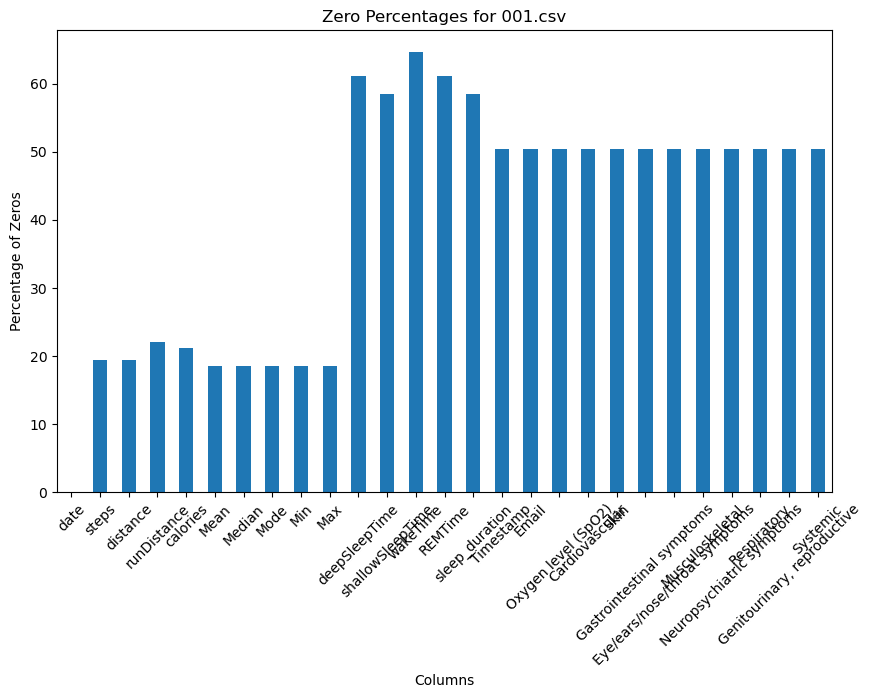

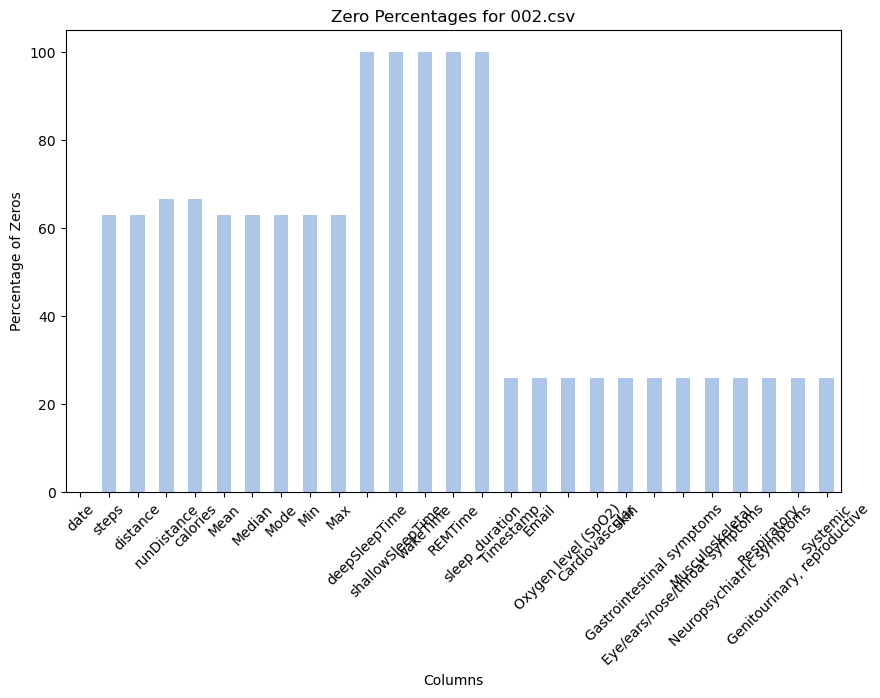

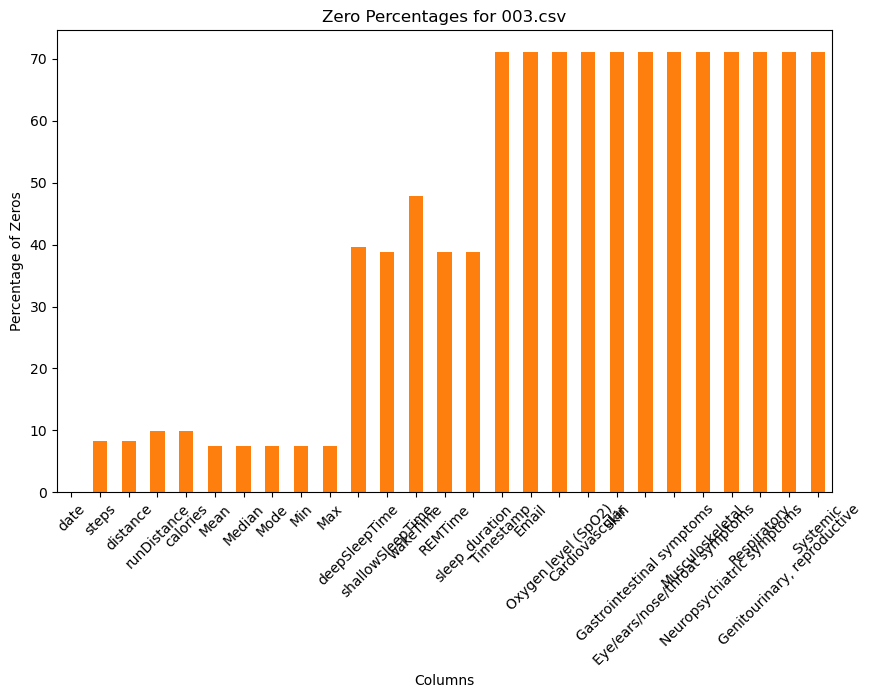

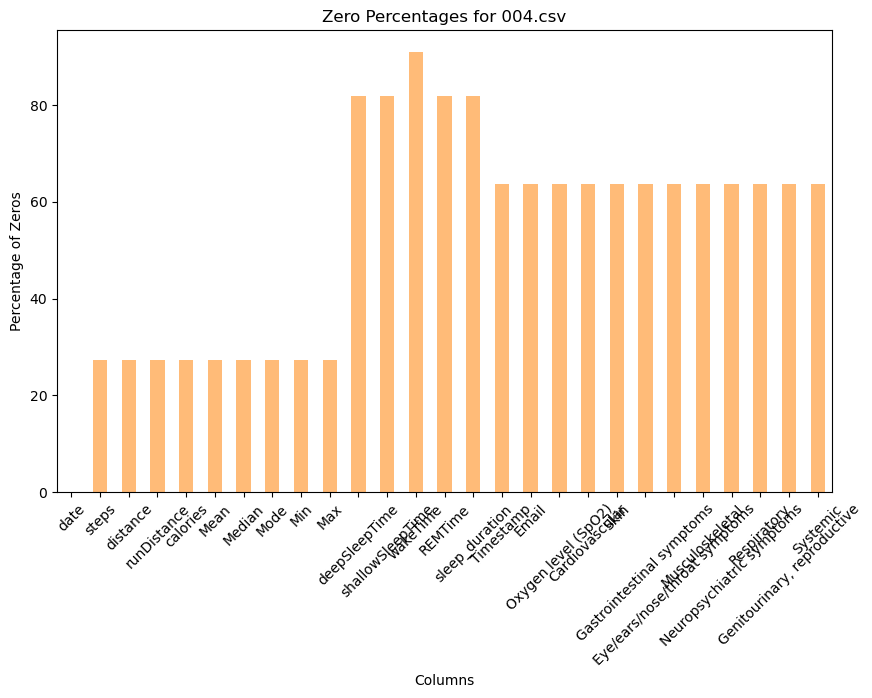

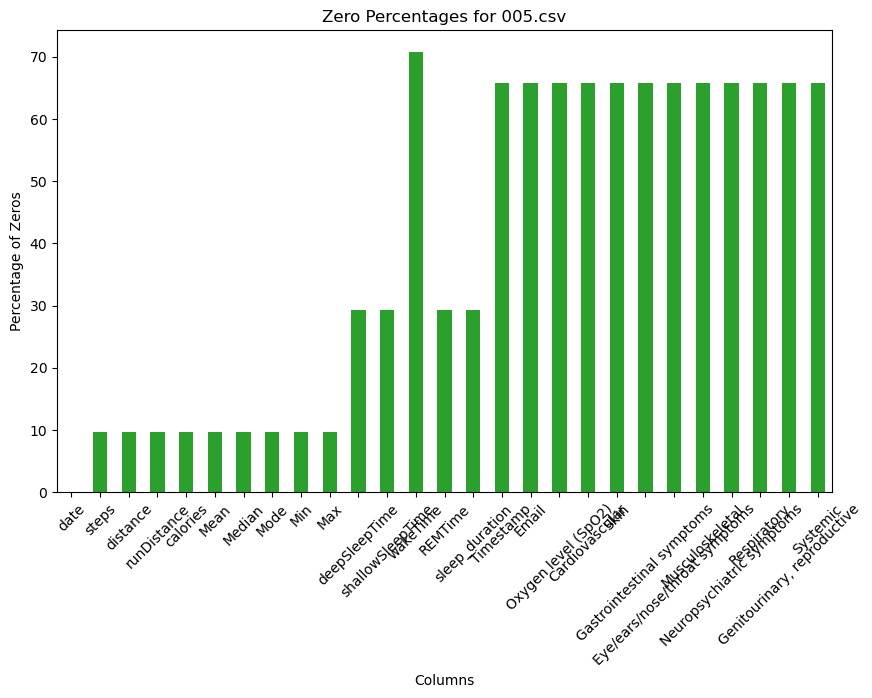

...

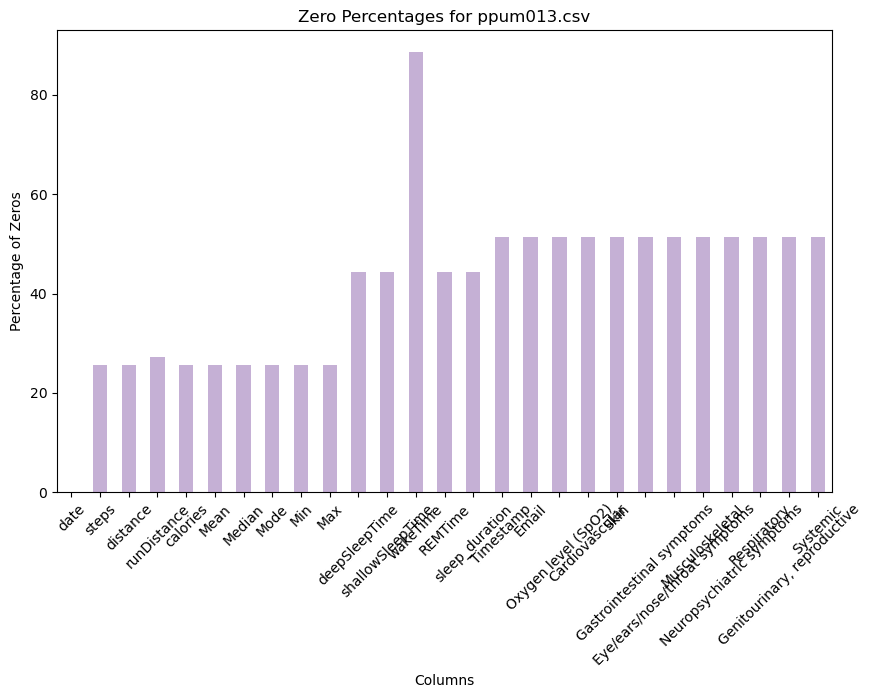

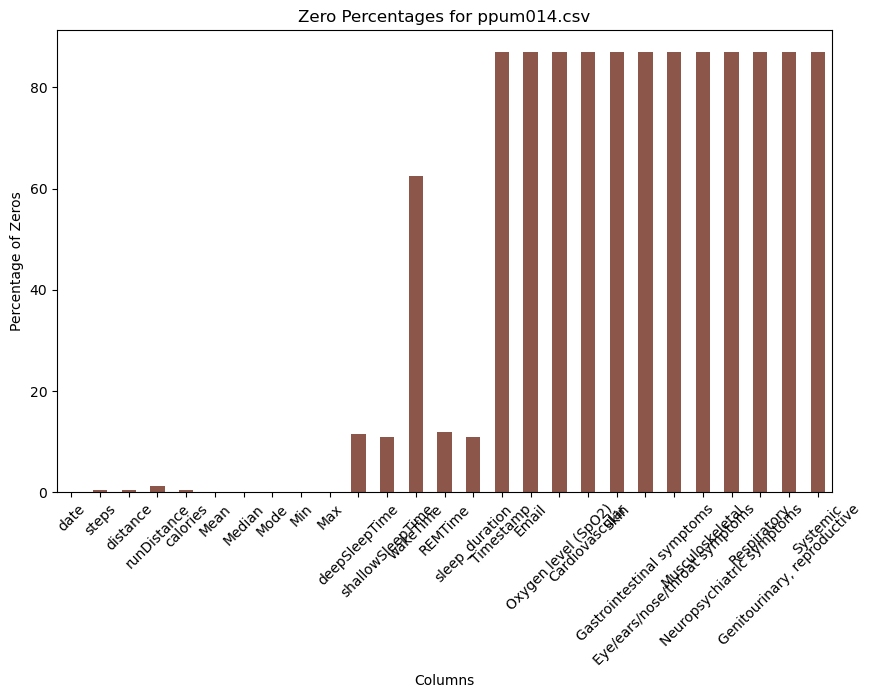

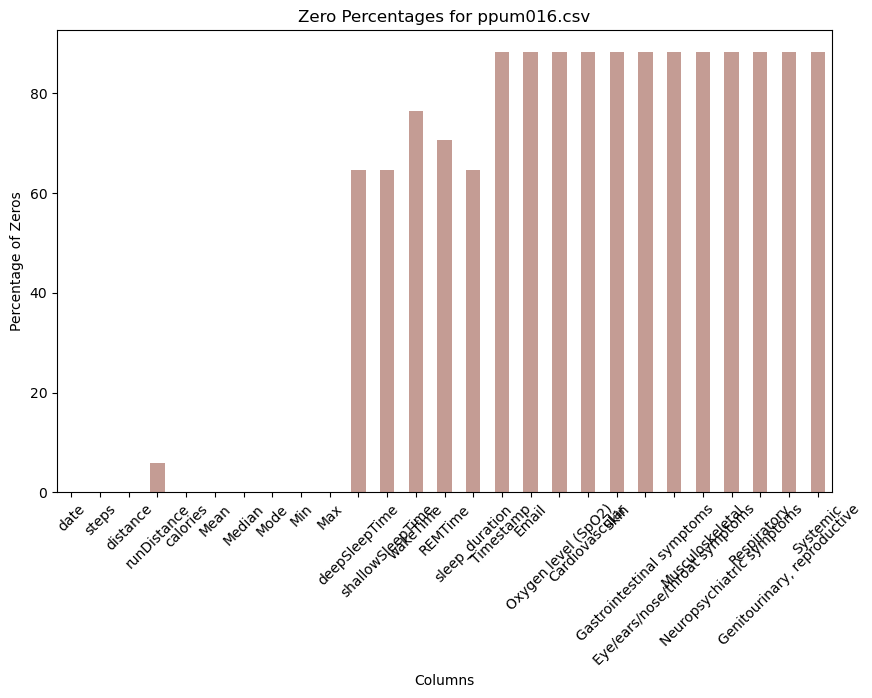

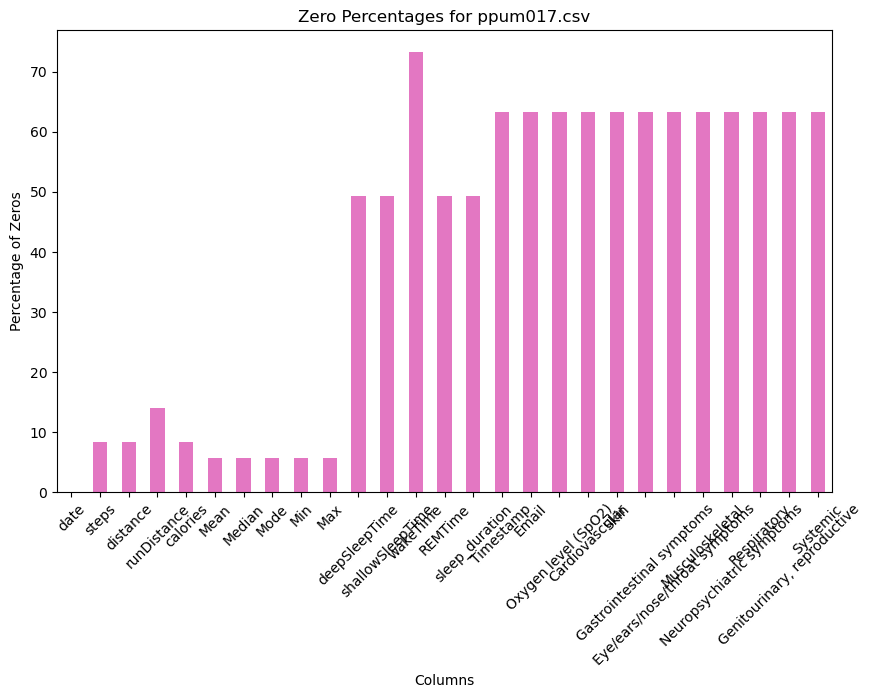

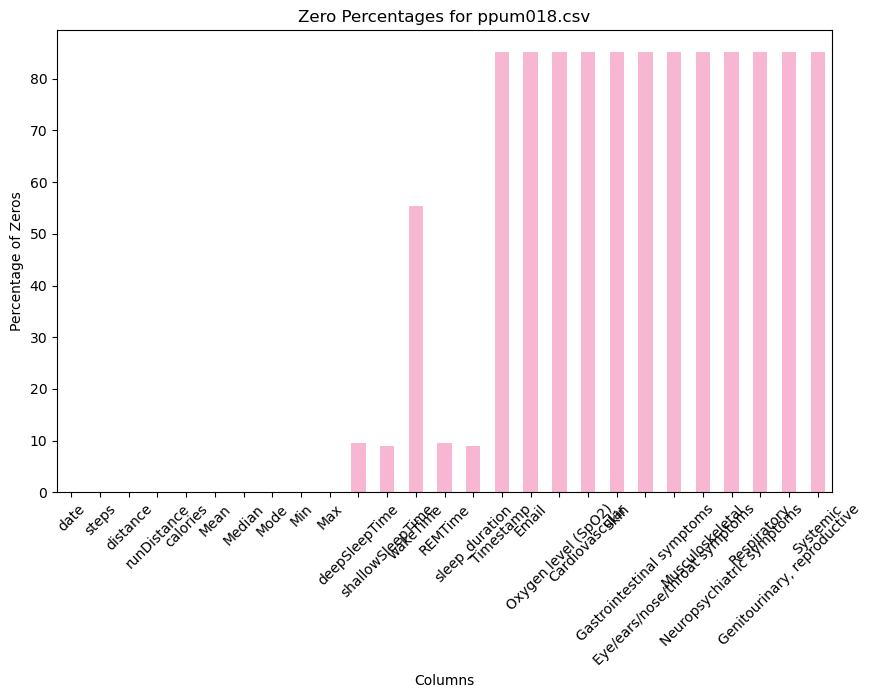

Summary Dataframe:


In [48]:
import pandas as pd
import os
import matplotlib.pyplot as plt

def calculate_zero_percentage(df):
    total_rows = len(df)
    zero_percentages = (df == 0).sum() / total_rows * 100
    return zero_percentages

def process_file(file_path):
    # Read the CSV file into a Pandas dataframe, assuming the file is in CSV format.
    df = pd.read_csv(file_path)
    
    # Replace missing data with 0
    df.fillna(0, inplace=True)
    
    # Calculate zero percentages for each column
    zero_percentages = calculate_zero_percentage(df)
    
    return df, zero_percentages

def process_folder(folder_path):
    result_summary = []
    
    for file_name in os.listdir(folder_path):
        if file_name.endswith(".csv"):  # Adjust the file extension as needed
            file_path = os.path.join(folder_path, file_name)
            df, zero_percentages = process_file(file_path)
            
            # Plot the zero percentages for the current file in a different color
            color = plt.cm.tab20(len(result_summary) % 20)
            plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
            zero_percentages.plot(kind='bar', rot=45, color=color)
            plt.title(f"Zero Percentages for {file_name}")
            plt.xlabel("Columns")
            plt.ylabel("Percentage of Zeros")
            plt.show()
            
            # Calculate the number of columns with more than 50% zeros and list their names
            columns_over_50_percent = zero_percentages[zero_percentages > 50]
            num_columns_over_50_percent = len(columns_over_50_percent)
            column_names_over_50_percent = columns_over_50_percent.index.tolist()
            
            result_summary.append({
                'File Name': file_name,
                'Number of Columns > 50%': num_columns_over_50_percent,
                'Columns > 50%': column_names_over_50_percent
            })

    # Create a summary dataframe
    summary_df = pd.DataFrame(result_summary)
    
    return summary_df

folder_path = 'C:/Users/User/Downloads/trial'  # Replace with the path to your folder
result_df = process_folder(folder_path)

# Display the summary dataframe
print("Summary Dataframe:")
result_df

# Save the summary dataframe to a CSV file for future reference
result_df.to_csv('number of 50% missing columns.csv', index=True)


In [14]:
# result_df

In [15]:
# import pandas as pd
# import matplotlib.pyplot as plt

# # Define a list of custom colors
# custom_colors = ['skyblue', 'lightcoral', 'lightgreen', 'purple', 'black', 'blue', 'orange', 'cyan', 'magenta']

# # colors = plt.cm.get_cmap("tab20", len(result_df))
# # Create a bar chart using result_df.plot
# plt.figure(figsize=(20, 10))  # Adjust the figure size as needed
# ax = result_df.plot(kind='bar', x='File Name', y='Number of Columns > 50%', legend=False, color=custom_colors)
# plt.xlabel('File Name')
# plt.ylabel('Number of Columns > 50%')
# plt.title('Number of Columns > 50% for Each File')
# plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

# # Show the bar chart
# plt.show()

In [64]:
# Create a Series with the counts of each column name
column_counts = result_df['Columns > 50%'].explode().value_counts()

# Create a DataFrame with the sorted counts in descending order
column_counts_result = pd.DataFrame({'Column Name': column_counts.index, 'Frequency': column_counts.values})

# Sort the DataFrame by frequency in descending order
column_counts_result = column_counts_result.sort_values(by='Frequency', ascending=False)

# Display the result
print(column_counts_result)

                      Column Name  Frequency
0                        wakeTime         27
1       Neuropsychiatric symptoms         25
2                     Respiratory         25
3                        Systemic         25
4                       Timestamp         25
5                           Email         25
6             Oxygen level (SpO2)         25
7                  Cardiovascular         25
8                            Skin         25
9       Gastrointestinal symptoms         25
10  Eye/ears/nose/throat symptoms         25
11                Musculoskeletal         25
12    Genitourinary, reproductive         25
13                        REMTime         15
14                  deepSleepTime         13
15               shallowSleepTime         12
16                 sleep_duration         12
17                          steps          3
18                       distance          3
19                    runDistance          3
20                       calories          3
21        

Total columns is **26**.
Total participants is **34**.

In [66]:
# Sort the DataFrame by frequency in descending order
result_df1 = result_df.sort_values(by='Number of Columns > 50%', ascending=False)

# Display the result
result_df1

,File Name,Number of Columns > 50%,Columns > 50%
0,001.csv,17,"[deepSleepTime, shallowSleepTime, wakeTime, RE..."
15,016.csv,17,"[deepSleepTime, shallowSleepTime, wakeTime, RE..."
3,004.csv,17,"[deepSleepTime, shallowSleepTime, wakeTime, RE..."
31,ppum016.csv,17,"[deepSleepTime, shallowSleepTime, wakeTime, RE..."
6,007.csv,17,"[deepSleepTime, shallowSleepTime, wakeTime, RE..."
20,ppum002.csv,17,"[deepSleepTime, shallowSleepTime, wakeTime, RE..."
11,012.csv,17,"[deepSleepTime, shallowSleepTime, wakeTime, RE..."
23,ppum006.csv,14,"[wakeTime, REMTime, Timestamp, Email, Oxygen l..."
19,ppum001.csv,14,"[steps, distance, runDistance, calories, Mean,..."
22,ppum005.csv,14,"[wakeTime, REMTime, Timestamp, Email, Oxygen l..."


<Figure size 2000x1000 with 0 Axes>

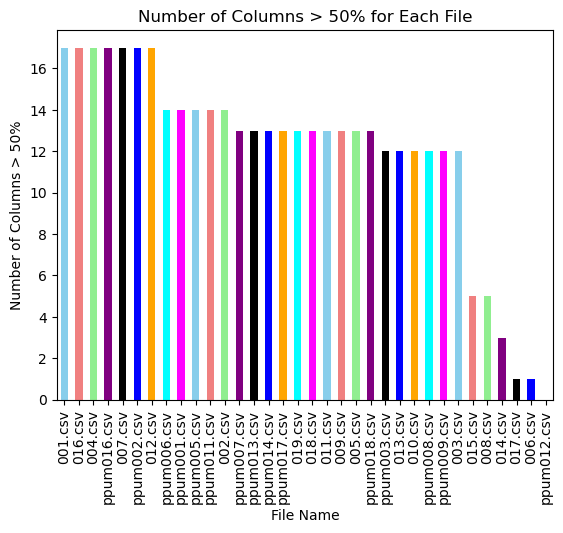

In [67]:
# Define a list of custom colors
custom_colors = ['skyblue', 'lightcoral', 'lightgreen', 'purple', 'black', 'blue', 'orange', 'cyan', 'magenta']

# Create a bar chart using result_df.plot
plt.figure(figsize=(20, 10))  # Adjust the figure size as needed
ax = result_df1.plot(kind='bar', x='File Name', y='Number of Columns > 50%', legend=False, color=custom_colors)
plt.xlabel('File Name')
plt.ylabel('Number of Columns > 50%')
plt.title('Number of Columns > 50% for Each File')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

# Show the bar chart
plt.show()

Above charts show the amount of columns in each file that contains more than 50% missing data.

In [73]:
import pandas as pd
import os
import matplotlib.pyplot as plt

def calculate_zero_percentage(df):
    total_rows = len(df)
    zero_percentages = (df == 0).sum() / total_rows * 100
    return zero_percentages

def process_file(file_path):
    # Read the CSV file into a Pandas dataframe, assuming the file is in CSV format.
    df = pd.read_csv(file_path)
    
    # Replace missing data with 0
    df.fillna(0, inplace=True)
    
    # Calculate zero percentages for each column
    zero_percentages = calculate_zero_percentage(df)
    
    return df, zero_percentages

def process_folder(folder_path):
    result_summary = []
    
    for file_name in os.listdir(folder_path):
        if file_name.endswith(".csv"):  # Adjust the file extension as needed
            file_path = os.path.join(folder_path, file_name)
            df, zero_percentages = process_file(file_path)
            
#             # Plot the zero percentages for the current file in a different color
#             color = plt.cm.tab20(len(result_summary) % 20)
#             plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
#             zero_percentages.plot(kind='bar', rot=45, color=color)
#             plt.title(f"Zero Percentages for {file_name}")
#             plt.xlabel("Columns")
#             plt.ylabel("Percentage of Zeros")
#             plt.show()
            
            # Calculate the number of columns with more than 90% zeros and list their names
            columns_over_90_percent = zero_percentages[zero_percentages > 90]
            num_columns_over_90_percent = len(columns_over_90_percent)
            column_names_over_90_percent = columns_over_90_percent.index.tolist()
            
            result_summary.append({
                'File Name': file_name,
                'Number of Columns > 90%': num_columns_over_90_percent,
                'Columns > 90%': column_names_over_90_percent
            })

    # Create a summary dataframe
    summary_df = pd.DataFrame(result_summary)
    
    return summary_df

folder_path = 'C:/Users/User/Downloads/trial'  # Replace with the path to your folder
ninetypercentcolumns = process_folder(folder_path)

# Display the summary dataframe
print("Summary Dataframe:")
ninetypercentcolumns

# Sort the DataFrame by frequency in descending order
ninetypercentcolumns = ninetypercentcolumns.sort_values(by='Number of Columns > 90%', ascending=False)

# Display the result
ninetypercentcolumns

# # Save the summary dataframe to a CSV file for future reference
# result_df.to_csv('number of 50% missing columns.csv', index=True)

Summary Dataframe:


,File Name,Number of Columns > 90%,Columns > 90%
27,ppum011.csv,14,"[steps, distance, runDistance, calories, Mean,..."
23,ppum006.csv,13,"[REMTime, Timestamp, Email, Oxygen level (SpO2..."
21,ppum003.csv,12,"[Timestamp, Email, Oxygen level (SpO2), Cardio..."
24,ppum007.csv,12,"[Timestamp, Email, Oxygen level (SpO2), Cardio..."
20,ppum002.csv,5,"[deepSleepTime, shallowSleepTime, wakeTime, RE..."
19,ppum001.csv,5,"[deepSleepTime, shallowSleepTime, wakeTime, RE..."
1,002.csv,5,"[deepSleepTime, shallowSleepTime, wakeTime, RE..."
14,015.csv,5,"[deepSleepTime, shallowSleepTime, wakeTime, RE..."
11,012.csv,5,"[deepSleepTime, shallowSleepTime, wakeTime, RE..."
7,008.csv,5,"[deepSleepTime, shallowSleepTime, wakeTime, RE..."


In [2]:
dataduration = pd.read_excel('C:/Users/User/Downloads/WQD7002 Data Science Research Project/patient_dataduration.xlsx')
dataduration

,patient,miband_start date,miband_end date,days,months,questionnaire start date,questionnaire end date,status,latest COVID infection,data collected after COVID_days,data collected after COVID_month,data collected after COVID_year,comment
0,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN
1,ep001,2023-02-07,2023-07-11,154.0,5.0,2023-02-11 00:00:00,2023-07-05 00:00:00,normal,NaT,NaN,NaN,NaN,no significant symptoms
2,ep002,2023-02-07,2023-02-19,12.0,0.0,2023-02-11 00:00:00,2023-06-19 00:00:00,normal,NaT,NaN,NaN,NaN,"no sleep data at all, no symptoms stated"
3,ep003,2023-02-07,2023-07-06,149.0,4.0,2023-02-11 00:00:00,2023-07-12 00:00:00,normal,NaT,NaN,NaN,NaN,NaN
4,ep004,2023-02-07,2023-03-15,36.0,1.0,2023-02-13 00:00:00,2023-03-17 00:00:00,normal,NaT,NaN,NaN,NaN,"no significant symptoms, sleep data only 2 day..."
5,ep005,2023-02-08,2023-03-15,35.0,1.0,2023-02-13 00:00:00,2023-07-28 00:00:00,normal,NaT,NaN,NaN,NaN,quite a number of consistent symptoms
6,ep006,2023-02-08,2023-05-02,83.0,2.0,2023-02-11 00:00:00,2023-05-01 00:00:00,normal,NaT,NaN,NaN,NaN,no significant symptoms stated
7,ep007,2023-02-07,2023-07-07,150.0,5.0,2023-02-11 00:00:00,2023-07-10 00:00:00,normal,NaT,NaN,NaN,NaN,no significant symptoms stated
8,ep008,2023-03-09,2023-07-22,135.0,4.0,2023-02-11 00:00:00,2023-07-24 00:00:00,normal,NaT,NaN,NaN,NaN,no significant symptoms stated
9,ep009,2023-02-07,2023-07-20,163.0,5.0,2023-02-11 00:00:00,2023-07-28 00:00:00,normal,NaT,NaN,NaN,NaN,no significant symptoms stated


In [3]:
dataduration.drop(0, inplace=True)
dataduration

,patient,miband_start date,miband_end date,days,months,questionnaire start date,questionnaire end date,status,latest COVID infection,data collected after COVID_days,data collected after COVID_month,data collected after COVID_year,comment
1,ep001,2023-02-07,2023-07-11,154.0,5.0,2023-02-11 00:00:00,2023-07-05 00:00:00,normal,NaT,NaN,NaN,NaN,no significant symptoms
2,ep002,2023-02-07,2023-02-19,12.0,0.0,2023-02-11 00:00:00,2023-06-19 00:00:00,normal,NaT,NaN,NaN,NaN,"no sleep data at all, no symptoms stated"
3,ep003,2023-02-07,2023-07-06,149.0,4.0,2023-02-11 00:00:00,2023-07-12 00:00:00,normal,NaT,NaN,NaN,NaN,NaN
4,ep004,2023-02-07,2023-03-15,36.0,1.0,2023-02-13 00:00:00,2023-03-17 00:00:00,normal,NaT,NaN,NaN,NaN,"no significant symptoms, sleep data only 2 day..."
5,ep005,2023-02-08,2023-03-15,35.0,1.0,2023-02-13 00:00:00,2023-07-28 00:00:00,normal,NaT,NaN,NaN,NaN,quite a number of consistent symptoms
6,ep006,2023-02-08,2023-05-02,83.0,2.0,2023-02-11 00:00:00,2023-05-01 00:00:00,normal,NaT,NaN,NaN,NaN,no significant symptoms stated
7,ep007,2023-02-07,2023-07-07,150.0,5.0,2023-02-11 00:00:00,2023-07-10 00:00:00,normal,NaT,NaN,NaN,NaN,no significant symptoms stated
8,ep008,2023-03-09,2023-07-22,135.0,4.0,2023-02-11 00:00:00,2023-07-24 00:00:00,normal,NaT,NaN,NaN,NaN,no significant symptoms stated
9,ep009,2023-02-07,2023-07-20,163.0,5.0,2023-02-11 00:00:00,2023-07-28 00:00:00,normal,NaT,NaN,NaN,NaN,no significant symptoms stated
10,ep010,2023-02-09,2023-07-28,169.0,5.0,2023-02-11 00:00:00,2023-07-28 00:00:00,normal,NaT,NaN,NaN,NaN,no symptoms stated


In [4]:
# Create a Series with the counts of each column name
status_count = dataduration['status'].value_counts()

# Create a DataFrame with the sorted counts in descending order
status_count_result = pd.DataFrame({'Column Name': status_count.index, 'Frequency': status_count.values})

# Display the result
status_count_result

,Column Name,Frequency
0,COVID,22
1,normal,14


<Figure size 2000x1000 with 0 Axes>

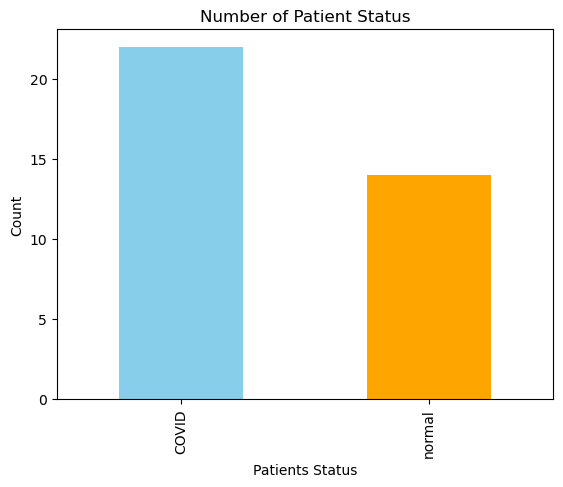

In [6]:
import matplotlib.pyplot as plt

# Define a list of custom colors
custom_colors = ['skyblue', 'orange']

# Create a bar chart using result_df.plot
plt.figure(figsize=(20, 10))  # Adjust the figure size as needed
ax = status_count_result.plot(kind='bar', x='Column Name', y='Frequency', legend=False, color=custom_colors)
plt.xlabel('Patients Status')
plt.ylabel('Count')
plt.title('Number of Patient Status')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

# Show the bar chart
plt.show()

<Figure size 2000x1000 with 0 Axes>

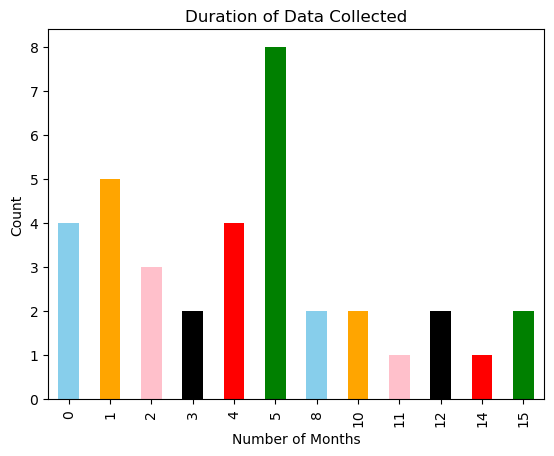

In [7]:
dataduration['months'] = dataduration['months'].astype(int)

# Create Series with the counts of each column name
duration_in_month_count = dataduration['months'].value_counts()

# Create a DataFrame with the sorted counts in descending order
duration_in_month_count_result = pd.DataFrame({'Number of Months': duration_in_month_count.index, 'Frequency': duration_in_month_count.values})

# Display the result
duration_in_month_count_result

# Sort the DataFrame by frequency in descending order
duration_in_month_count_result = duration_in_month_count_result.sort_values(by='Number of Months', ascending=True)

# Define a list of custom colors
custom_colors = ['skyblue', 'orange', 'pink','black','red','green']

# Create a bar chart using result_df.plot
plt.figure(figsize=(20, 10))  # Adjust the figure size as needed
ax = duration_in_month_count_result.plot(kind='bar', x='Number of Months', y='Frequency', legend=False, color=custom_colors)
plt.xlabel('Number of Months')
plt.ylabel('Count')
plt.title('Duration of Data Collected')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

# Show the bar chart
plt.show()

Mibands and symptoms data was collected in the duration of either less than 1 month or 15 months at most. Data for 5 individuals were collected for less than a month.

In [8]:
duration_in_month_count_result

,Number of Months,Frequency
2,0,4
1,1,5
4,2,3
5,3,2
3,4,4
0,5,8
9,8,2
7,10,2
10,11,1
8,12,2


C:\Users\User\AppData\Local\Temp\ipykernel_7196\382361854.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  COVID_patients['data collected after COVID_month'] = COVID_patients['data collected after COVID_month'].astype(int)


<Figure size 2000x1000 with 0 Axes>

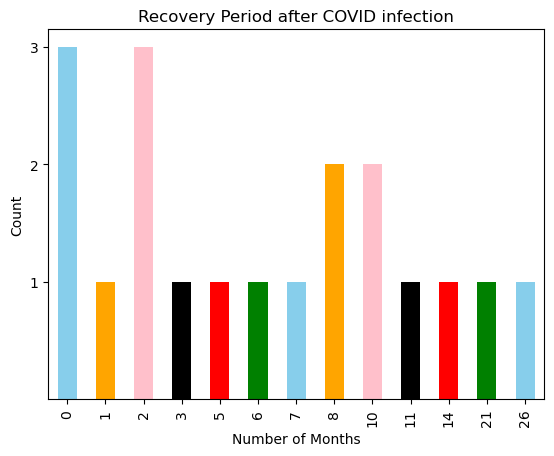

In [2]:
import pandas as pd
import matplotlib.pyplot as plt

dataduration = pd.read_excel('C:/Users/User/Downloads/WQD7002 Data Science Research Project/patient_dataduration.xlsx')
dataduration

COVID_patients = dataduration[(dataduration['status'] == 'COVID') & (~dataduration['data collected after COVID_month'].isna())]
COVID_patients['data collected after COVID_month'] = COVID_patients['data collected after COVID_month'].astype(int)

# Create Series with the counts of each column name
dataduration_afterCOVID_month_count = COVID_patients['data collected after COVID_month'].value_counts()

# Create a DataFrame with the sorted counts in descending order
dataduration_afterCOVID_month_count_result = pd.DataFrame({'Number of Months': dataduration_afterCOVID_month_count.index, 'Frequency': dataduration_afterCOVID_month_count.values})

# Display the result
dataduration_afterCOVID_month_count_result['Frequency'] = dataduration_afterCOVID_month_count_result['Frequency'].astype(int)

# Sort the DataFrame by frequency in descending order
dataduration_afterCOVID_month_count_result = dataduration_afterCOVID_month_count_result.sort_values(by='Number of Months', ascending=True)

# Define a list of custom colors
custom_colors = ['skyblue', 'orange', 'pink','black','red','green']

# Create a bar chart using result_df.plot
plt.figure(figsize=(20, 10))  # Adjust the figure size as needed
ax = dataduration_afterCOVID_month_count_result.plot(kind='bar', x='Number of Months', y='Frequency', legend=False, color=custom_colors)
plt.xlabel('Number of Months')
plt.ylabel('Count')
plt.title('Recovery Period after COVID infection')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.yticks([1, 2, 3])
# Show the bar chart
plt.show()

For COVID patients, most data were collected at less than a year and 2 months post-COVID. There are two patients whom data were collected 8 months and 10 months each post-COVID.

In [3]:
dataduration_afterCOVID_month_count_result

,Number of Months,Frequency
0,0,3
10,1,1
1,2,3
8,3,1
12,5,1
11,6,1
7,7,1
2,8,2
3,10,2
9,11,1


In [4]:
import pandas as pd

df = dataduration_afterCOVID_month_count_result

# Define a function to group the data
def group_months(row):
    if row['Number of Months'] <= 6:
        return '0-6 Months'
    else:
        return 'More than 6 Months'

# Apply the grouping function and create a new column 'Group'
df['Group'] = df.apply(group_months, axis=1)

# Group the data by 'Group' and sum the 'Frequency'
grouped_data = df.groupby('Group')['Frequency'].sum().reset_index()

# Calculate the percentage for each group
total_frequency = df['Frequency'].sum()
grouped_data['Percentage'] = ((grouped_data['Frequency'] / total_frequency) * 100).round(1)

# Display the grouped data
grouped_data


,Group,Frequency,Percentage
0,0-6 Months,10,52.6
1,More than 6 Months,9,47.4


In [106]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168 entries, 0 to 167
Data columns (total 27 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   date                           168 non-null    object 
 1   steps                          168 non-null    int64  
 2   distance                       168 non-null    int64  
 3   runDistance                    168 non-null    int64  
 4   calories                       168 non-null    int64  
 5   Mean                           168 non-null    float64
 6   Median                         168 non-null    int64  
 7   Mode                           168 non-null    int64  
 8   Min                            168 non-null    int64  
 9   Max                            168 non-null    int64  
 10  deepSleepTime                  168 non-null    int64  
 11  shallowSleepTime               168 non-null    int64  
 12  wakeTime                       168 non-null    int

In [ ]:
import pandas as pd
import os

# Define the columns to extract symptoms from
symptoms_columns = ['Cardiovascular', 'Skin', 'Gastrointestinal symptoms',
                    'Eye/ears/nose/throat symptoms', 'Musculoskeletal',
                    'Neuropsychiatric symptoms', 'Respiratory',
                    'Genitourinary, reproductive', 'Systemic']

# Create an empty DataFrame to store the results
symptoms_df = pd.DataFrame(columns=['File Name', 'Symptoms'])

folder_path = 'C:/Users/User/Downloads/trial'  # Replace with the path to your folder

for file_name in os.listdir(folder_path):
    if file_name.endswith(".csv"):
        file_path = os.path.join(folder_path, file_name)

        # Read the CSV file into a Pandas DataFrame
        df = pd.read_csv(file_path)

        # Extract the specified columns
        selected_columns = df[symptoms_columns]

# Initialize an empty DataFrame to store the extracted symptoms
symptoms_df = pd.DataFrame(columns=['Category', 'Symptom'])

# Extract and transform the symptoms
for category, symptoms in df.items():
    for symptom in symptoms:
        symptom_list = symptom.split(';')
        for s in symptom_list:
            symptoms_df = symptoms_df.append({'Category': category, 'Symptom': s}, ignore_index=True)

# Data Analysis (Example: Count the frequency of each symptom)
symptom_counts = symptoms_df['Symptom'].value_counts()

# Data Visualization (Example: Bar chart of symptom frequencies)
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
symptom_counts.plot(kind='bar')
plt.title('Frequency of Symptoms')
plt.xlabel('Symptoms')
plt.ylabel('Frequency')
plt.xticks(rotation=45)  # Rotate x-axis labels for readability
plt.show()


In [20]:
import pandas as pd
import os

# Define the folder path where your data files are located
folder_path = 'C:/Users/User/Downloads/trial'

# Define the symptom columns
symptom_columns = [
    'Cardiovascular', 'Skin', 'Gastrointestinal symptoms',
    'Eye/ears/nose/throat symptoms', 'Musculoskeletal',
    'Neuropsychiatric symptoms', 'Respiratory',
    'Genitourinary, reproductive', 'Systemic'
]

# Initialize an empty DataFrame to store the symptoms
all_symptoms_df = pd.DataFrame(columns=['File', 'Category', 'Symptom'])

# Loop through files in the folder
for file_name in os.listdir(folder_path):
    if file_name.endswith(".csv"):
        file_path = os.path.join(folder_path, file_name)

        # Read the CSV file into a DataFrame
        df = pd.read_csv(file_path)

        # Initialize a DataFrame for symptoms in the current file
        symptoms_df = pd.DataFrame(columns=['Category', 'Symptom'])

        # Iterate over the symptom columns and extract symptoms
        for column in symptom_columns:
            # Filter rows without missing values in the symptom column
            non_missing_rows = df[df[column].notna()]

            # Extract and split semicolon-separated symptoms
            for index, row in non_missing_rows.iterrows():
                symptoms = row[column].split(';')
                for symptom in symptoms:
                    symptoms_df = symptoms_df.append({'Category': column, 'Symptom': symptom}, ignore_index=True)

        # Calculate frequency counts for symptoms in the current file
        symptom_counts = symptoms_df['Symptom'].value_counts().reset_index()
        symptom_counts.columns = ['Symptom', 'Frequency']

        # Add the file name to the DataFrame
        symptom_counts['File'] = file_name

        # Append the frequency counts to the overall DataFrame
        all_symptoms_df = all_symptoms_df.append(symptom_counts, ignore_index=True)

# Data Analysis (Example: Frequency counts for all symptoms)
all_symptoms_df['Frequency'] = all_symptoms_df['Frequency'].astype(int)
all_symptoms_df

# all_symptoms_df.to_csv('separated_symptoms_per_file.csv', index=False)

In [17]:
all_symptoms_df.sample(20)

,File,Category,Symptom,Frequency
405,ppum014.csv,Systemic,Hair loss,22
4,001.csv,Systemic,Dizziness,1
220,015.csv,Systemic,Dehydrated,1
47,005.csv,Systemic,"Peeling skin, Skin rashes, Hair loss",3
35,003.csv,Systemic,"Chills, Feeling very tired, Weakness, Easy swe...",1
304,ppum005.csv,Systemic,Dizziness,24
387,ppum013.csv,Systemic,Shortness of breath,2
364,ppum013.csv,Systemic,Headaches,13
82,007.csv,Systemic,Skin rashes,4
186,014.csv,Systemic,"Diarrhoea, Nausea",1


In [26]:
all_symptoms_df

,Category,Symptom
0,Cardiovascular,NO SYMPTOM
1,Cardiovascular,NO SYMPTOM
2,Cardiovascular,NO SYMPTOM
3,Cardiovascular,NO SYMPTOM
4,Cardiovascular,NO SYMPTOM
...,...,...
14792,Systemic,NO SYMPTOMS
14793,Systemic,NO SYMPTOMS
14794,Systemic,NO SYMPTOMS
14795,Systemic,NO SYMPTOMS


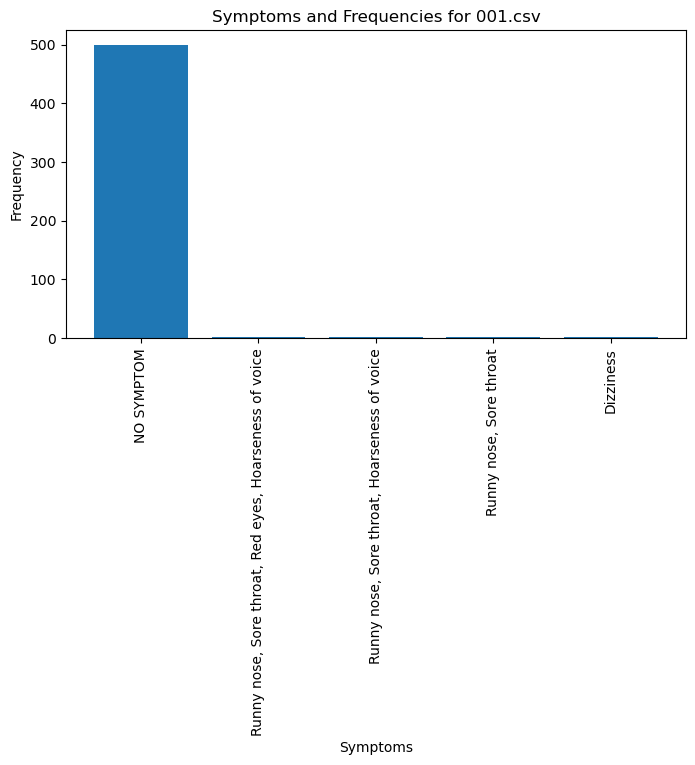

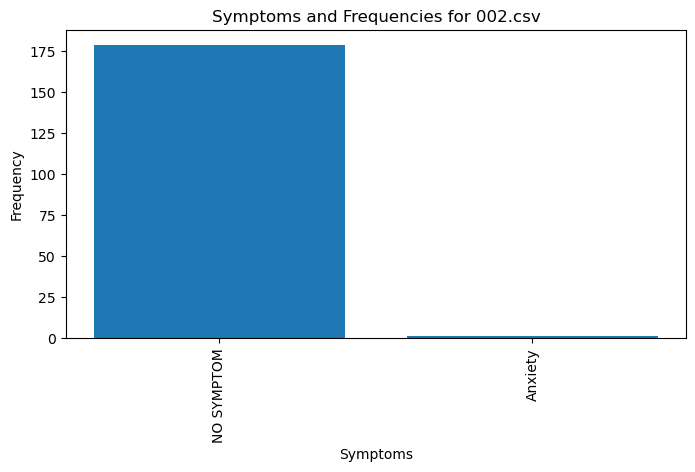

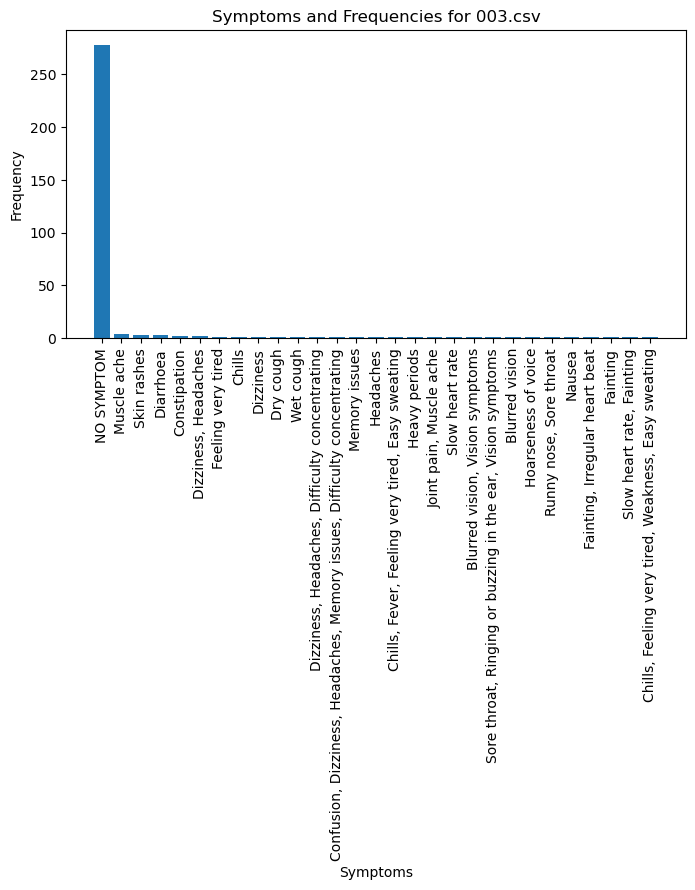

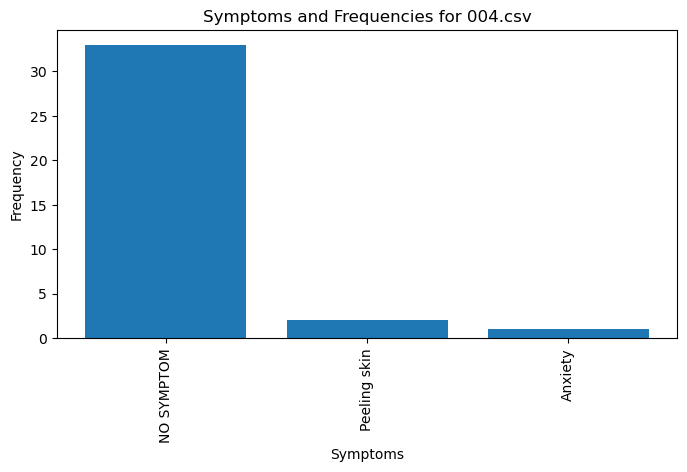

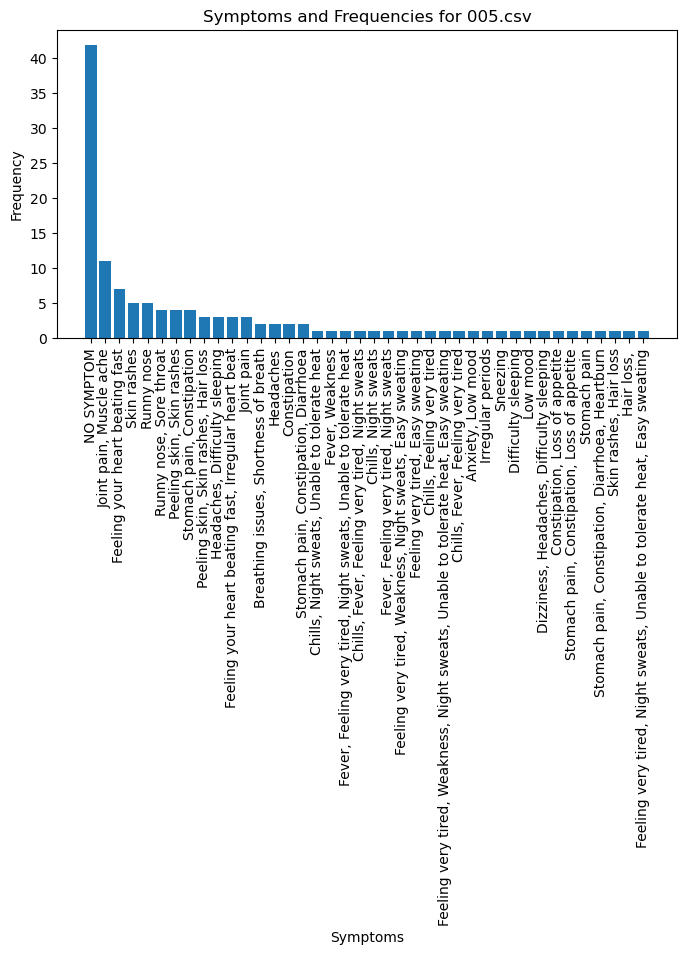

...

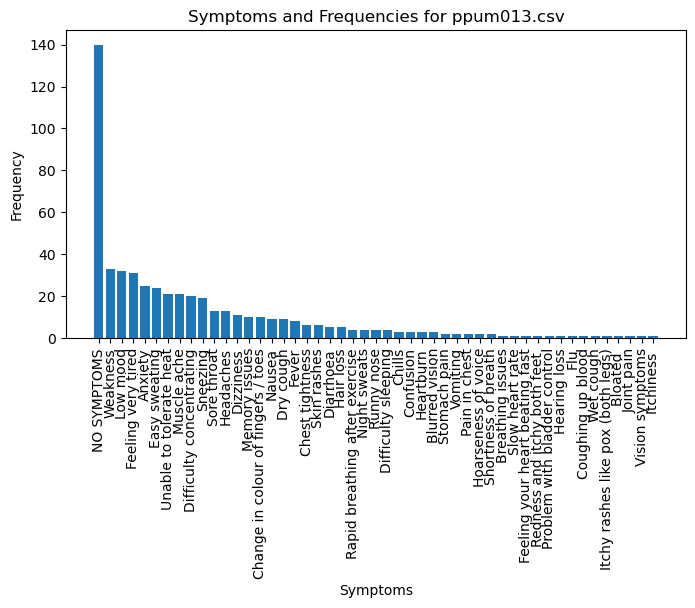

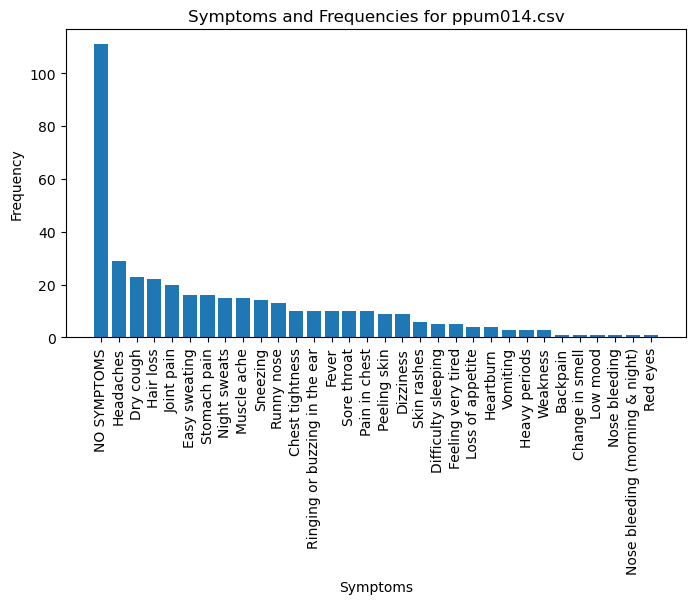

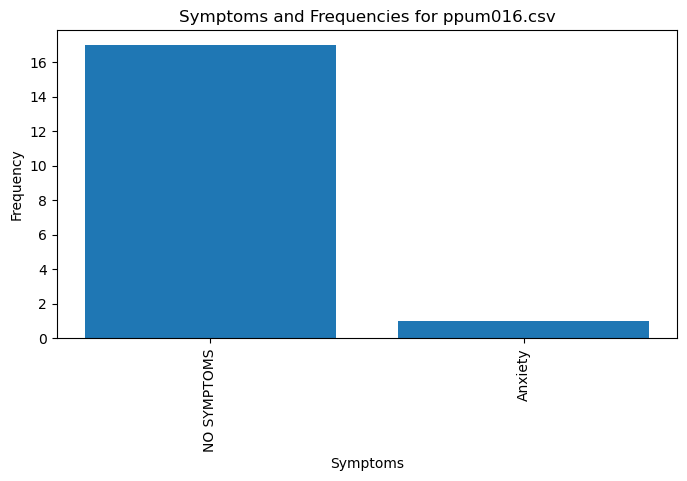

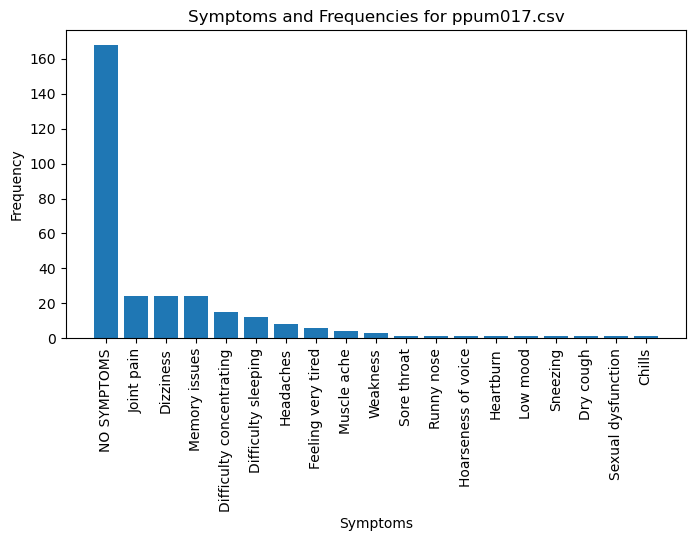

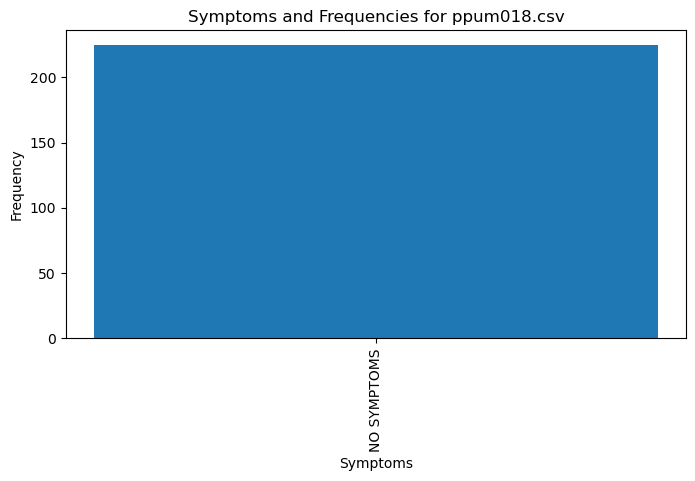

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('C:/Users/User/Downloads/separated_symptoms_per_file.csv')

# Get unique file names
file_names = df['File'].unique()

# Iterate through file names and create plots
for file_name in file_names:
    # Filter the DataFrame for the current file name
    file_df = df[df['File'] == file_name]

    # Create a bar plot for symptoms and frequencies
    plt.figure(figsize=(8, 4))
    plt.bar(file_df['Symptom'], file_df['Frequency'])
    plt.title(f'Symptoms and Frequencies for {file_name}')
    plt.xlabel('Symptoms')
    plt.ylabel('Frequency')
    plt.xticks(rotation=90)

    # Display the plot for the current file name
    plt.show()


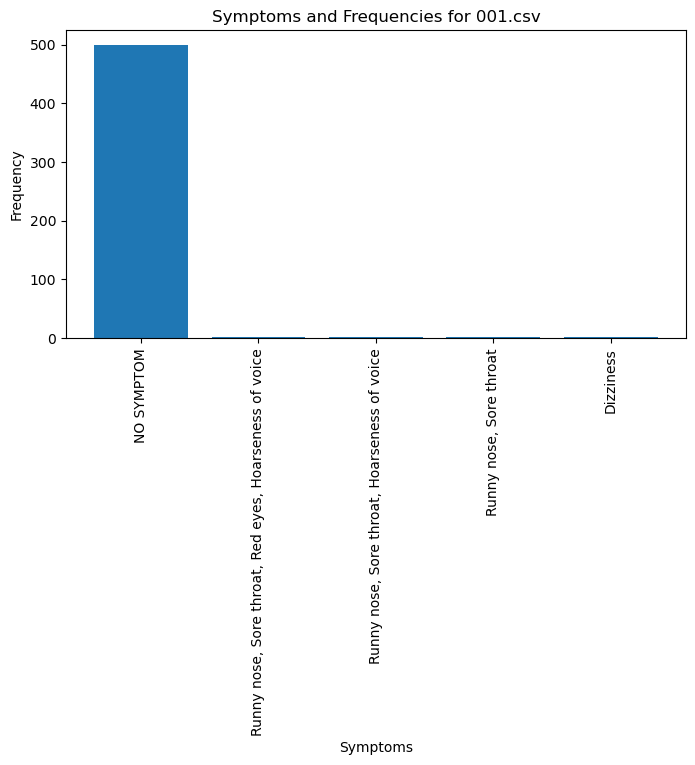

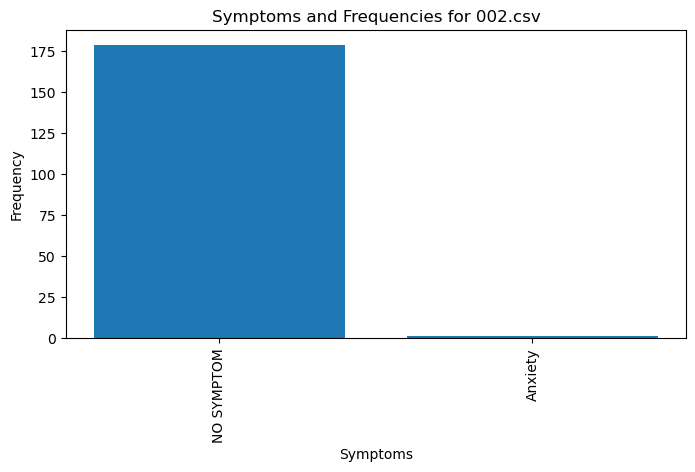

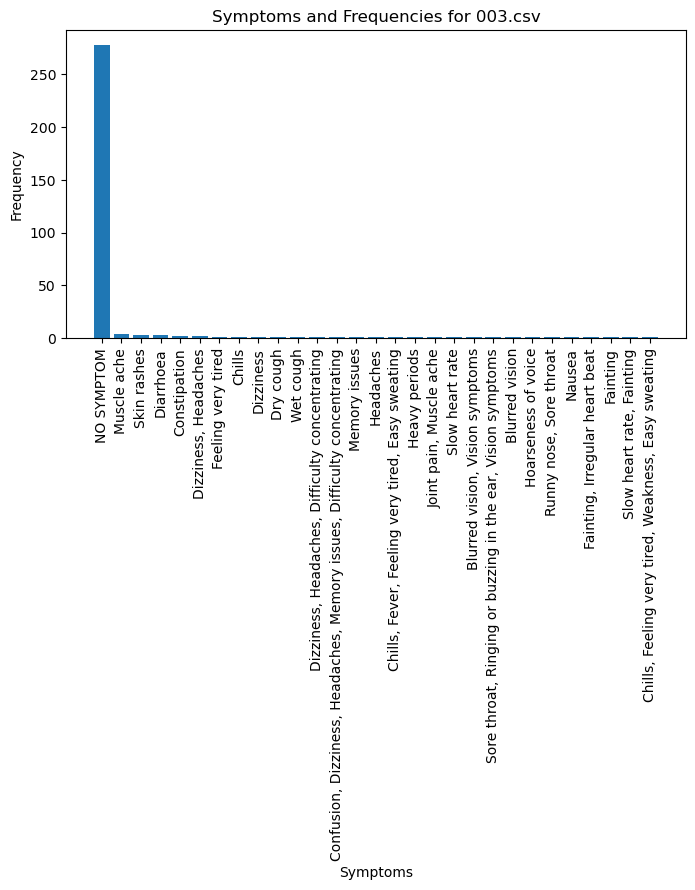

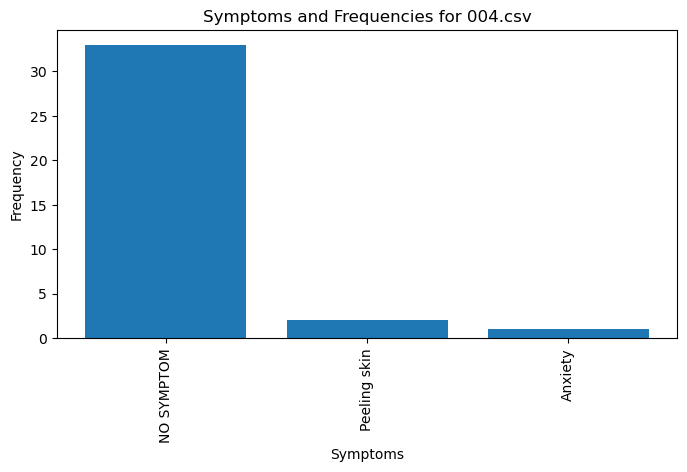

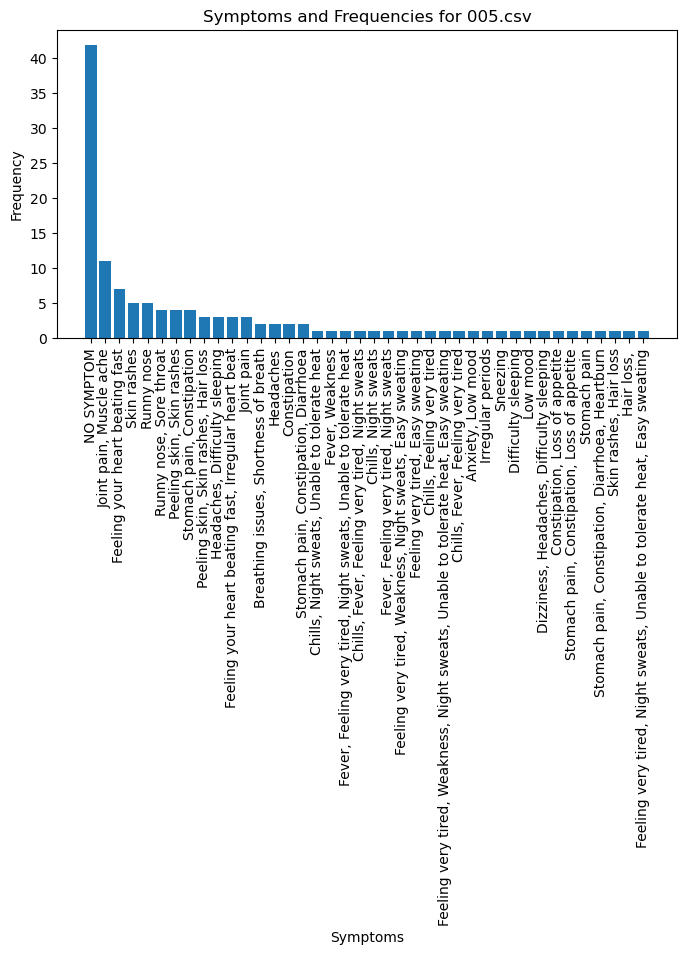

...

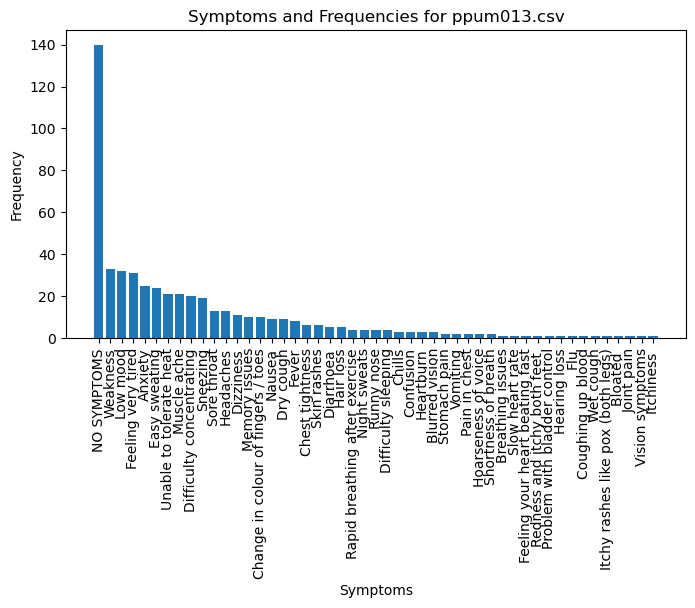

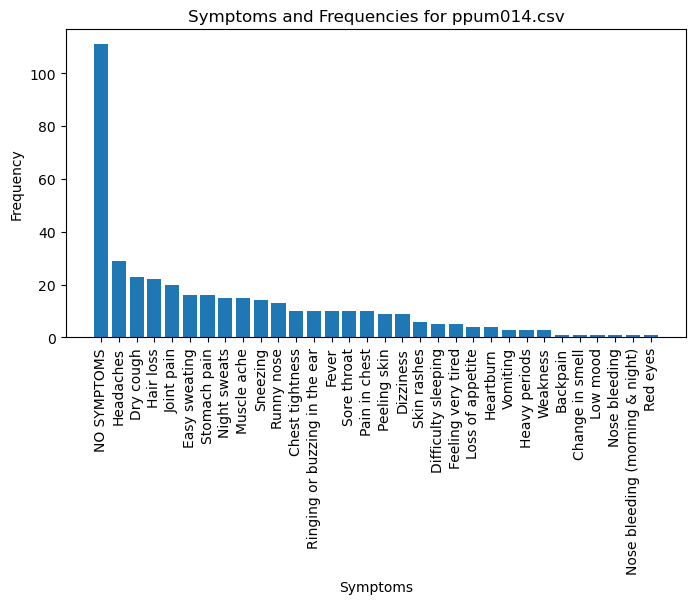

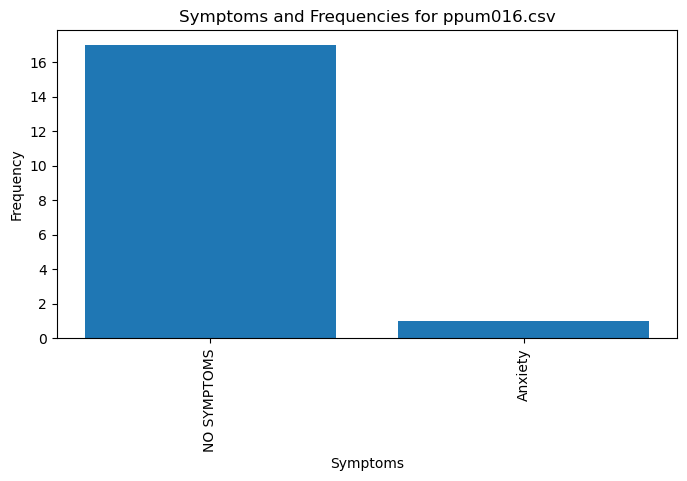

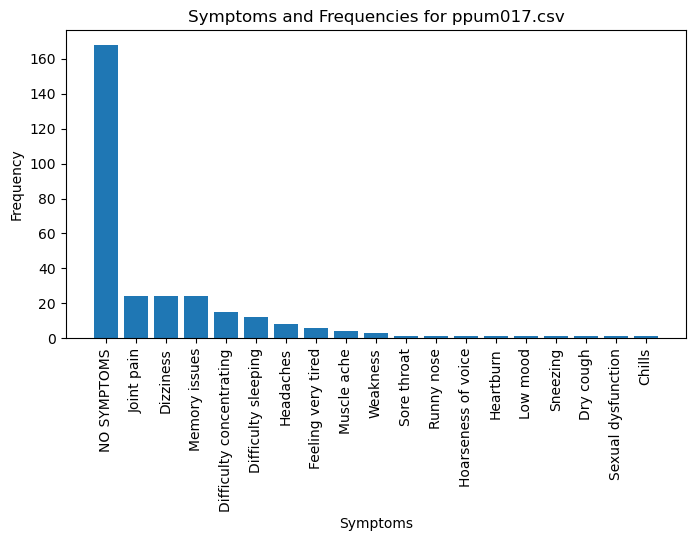

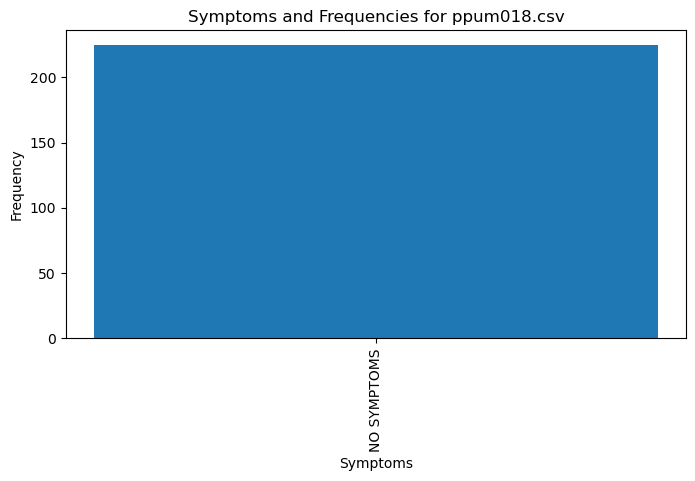

In [48]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('C:/Users/User/Downloads/separated_symptoms_per_file.csv')

# Split the 'Symptom' column into individual symptoms
split_symptoms = df['Symptom'].str.split(', ').explode()

# Count the frequency of each symptom per file
symptom_counts = split_symptoms.groupby([df['File'], split_symptoms]).size().reset_index(name='Frequency')

# Get unique file names
file_names = df['File'].unique()

# Iterate through file names and create plots
for file_name in file_names:
    # Filter the DataFrame for the current file name
    file_df = df[df['File'] == file_name]

    # Create a bar plot for symptoms and frequencies
    plt.figure(figsize=(8, 4))
    plt.bar(file_df['Symptom'], file_df['Frequency'])
    plt.title(f'Symptoms and Frequencies for {file_name}')
    plt.xlabel('Symptoms')
    plt.ylabel('Frequency')
    plt.xticks(rotation=90)

    # Display the plot for the current file name
    plt.show()
    
# # Create a plot for each file's symptoms
# file_names = df['File'].unique()
# # fig, axs = plt.subplots(1, len(file_names), figsize=(12, 4))

# for i, file_name in enumerate(file_names):
# #     ax = axs[i]
#     plt.figure(figsize=(8, 4))
    data_subset = symptom_counts[symptom_counts['File'] == file_name]
    ax.barh(data_subset['Symptom'], data_subset['Frequency'])
    ax.set_xlabel('Frequency')
    ax.set_title(f'Symptoms for {file_name}')
    
# plt.show()



In [57]:
symptom_counts

,File,Symptom,Frequency
0,001.csv,Dizziness,1
1,001.csv,Hoarseness of voice,2
2,001.csv,NO SYMPTOM,1
3,001.csv,Red eyes,1
4,001.csv,Runny nose,3
...,...,...,...
438,ppum017.csv,Sexual dysfunction,1
439,ppum017.csv,Sneezing,1
440,ppum017.csv,Sore throat,1
441,ppum017.csv,Weakness,1


In [60]:
import pandas as pd
import os


# Define the folder path where your data files are located
folder_path = 'C:/Users/User/Downloads/trial'

# Define the symptom columns
symptom_columns = [
    'Cardiovascular', 'Skin', 'Gastrointestinal symptoms',
    'Eye/ears/nose/throat symptoms', 'Musculoskeletal',
    'Neuropsychiatric symptoms', 'Respiratory',
    'Genitourinary, reproductive', 'Systemic'
]

# Initialize an empty DataFrame to store the symptoms
all_symptoms_df = pd.DataFrame(columns=['File', 'Category', 'Symptom'])

# Loop through files in the folder
for file_name in os.listdir(folder_path):
    if file_name.endswith(".csv"):
        file_path = os.path.join(folder_path, file_name)

        # Read the CSV file into a DataFrame
        df = pd.read_csv(file_path)

        # Initialize a DataFrame for symptoms in the current file
        symptoms_df = pd.DataFrame(columns=['Category', 'Symptom'])

        # Iterate over the symptom columns and extract symptoms
        for column in symptom_columns:
            # Filter rows without missing values in the symptom column
            non_missing_rows = df[df[column].notna()]

            # Extract and split semicolon-separated symptoms
            for index, row in non_missing_rows.iterrows():
                symptoms = row[column].split(';')
                
#                 # Split the 'Symptom' column into individual symptoms
#                 split_symptoms = df['Symptom'].str.split(', ').explode()

#                 # Count the frequency of each symptom per file
#                 symptom_counts = split_symptoms.groupby([df['File'], split_symptoms]).size().reset_index(name='Frequency')
                
                for symptom in symptoms:
                    symptoms_df = symptoms_df.append({'Category': column, 'Symptom': symptom}, ignore_index=True)

        # Calculate frequency counts for symptoms in the current file
        symptom_counts = symptoms_df['Symptom'].value_counts().reset_index()
        symptom_counts.columns = ['Symptom', 'Frequency']

        # Add the file name to the DataFrame
        symptom_counts['File'] = file_name

        # Append the frequency counts to the overall DataFrame
        all_symptoms_df = all_symptoms_df.append(symptom_counts, ignore_index=True)

# Data Analysis (Example: Frequency counts for all symptoms)
all_symptoms_df['Frequency'] = all_symptoms_df['Frequency'].astype(int)
all_symptoms_df

# all_symptoms_df.to_csv('separated_symptoms_per_file.csv', index=False)

,File,Category,Symptom,Frequency
0,001.csv,NaN,NO SYMPTOM,500
1,001.csv,NaN,"Runny nose, Sore throat, Red eyes, Hoarseness ...",1
2,001.csv,NaN,"Runny nose, Sore throat, Hoarseness of voice",1
3,001.csv,NaN,"Runny nose, Sore throat",1
4,001.csv,NaN,Dizziness,1
...,...,...,...,...
451,ppum017.csv,NaN,Sneezing,1
452,ppum017.csv,NaN,Dry cough,1
453,ppum017.csv,NaN,Sexual dysfunction,1
454,ppum017.csv,NaN,Chills,1


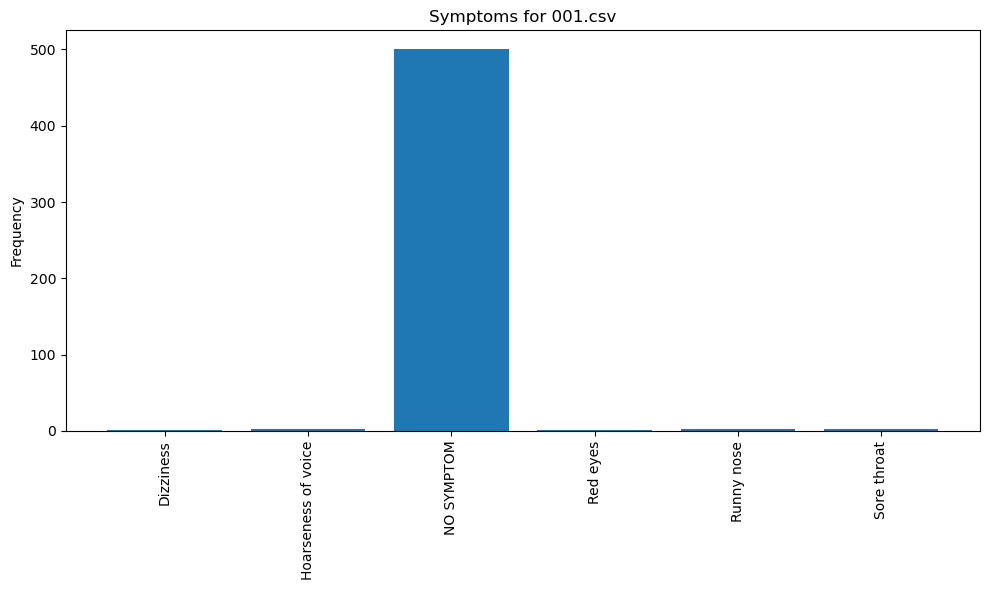

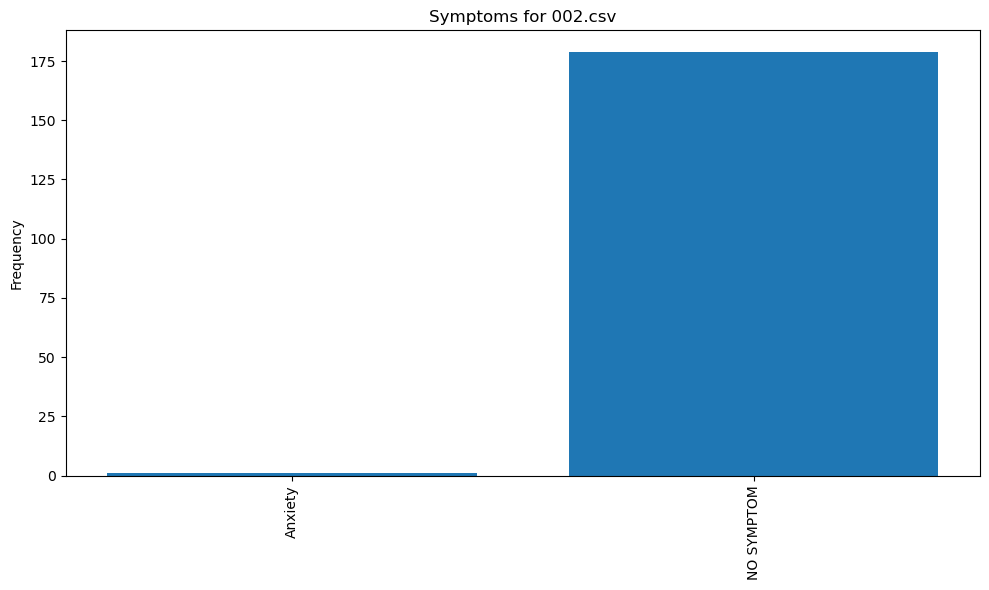

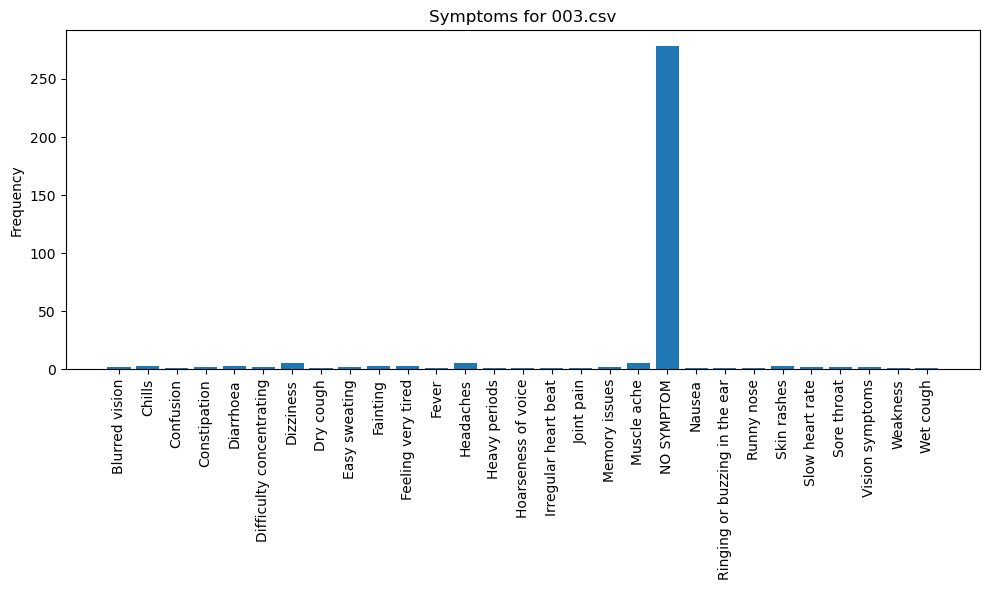

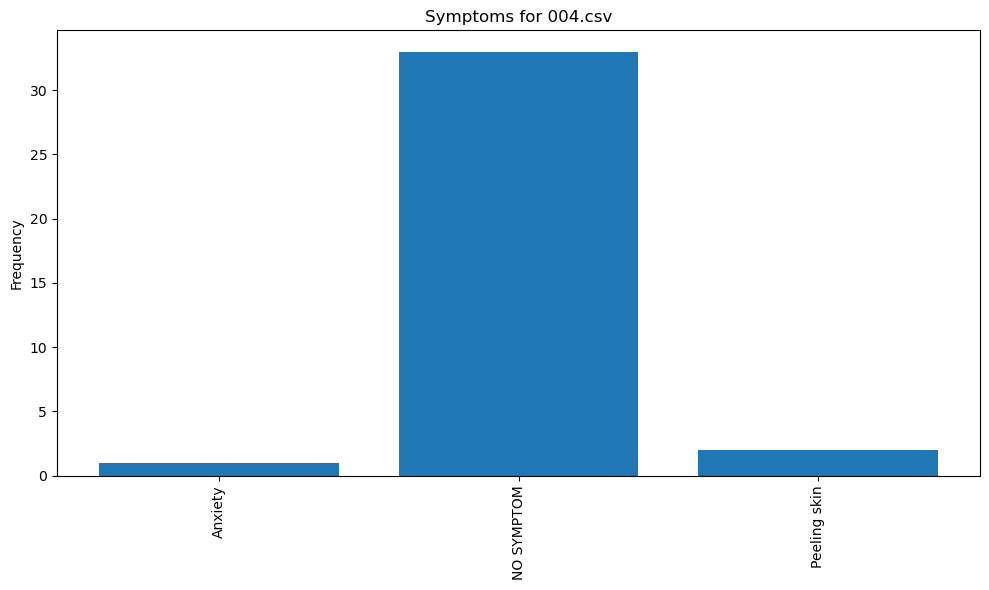

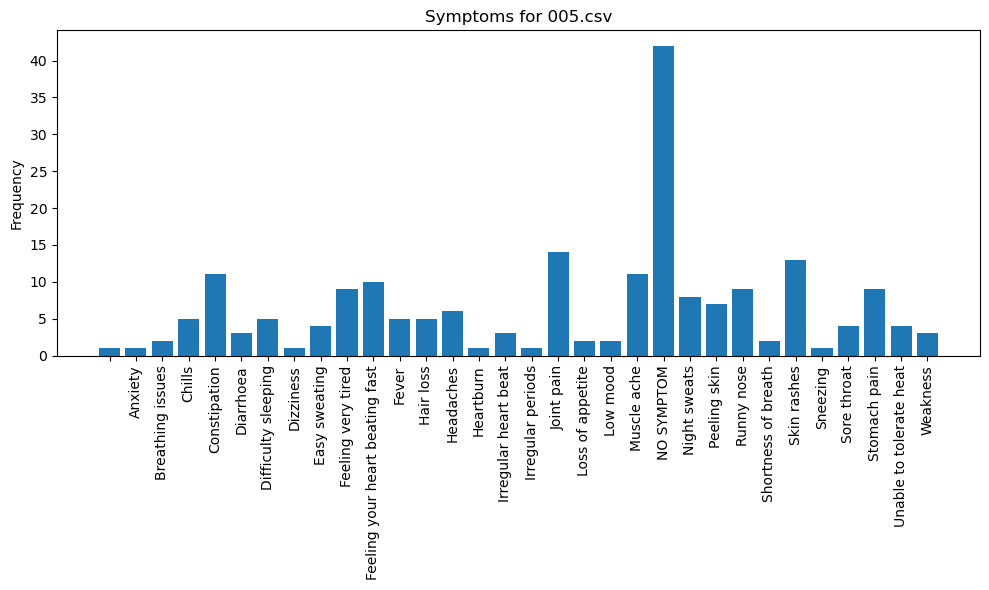

...

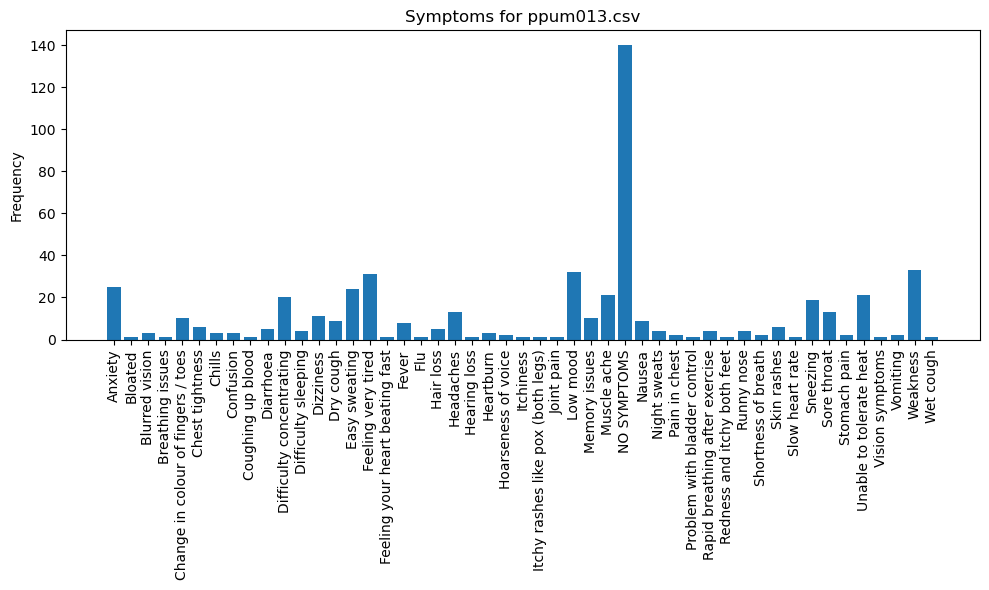

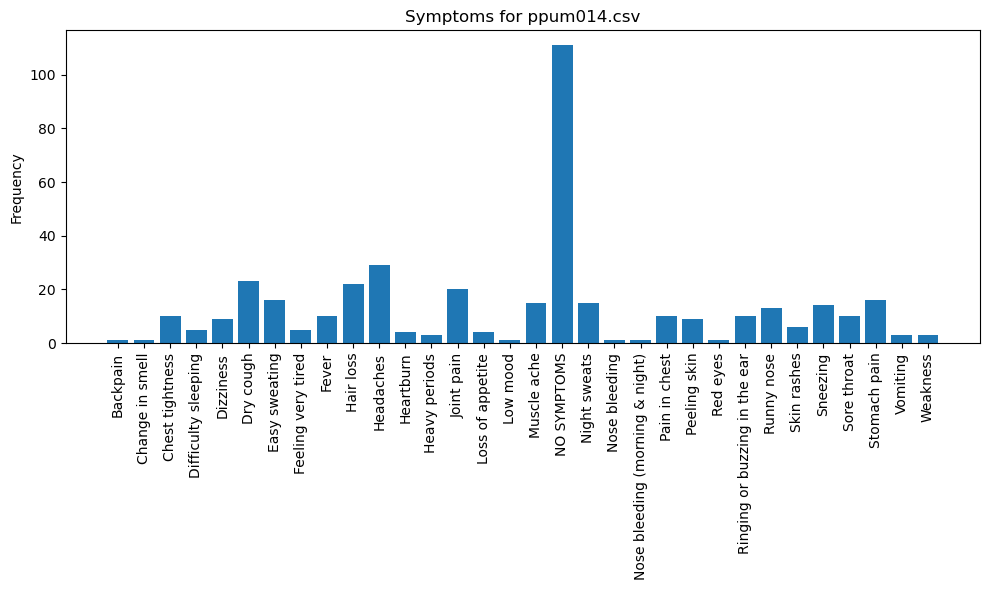

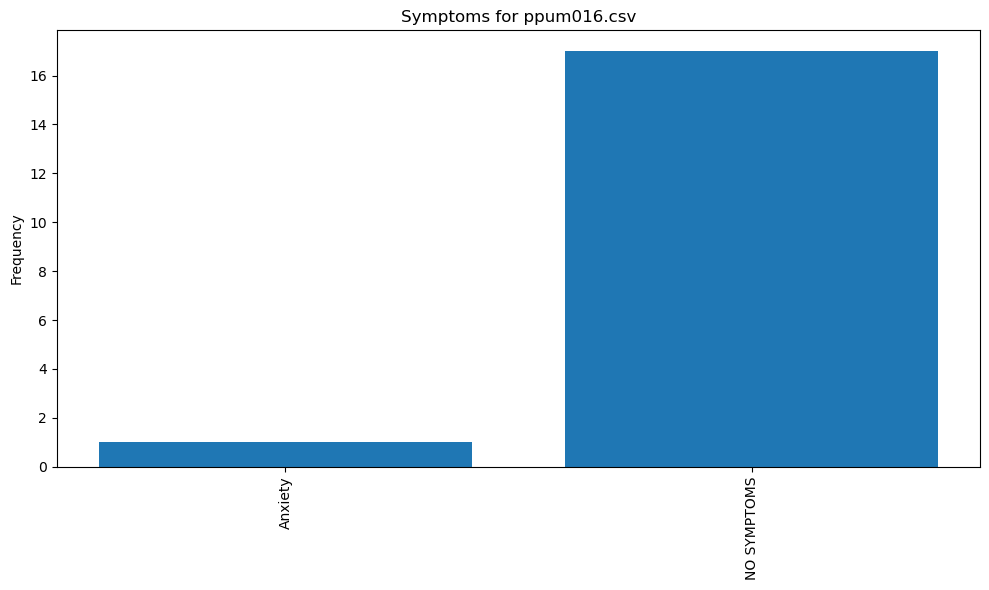

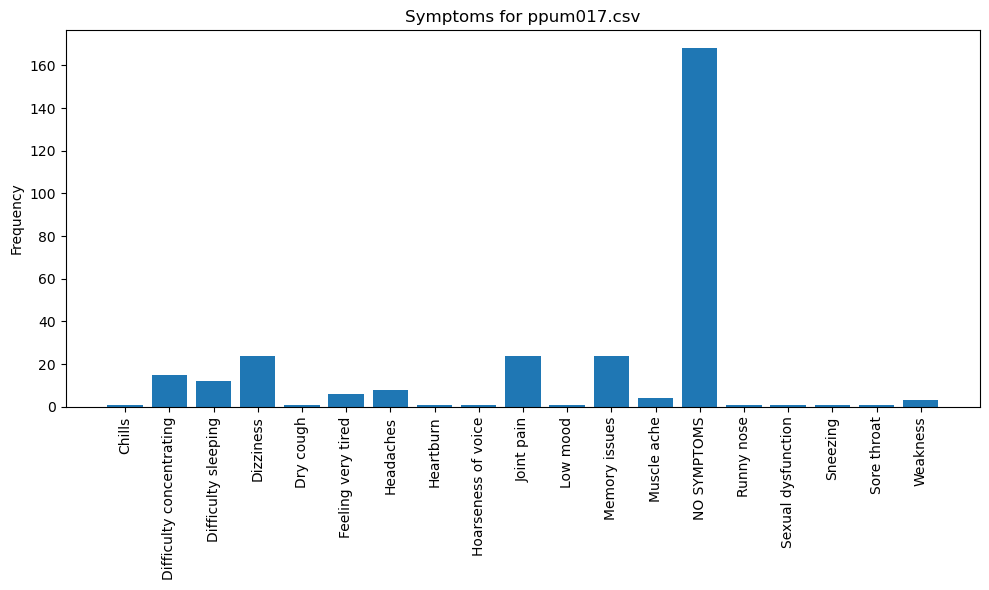

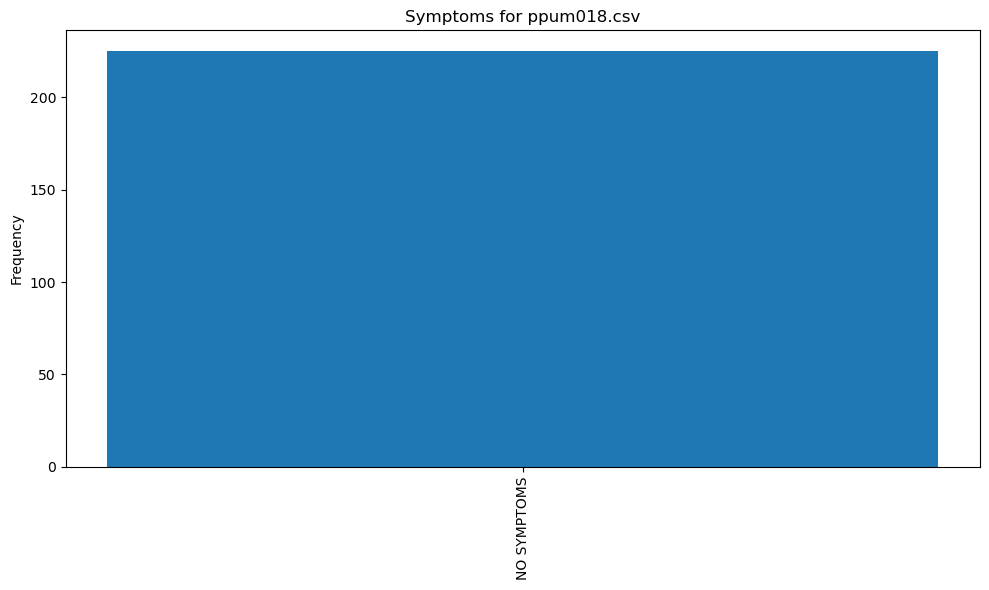

In [62]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('C:/Users/User/Downloads/separated_symptoms_per_file.csv')

# Split the 'Symptom' column into individual symptoms
split_symptoms = df['Symptom'].str.split(', ')

# Create a new DataFrame with individual symptoms
new_data = []
for index, row in df.iterrows():
    for symptom in split_symptoms[index]:
        new_data.append([row['File'], symptom.strip(), row['Frequency']])
new_df = pd.DataFrame(new_data, columns=['File', 'Symptom', 'Frequency'])

# Group by 'File' and 'Symptom' and sum the frequencies
result_df = new_df.groupby(['File', 'Symptom'])['Frequency'].sum().reset_index()

# Plot the chart for each file's symptoms
file_names = result_df['File'].unique()

for file_name in file_names:
    data_subset = result_df[result_df['File'] == file_name]
    
    plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
    plt.bar(data_subset['Symptom'], data_subset['Frequency'])
    plt.ylim(0, 20)  # Set y-axis limits to 0-100
    plt.ylabel('Frequency')
    plt.title(f'Symptoms for {file_name}')
    plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
    plt.tight_layout()
    plt.show()



In [20]:
import pandas as pd
import os

# Define the folder path where your data files are located
folder_path = 'C:/Users/User/Downloads/trial'

# Define the symptom columns
symptom_columns = [
    'Cardiovascular', 'Skin', 'Gastrointestinal symptoms',
    'Eye/ears/nose/throat symptoms', 'Musculoskeletal',
    'Neuropsychiatric symptoms', 'Respiratory',
    'Genitourinary, reproductive', 'Systemic'
]

# Initialize an empty DataFrame to store the symptoms and their counts
all_symptoms_df = pd.DataFrame(columns=['File', 'Category', 'Symptom', 'Frequency'])

# Loop through files in the folder
for file_name in os.listdir(folder_path):
    if file_name.endswith(".csv"):
        file_path = os.path.join(folder_path, file_name)

        # Read the CSV file into a DataFrame
        df = pd.read_csv(file_path)

        # Iterate over the symptom columns and extract, count, and filter unique symptoms
        for column in symptom_columns:
            non_missing_rows = df[df[column].notna()]
            
            # Split the symptom strings by ';', remove 'NO SYMPTOMS', and create a set of unique symptoms
            unique_symptoms = set()
            for index, row in non_missing_rows.iterrows():
                symptoms = set(row[column].split(';')) - {'NO SYMPTOMS', 'NO SYMPTOM'}
                unique_symptoms.update(symptoms)

            # Calculate the count of unique symptoms
            symptom_count = len(unique_symptoms)

            # Append the data to the overall DataFrame
            for symptom in unique_symptoms:
                all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)

# Reset the index of the final DataFrame
all_symptoms_df.reset_index(drop=True, inplace=True)
all_symptoms_df['Frequency'] = all_symptoms_df['Frequency'].astype(int)

# Data Analysis: Display the resulting DataFrame
all_symptoms_df



,File,Category,Symptom,Frequency
0,001.csv,Eye/ears/nose/throat symptoms,"Runny nose, Sore throat",3
1,001.csv,Eye/ears/nose/throat symptoms,"Runny nose, Sore throat, Hoarseness of voice",3
2,001.csv,Eye/ears/nose/throat symptoms,"Runny nose, Sore throat, Red eyes, Hoarseness ...",3
3,001.csv,Neuropsychiatric symptoms,Dizziness,1
4,002.csv,Neuropsychiatric symptoms,Anxiety,1
...,...,...,...,...
418,ppum017.csv,Respiratory,Dry cough,2
419,ppum017.csv,"Genitourinary, reproductive",Sexual dysfunction,1
420,ppum017.csv,Systemic,Weakness,3
421,ppum017.csv,Systemic,Chills,3


In [21]:
import pandas as pd

# Create a DataFrame with the sample data
original_df = pd.DataFrame(all_symptoms_df)

# Create an empty DataFrame to store the individual symptoms and their counts
individual_symptoms_df = pd.DataFrame(columns=['File', 'Category', 'Symptom', 'Frequency'])

# Iterate through each row in the original DataFrame
for index, row in original_df.iterrows():
    symptoms = row['Symptom'].split(', ')  # Split the symptoms
    category = row['Category']
    file_name = row['File']
    
    # Count the frequency of each individual symptom within its category
    for symptom in symptoms:
        individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)

# Group the individual symptoms by file, category, and symptom and count their frequencies
grouped_symptoms_df = individual_symptoms_df.groupby(['File', 'Category', 'Symptom']).size().reset_index(name='Frequency')

# Display the grouped DataFrame
grouped_symptoms_df


,File,Category,Symptom,Frequency
0,001.csv,Eye/ears/nose/throat symptoms,Hoarseness of voice,2
1,001.csv,Eye/ears/nose/throat symptoms,Red eyes,1
2,001.csv,Eye/ears/nose/throat symptoms,Runny nose,3
3,001.csv,Eye/ears/nose/throat symptoms,Sore throat,3
4,001.csv,Neuropsychiatric symptoms,Dizziness,1
...,...,...,...,...
410,ppum017.csv,Respiratory,Dry cough,1
411,ppum017.csv,Respiratory,Sneezing,1
412,ppum017.csv,Systemic,Chills,1
413,ppum017.csv,Systemic,Feeling very tired,1


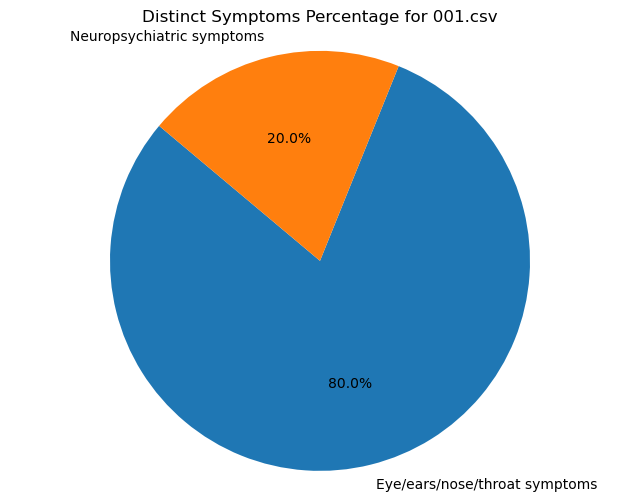

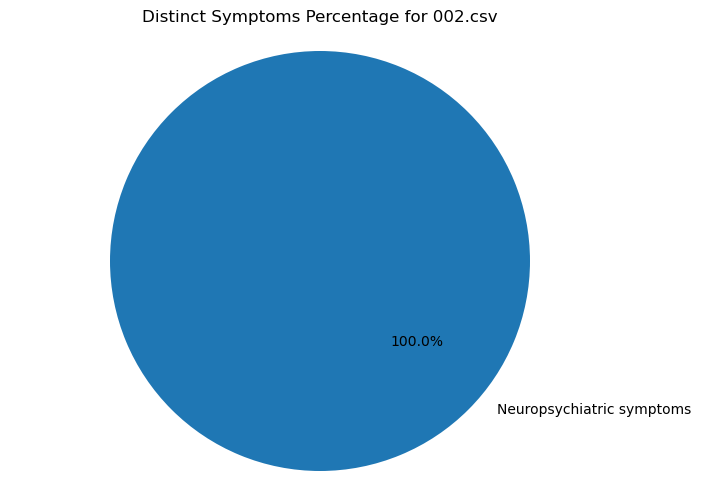

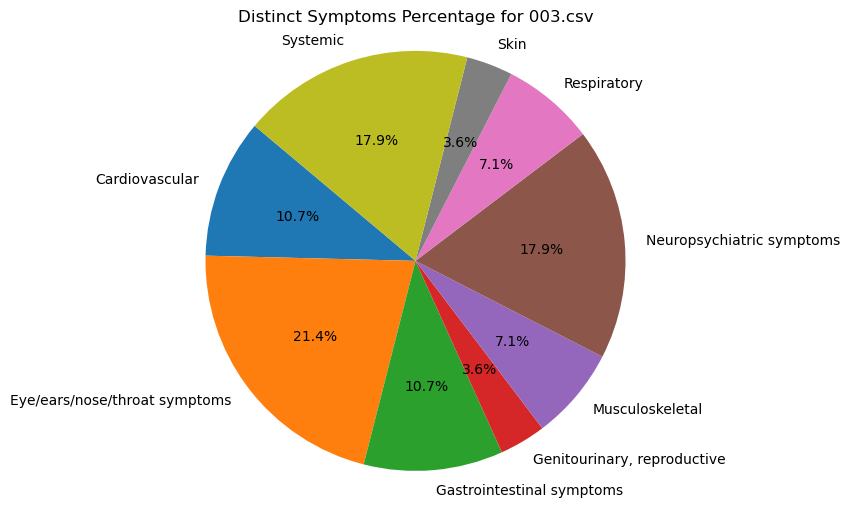

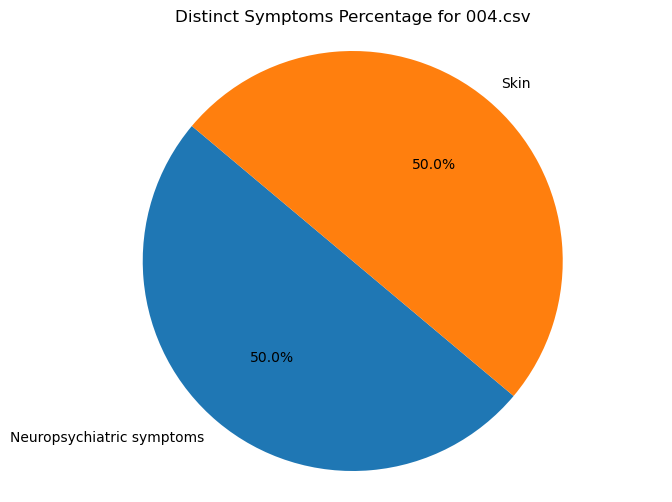

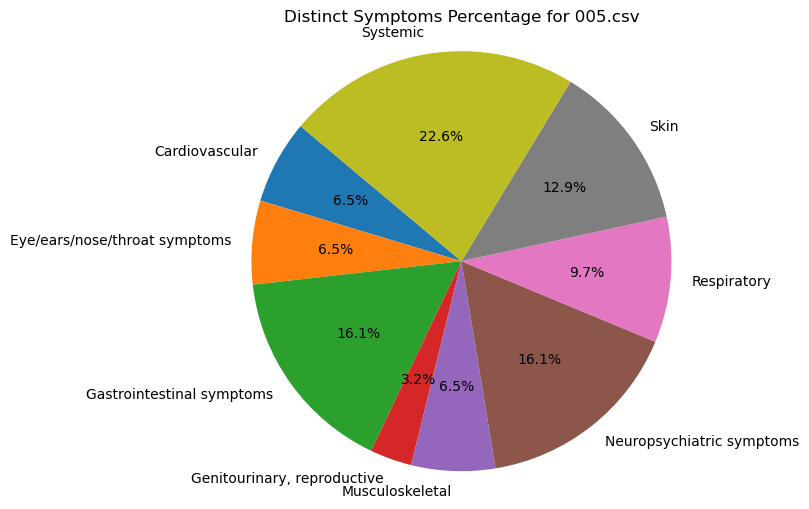

...

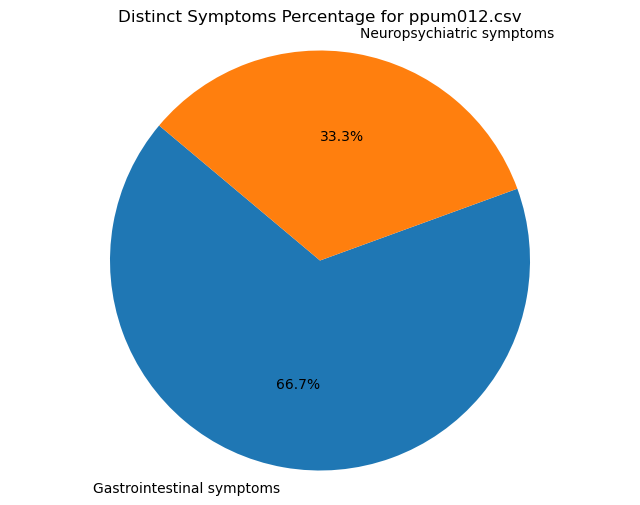

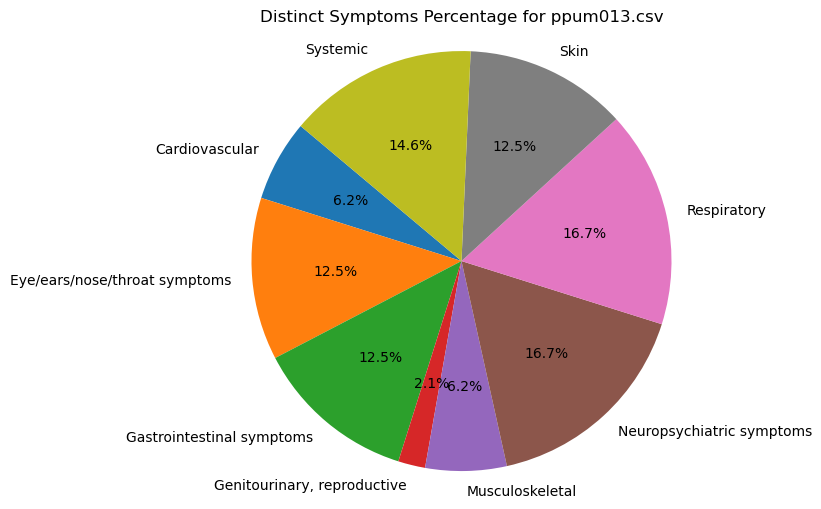

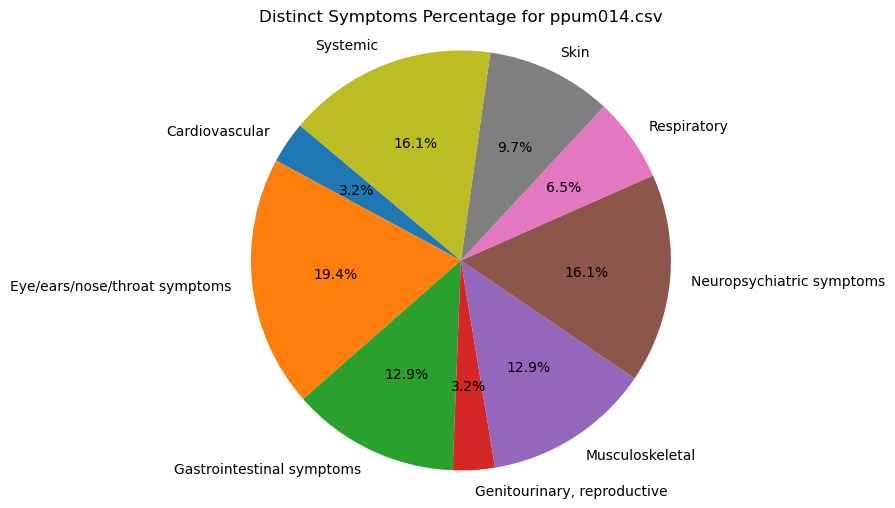

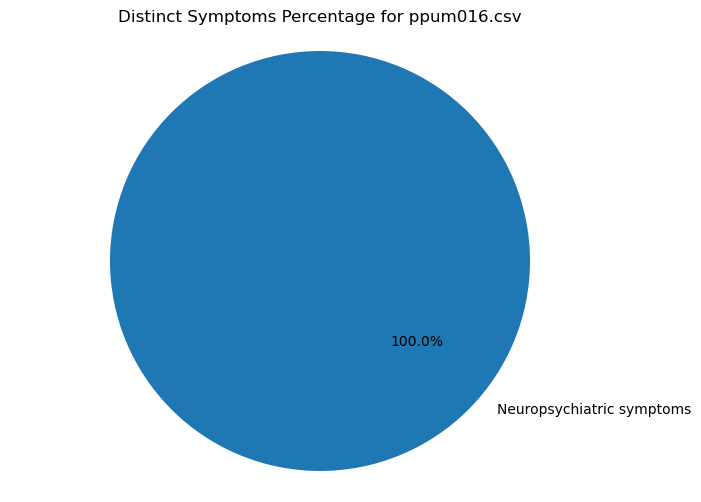

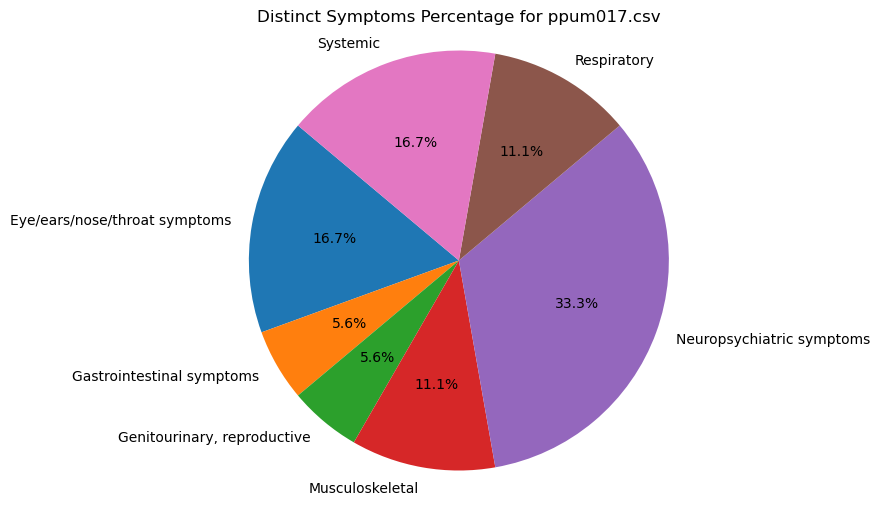

In [22]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have the grouped DataFrame with columns: 'File', 'Category', 'Symptom', 'Frequency'
# grouped_symptoms_df = ...

# Group the DataFrame to count the number of distinct symptoms for each category in each file
distinct_symptoms_count = grouped_symptoms_df.groupby(['File', 'Category'])['Symptom'].nunique().reset_index(name='Distinct Symptoms')

# Create a list of unique files in the DataFrame
unique_files = distinct_symptoms_count['File'].unique()

# Plot figures for each file
for file_name in unique_files:
    file_data = distinct_symptoms_count[distinct_symptoms_count['File'] == file_name]
    
    # Create a pie chart to show the percentage of each category symptom
    plt.figure(figsize=(8, 6))
    plt.pie(file_data['Distinct Symptoms'], labels=file_data['Category'], autopct='%1.1f%%', startangle=140)
    plt.title(f'Distinct Symptoms Percentage for {file_name}')
    plt.axis('equal')  # Equal aspect ratio ensures that the pie chart is circular

    # Save or display the figure
#     plt.savefig(f'{file_name}_symptoms_percentage.png')
    plt.show()


In [23]:
distinct_symptoms_count

,File,Category,Distinct Symptoms
0,001.csv,Eye/ears/nose/throat symptoms,4
1,001.csv,Neuropsychiatric symptoms,1
2,002.csv,Neuropsychiatric symptoms,1
3,003.csv,Cardiovascular,3
4,003.csv,Eye/ears/nose/throat symptoms,6
...,...,...,...
143,ppum017.csv,"Genitourinary, reproductive",1
144,ppum017.csv,Musculoskeletal,2
145,ppum017.csv,Neuropsychiatric symptoms,6
146,ppum017.csv,Respiratory,2


In [24]:
# Define the path to the "Downloads" directory
downloads_path = 'C:/Users/User/Downloads'

# Specify the full path for the CSV file
csv_file_path = os.path.join(downloads_path, 'distinct_symptoms_category_count.csv')

# Save the DataFrame to the specified path
distinct_symptoms_count.to_csv(csv_file_path, index=False)


In [1]:
import pandas as pd
import os

# Define the folder path where your data files are located
folder_path = 'C:/Users/User/Downloads/trial_COVID'

# Define the symptom columns
symptom_columns = [
    'Cardiovascular', 'Skin', 'Gastrointestinal symptoms',
    'Eye/ears/nose/throat symptoms', 'Musculoskeletal',
    'Neuropsychiatric symptoms', 'Respiratory',
    'Genitourinary, reproductive', 'Systemic'
]

# Initialize an empty DataFrame to store the symptoms and their counts
all_symptoms_df = pd.DataFrame(columns=['File', 'Category', 'Symptom', 'Frequency'])

# Loop through files in the folder
for file_name in os.listdir(folder_path):
    if file_name.endswith(".csv"):
        file_path = os.path.join(folder_path, file_name)

        # Read the CSV file into a DataFrame
        df = pd.read_csv(file_path)

        # Iterate over the symptom columns and extract, count, and filter unique symptoms
        for column in symptom_columns:
            non_missing_rows = df[df[column].notna()]
            
            # Split the symptom strings by ';', remove 'NO SYMPTOMS', and create a set of unique symptoms
            unique_symptoms = set()
            for index, row in non_missing_rows.iterrows():
                symptoms = set(row[column].split(';')) - {'NO SYMPTOMS'}
                unique_symptoms.update(symptoms)

            # Calculate the count of unique symptoms
            symptom_count = len(unique_symptoms)

            # Append the data to the overall DataFrame
            for symptom in unique_symptoms:
                all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)

# Reset the index of the final DataFrame
all_symptoms_df.reset_index(drop=True, inplace=True)
all_symptoms_df['Frequency'] = all_symptoms_df['Frequency'].astype(int)

# Data Analysis: Display the resulting DataFrame
all_symptoms_df



C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom

C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom

C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom

C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom

C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom

C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom

C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\2068109157.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom

,File,Category,Symptom,Frequency
0,modified_011.csv,Gastrointestinal symptoms,"Stomach pain, Diarrhoea",3
1,modified_011.csv,Gastrointestinal symptoms,"Stomach pain, Constipation",3
2,modified_011.csv,Gastrointestinal symptoms,Diarrhoea,3
3,modified_011.csv,Eye/ears/nose/throat symptoms,"Sore throat, Hoarseness of voice",2
4,modified_011.csv,Eye/ears/nose/throat symptoms,"Runny nose, Sore throat",2
...,...,...,...,...
245,ppum017.csv,Respiratory,Dry cough,2
246,ppum017.csv,"Genitourinary, reproductive",Sexual dysfunction,1
247,ppum017.csv,Systemic,Weakness,3
248,ppum017.csv,Systemic,Feeling very tired,3


In [2]:
import pandas as pd

# Create a DataFrame with the sample data
original_df = pd.DataFrame(all_symptoms_df)

# Create an empty DataFrame to store the individual symptoms and their counts
individual_symptoms_df = pd.DataFrame(columns=['File', 'Category', 'Symptom', 'Frequency'])

# Iterate through each row in the original DataFrame
for index, row in original_df.iterrows():
    symptoms = row['Symptom'].split(', ')  # Split the symptoms
    category = row['Category']
    file_name = row['File']
    
    # Count the frequency of each individual symptom within its category
    for symptom in symptoms:
        individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)

# Group the individual symptoms by file, category, and symptom and count their frequencies
grouped_symptoms_df = individual_symptoms_df.groupby(['File', 'Category', 'Symptom']).size().reset_index(name='Frequency')

# Display the grouped DataFrame
grouped_symptoms_df


C:\Users\User\AppData\Local\Temp\ipykernel_5800\332965780.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\332965780.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\332965780.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': categor

C:\Users\User\AppData\Local\Temp\ipykernel_5800\332965780.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\332965780.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\332965780.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': categor

C:\Users\User\AppData\Local\Temp\ipykernel_5800\332965780.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\332965780.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\332965780.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': categor

C:\Users\User\AppData\Local\Temp\ipykernel_5800\332965780.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\332965780.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\332965780.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': categor

C:\Users\User\AppData\Local\Temp\ipykernel_5800\332965780.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\332965780.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_5800\332965780.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': categor

,File,Category,Symptom,Frequency
0,modified_011.csv,Eye/ears/nose/throat symptoms,Hoarseness of voice,1
1,modified_011.csv,Eye/ears/nose/throat symptoms,Runny nose,1
2,modified_011.csv,Eye/ears/nose/throat symptoms,Sore throat,2
3,modified_011.csv,Gastrointestinal symptoms,Constipation,1
4,modified_011.csv,Gastrointestinal symptoms,Diarrhoea,2
...,...,...,...,...
250,ppum017.csv,Respiratory,Dry cough,1
251,ppum017.csv,Respiratory,Sneezing,1
252,ppum017.csv,Systemic,Chills,1
253,ppum017.csv,Systemic,Feeling very tired,1


In [3]:
grouped_symptoms_df.sample(20)

,File,Category,Symptom,Frequency
138,ppum009.csv,Neuropsychiatric symptoms,Memory issues,1
205,ppum014.csv,Cardiovascular,Pain in chest,1
12,modified_015.csv,Cardiovascular,Irregular heart beat,1
192,ppum013.csv,Skin,Change in colour of fingers / toes,1
118,ppum005.csv,Neuropsychiatric symptoms,Dizziness,1
217,ppum014.csv,Musculoskeletal,Backpain,1
248,ppum017.csv,Neuropsychiatric symptoms,Low mood,1
62,modified_018.csv,Neuropsychiatric symptoms,Difficulty concentrating,1
32,modified_015.csv,Respiratory,Wet cough,1
49,modified_016.csv,Neuropsychiatric symptoms,Confusion,1


In [4]:
symptom_counts = grouped_symptoms_df.groupby(['Category', 'Symptom'])['Frequency'].count().reset_index()
symptom_counts

,Category,Symptom,Frequency
0,Cardiovascular,Feeling your heart beating fast,3
1,Cardiovascular,Irregular heart beat,2
2,Cardiovascular,Pain in chest,4
3,Cardiovascular,Slow heart rate,1
4,Eye/ears/nose/throat symptoms,-,1
...,...,...,...
71,Systemic,Night sweats,4
72,Systemic,Tonsilitis,1
73,Systemic,Unable to tolerate heat,1
74,Systemic,Weakness,8


In [10]:
# Filter the DataFrame to select only rows with 'Neuropsychiatric symptoms' in the 'Category' column.
neuropsychiatric_df = grouped_symptoms_df[grouped_symptoms_df['Category'] == 'Neuropsychiatric symptoms']

# Group and count the unique symptoms in the filtered DataFrame.
symptom_counts1 = neuropsychiatric_df['Symptom'].value_counts().reset_index()

# Rename the columns to make them more descriptive.
symptom_counts1.columns = ['Symptom', 'Frequency']

# Sort the DataFrame by frequency in descending order.
symptom_counts1 = symptom_counts1.sort_values(by='Frequency', ascending=False)

# Calculate the total frequency of the selected symptoms.
total_frequency = symptom_counts1['Frequency'].sum()

# Add a new column 'Percentage' to the DataFrame.
symptom_counts1['Percentage'] = round((symptom_counts1['Frequency'] / total_frequency) * 100, 2)

# Display the result.
symptom_counts1


,Symptom,Frequency,Percentage
0,Headaches,10,16.67
1,Memory issues,8,13.33
2,Change in smell,6,10.00
3,Difficulty concentrating,6,10.00
4,Dizziness,6,10.00
5,Difficulty sleeping,6,10.00
6,Change in taste,4,6.67
7,Confusion,4,6.67
8,Low mood,4,6.67
9,Anxiety,3,5.00


In [9]:
import pandas as pd
import os

# Define the folder path where your data files are located
folder_path = 'C:/Users/User/Downloads/trial_normal'

# Define the symptom columns
symptom_columns = [
    'Cardiovascular', 'Skin', 'Gastrointestinal symptoms',
    'Eye/ears/nose/throat symptoms', 'Musculoskeletal',
    'Neuropsychiatric symptoms', 'Respiratory',
    'Genitourinary, reproductive', 'Systemic'
]

# Initialize an empty DataFrame to store the symptoms and their counts
all_symptoms_df = pd.DataFrame(columns=['File', 'Category', 'Symptom', 'Frequency'])

# Loop through files in the folder
for file_name in os.listdir(folder_path):
    if file_name.endswith(".csv"):
        file_path = os.path.join(folder_path, file_name)

        # Read the CSV file into a DataFrame
        df = pd.read_csv(file_path)

        # Iterate over the symptom columns and extract, count, and filter unique symptoms
        for column in symptom_columns:
            non_missing_rows = df[df[column].notna()]
            
            # Split the symptom strings by ';', remove 'NO SYMPTOMS', and create a set of unique symptoms
            unique_symptoms = set()
            for index, row in non_missing_rows.iterrows():
                symptoms = set(row[column].split(';')) - {'NO SYMPTOMS'}
                unique_symptoms.update(symptoms)

            # Calculate the count of unique symptoms
            symptom_count = len(unique_symptoms)

            # Append the data to the overall DataFrame
            for symptom in unique_symptoms:
                all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)

# Reset the index of the final DataFrame
all_symptoms_df.reset_index(drop=True, inplace=True)
all_symptoms_df['Frequency'] = all_symptoms_df['Frequency'].astype(int)

# Data Analysis: Display the resulting DataFrame
all_symptoms_df

C:\Users\User\AppData\Local\Temp\ipykernel_8252\1474163804.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\1474163804.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\1474163804.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom

C:\Users\User\AppData\Local\Temp\ipykernel_8252\1474163804.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\1474163804.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\1474163804.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom

C:\Users\User\AppData\Local\Temp\ipykernel_8252\1474163804.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\1474163804.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\1474163804.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom

C:\Users\User\AppData\Local\Temp\ipykernel_8252\1474163804.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\1474163804.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\1474163804.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom

C:\Users\User\AppData\Local\Temp\ipykernel_8252\1474163804.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\1474163804.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\1474163804.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom

C:\Users\User\AppData\Local\Temp\ipykernel_8252\1474163804.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\1474163804.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\1474163804.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom

,File,Category,Symptom,Frequency
0,001.csv,Cardiovascular,NO SYMPTOM,1
1,001.csv,Skin,NO SYMPTOM,1
2,001.csv,Gastrointestinal symptoms,NO SYMPTOM,1
3,001.csv,Eye/ears/nose/throat symptoms,NO SYMPTOM,4
4,001.csv,Eye/ears/nose/throat symptoms,"Runny nose, Sore throat, Red eyes, Hoarseness ...",4
...,...,...,...,...
283,017.csv,Respiratory,Shortness of breath,2
284,017.csv,Respiratory,NO SYMPTOM,2
285,017.csv,"Genitourinary, reproductive",NO SYMPTOM,1
286,017.csv,Systemic,Feeling very tired,2


In [10]:
import pandas as pd

# Create a DataFrame with the sample data
original_df = pd.DataFrame(all_symptoms_df)

# Create an empty DataFrame to store the individual symptoms and their counts
individual_symptoms_df = pd.DataFrame(columns=['File', 'Category', 'Symptom', 'Frequency'])

# Iterate through each row in the original DataFrame
for index, row in original_df.iterrows():
    symptoms = row['Symptom'].split(', ')  # Split the symptoms
    category = row['Category']
    file_name = row['File']
    
    # Count the frequency of each individual symptom within its category
    for symptom in symptoms:
        individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)

# Group the individual symptoms by file, category, and symptom and count their frequencies
grouped_symptoms_df = individual_symptoms_df.groupby(['File', 'Category', 'Symptom']).size().reset_index(name='Frequency')

# Display the grouped DataFrame
grouped_symptoms_df

C:\Users\User\AppData\Local\Temp\ipykernel_8252\2273364401.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\2273364401.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\2273364401.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': cate

C:\Users\User\AppData\Local\Temp\ipykernel_8252\2273364401.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\2273364401.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\2273364401.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': cate

C:\Users\User\AppData\Local\Temp\ipykernel_8252\2273364401.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\2273364401.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\2273364401.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': cate

C:\Users\User\AppData\Local\Temp\ipykernel_8252\2273364401.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\2273364401.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\2273364401.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': cate

C:\Users\User\AppData\Local\Temp\ipykernel_8252\2273364401.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\2273364401.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\2273364401.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': cate

C:\Users\User\AppData\Local\Temp\ipykernel_8252\2273364401.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\2273364401.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)
C:\Users\User\AppData\Local\Temp\ipykernel_8252\2273364401.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': cate

,File,Category,Symptom,Frequency
0,001.csv,Cardiovascular,NO SYMPTOM,1
1,001.csv,Eye/ears/nose/throat symptoms,Hoarseness of voice,2
2,001.csv,Eye/ears/nose/throat symptoms,NO SYMPTOM,1
3,001.csv,Eye/ears/nose/throat symptoms,Red eyes,1
4,001.csv,Eye/ears/nose/throat symptoms,Runny nose,3
...,...,...,...,...
266,017.csv,Respiratory,NO SYMPTOM,1
267,017.csv,Respiratory,Shortness of breath,1
268,017.csv,Skin,NO SYMPTOM,1
269,017.csv,Systemic,Feeling very tired,1


In [11]:
grouped_symptoms_df.sample(20)

,File,Category,Symptom,Frequency
69,004.csv,Skin,NO SYMPTOM,1
158,008.csv,Gastrointestinal symptoms,Loss of appetite,1
113,006.csv,"Genitourinary, reproductive",NO SYMPTOM,1
195,010.csv,Cardiovascular,NO SYMPTOM,1
269,017.csv,Systemic,Feeling very tired,1
12,001.csv,Skin,NO SYMPTOM,1
145,007.csv,Respiratory,Wet cough,1
164,008.csv,Neuropsychiatric symptoms,Headaches,2
168,008.csv,Respiratory,Wet cough,1
174,008.csv,Systemic,Unable to tolerate heat,5


In [12]:
symptom_counts = grouped_symptoms_df.groupby(['Category', 'Symptom'])['Frequency'].count().reset_index()
symptom_counts

,Category,Symptom,Frequency
0,Cardiovascular,Fainting,1
1,Cardiovascular,Feeling your heart beating fast,4
2,Cardiovascular,Irregular heart beat,2
3,Cardiovascular,NO SYMPTOM,13
4,Cardiovascular,Slow heart rate,1
...,...,...,...
60,Systemic,Insomnia,1
61,Systemic,NO SYMPTOM,13
62,Systemic,Night sweats,3
63,Systemic,Unable to tolerate heat,2


In [15]:
# Filter the DataFrame to select only rows with 'Neuropsychiatric symptoms' in the 'Category' column.
neuropsychiatric_df = grouped_symptoms_df[grouped_symptoms_df['Category'] == 'Neuropsychiatric symptoms']

# Group and count the unique symptoms in the filtered DataFrame.
symptom_counts2 = neuropsychiatric_df['Symptom'].value_counts().reset_index()

# Rename the columns to make them more descriptive.
symptom_counts2.columns = ['Symptom', 'Frequency']

# Filter the DataFrame to exclude rows with 'NO SYMPTOMS' in the 'Symptom' column.
symptom_counts2 = symptom_counts2[symptom_counts2['Symptom'] != 'NO SYMPTOM']

# Sort the DataFrame by frequency in descending order.
symptom_counts2 = symptom_counts2.sort_values(by='Frequency', ascending=False)

# Calculate the total frequency of the selected symptoms.
total_frequency = symptom_counts2['Frequency'].sum()

# Add a new column 'Percentage' to the DataFrame.
symptom_counts2['Percentage'] = round((symptom_counts2['Frequency'] / total_frequency) * 100, 2)

# Display the result.
symptom_counts2


,Symptom,Frequency,Percentage
1,Dizziness,6,18.75
2,Headaches,6,18.75
3,Low mood,4,12.50
4,Anxiety,3,9.38
5,Difficulty concentrating,3,9.38
6,Difficulty sleeping,3,9.38
7,Change in smell,2,6.25
8,Change in taste,2,6.25
9,Confusion,1,3.12
10,Memory issues,1,3.12


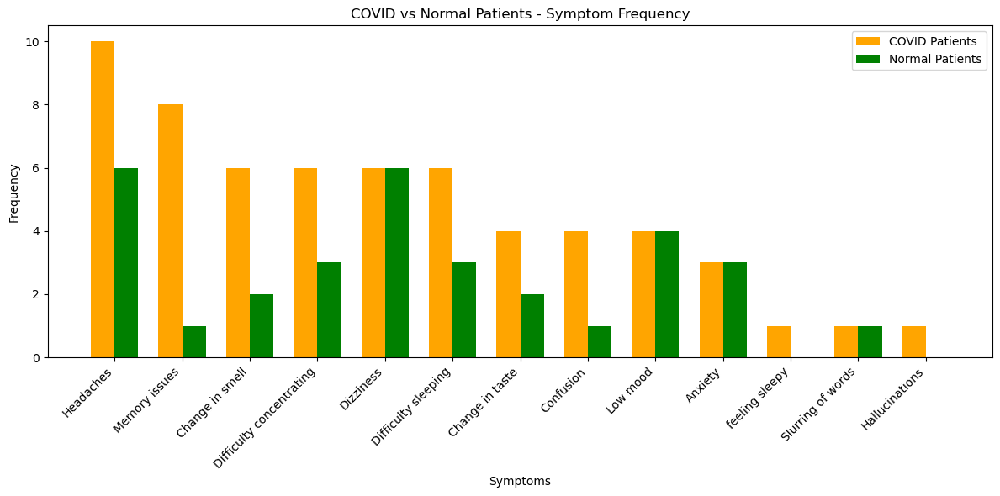

In [33]:
import matplotlib.pyplot as plt
import numpy as np

# Data for COVID patients
covid_symptoms = ["Headaches", "Memory issues", "Change in smell", "Difficulty concentrating", "Dizziness",
                  "Difficulty sleeping", "Change in taste", "Confusion", "Low mood", "Anxiety",
                  "feeling sleepy", "Slurring of words", "Hallucinations"]
covid_frequency = [10, 8, 6, 6, 6, 6, 4, 4, 4, 3, 1, 1, 1]

# Data for normal patients
normal_symptoms = ["Headaches", "Memory issues", "Change in smell", "Difficulty concentrating", "Dizziness",
                  "Difficulty sleeping", "Change in taste", "Confusion", "Low mood", "Anxiety",
                  "feeling sleepy", "Slurring of words", "Hallucinations"]
normal_frequency = [6, 1, 2, 3, 6, 3, 2, 1, 4, 3, 0, 1, 0]

x = np.arange(len(covid_symptoms))  # The x-axis positions for bars
width = 0.35  # The width of the bars

fig, ax = plt.subplots(figsize=(12, 6))

# Plot COVID patients' data
covid_bars = ax.bar(x - width/2, covid_frequency, width, label='COVID Patients', color='orange')

# Plot normal patients' data
normal_bars = ax.bar(x + width/2, normal_frequency, width, label='Normal Patients', color='green')

# Set the labels for the x-axis
ax.set_xticks(x)
ax.set_xticklabels(covid_symptoms, rotation=45, ha='right')

# Set the chart title and labels
ax.set_title('COVID vs Normal Patients - Symptom Frequency')
ax.set_xlabel('Symptoms')
ax.set_ylabel('Frequency')

# Show the legend
ax.legend()

# Display the chart
plt.tight_layout()
plt.show()


In [53]:
import pandas as pd
import os

import warnings
warnings.filterwarnings('ignore')

# Define the folder path where your data files are located
folder_path = 'C:/Users/User/Downloads/WQD7002 Data Science Research Project/datasets/trial-1/A - 0-6'

# Define the symptom columns
symptom_columns = [
    'Cardiovascular', 'Skin', 'Gastrointestinal symptoms',
    'Eye/ears/nose/throat symptoms', 'Musculoskeletal',
    'Neuropsychiatric symptoms', 'Respiratory',
    'Genitourinary, reproductive', 'Systemic'
]

# Initialize an empty DataFrame to store the symptoms and their counts
all_symptoms_df = pd.DataFrame(columns=['File', 'Category', 'Symptom', 'Frequency'])

# Loop through files in the folder
for file_name in os.listdir(folder_path):
    if file_name.endswith(".csv"):
        file_path = os.path.join(folder_path, file_name)

        # Read the CSV file into a DataFrame
        df = pd.read_csv(file_path)

        # Iterate over the symptom columns and extract, count, and filter unique symptoms
        for column in symptom_columns:
            non_missing_rows = df[df[column].notna()]
            
            # Split the symptom strings by ';', remove 'NO SYMPTOMS', and create a set of unique symptoms
            unique_symptoms = set()
            for index, row in non_missing_rows.iterrows():
                symptoms = set(row[column].split(';')) - {'NO SYMPTOMS'}
                unique_symptoms.update(symptoms)

            # Calculate the count of unique symptoms
            symptom_count = len(unique_symptoms)

            # Append the data to the overall DataFrame
            for symptom in unique_symptoms:
                all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)

# Reset the index of the final DataFrame
all_symptoms_df.reset_index(drop=True, inplace=True)
all_symptoms_df['Frequency'] = all_symptoms_df['Frequency'].astype(int)

# Data Analysis: Display the resulting DataFrame
all_symptoms_df



,File,Category,Symptom,Frequency
0,converted_modified_011.csv,Gastrointestinal symptoms,"Stomach pain, Diarrhoea",3
1,converted_modified_011.csv,Gastrointestinal symptoms,Diarrhoea,3
2,converted_modified_011.csv,Gastrointestinal symptoms,"Stomach pain, Constipation",3
3,converted_modified_011.csv,Eye/ears/nose/throat symptoms,"Sore throat, Hoarseness of voice",2
4,converted_modified_011.csv,Eye/ears/nose/throat symptoms,"Runny nose, Sore throat",2
...,...,...,...,...
100,converted_ppum017.csv,Respiratory,Sneezing,2
101,converted_ppum017.csv,"Genitourinary, reproductive",Sexual dysfunction,1
102,converted_ppum017.csv,Systemic,Weakness,3
103,converted_ppum017.csv,Systemic,Feeling very tired,3


In [54]:
import pandas as pd

# Create a DataFrame with the sample data
original_df = pd.DataFrame(all_symptoms_df)

# Create an empty DataFrame to store the individual symptoms and their counts
individual_symptoms_df = pd.DataFrame(columns=['File', 'Category', 'Symptom', 'Frequency'])

# Iterate through each row in the original DataFrame
for index, row in original_df.iterrows():
    symptoms = row['Symptom'].split(', ')  # Split the symptoms
    category = row['Category']
    file_name = row['File']
    
    # Count the frequency of each individual symptom within its category
    for symptom in symptoms:
        individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)

# Group the individual symptoms by file, category, and symptom and count their frequencies
grouped_symptoms_df = individual_symptoms_df.groupby(['File', 'Category', 'Symptom']).size().reset_index(name='Frequency')

# Display the grouped DataFrame
grouped_symptoms_df

,File,Category,Symptom,Frequency
0,converted_modified_011.csv,Eye/ears/nose/throat symptoms,Hoarseness of voice,1
1,converted_modified_011.csv,Eye/ears/nose/throat symptoms,Runny nose,1
2,converted_modified_011.csv,Eye/ears/nose/throat symptoms,Sore throat,2
3,converted_modified_011.csv,Gastrointestinal symptoms,Constipation,1
4,converted_modified_011.csv,Gastrointestinal symptoms,Diarrhoea,2
...,...,...,...,...
104,converted_ppum017.csv,Respiratory,Dry cough,1
105,converted_ppum017.csv,Respiratory,Sneezing,1
106,converted_ppum017.csv,Systemic,Chills,1
107,converted_ppum017.csv,Systemic,Feeling very tired,1


In [55]:
grouped_symptoms_df.sample(20)

,File,Category,Symptom,Frequency
98,converted_ppum017.csv,Neuropsychiatric symptoms,Difficulty concentrating,1
58,converted_ppum002.csv,Neuropsychiatric symptoms,Change in taste,1
46,converted_ppum002.csv,Eye/ears/nose/throat symptoms,Ringing or buzzing in the ear,1
102,converted_ppum017.csv,Neuropsychiatric symptoms,Low mood,1
90,converted_ppum016.csv,Neuropsychiatric symptoms,Anxiety,1
36,converted_modified_015.csv,Skin,Peeling skin,1
11,converted_modified_015.csv,Cardiovascular,Feeling your heart beating fast,1
18,converted_modified_015.csv,Eye/ears/nose/throat symptoms,Vision symptoms,1
6,converted_modified_011.csv,Neuropsychiatric symptoms,Change in smell,1
73,converted_ppum008.csv,Neuropsychiatric symptoms,Change in smell,1


In [56]:
seea = grouped_symptoms_df[grouped_symptoms_df['File'] == 'converted_ppum008.csv']
seea

,File,Category,Symptom,Frequency
71,converted_ppum008.csv,Eye/ears/nose/throat symptoms,Hearing loss,1
72,converted_ppum008.csv,"Genitourinary, reproductive",Heavy periods,1
73,converted_ppum008.csv,Neuropsychiatric symptoms,Change in smell,1
74,converted_ppum008.csv,Neuropsychiatric symptoms,Memory issues,1


In [16]:
symptom_counts3 = grouped_symptoms_df.groupby(['Category', 'Symptom'])['Frequency'].count().reset_index()
symptom_counts3

,Category,Symptom,Frequency
0,Cardiovascular,Feeling your heart beating fast,2
1,Cardiovascular,Irregular heart beat,2
2,Cardiovascular,Pain in chest,1
3,Eye/ears/nose/throat symptoms,-,1
4,Eye/ears/nose/throat symptoms,Difficulty swallowing,1
5,Eye/ears/nose/throat symptoms,Hearing loss,1
6,Eye/ears/nose/throat symptoms,Hoarseness of voice,5
7,Eye/ears/nose/throat symptoms,Ringing or buzzing in the ear,1
8,Eye/ears/nose/throat symptoms,Runny nose,5
9,Eye/ears/nose/throat symptoms,Sore throat,4


In [18]:
symptom_counts3 = grouped_symptoms_df.groupby('Category')['Frequency'].count().reset_index()

# Sort the DataFrame by frequency in descending order.
symptom_counts3 = symptom_counts3.sort_values(by='Frequency', ascending=False)

# Calculate the total frequency of the selected symptoms.
total_frequency = symptom_counts3['Frequency'].sum()

# Add a new column 'Percentage' to the DataFrame.
symptom_counts3['Percentage'] = round((symptom_counts3['Frequency'] / total_frequency) * 100, 2)

# Calculate the percentage relative to the largest percentage
# max_percentage = symptom_counts3["Frequency"].max()
# symptom_counts3["Percentage"] = round((symptom_counts3["Frequency"] / max_percentage) * 100, 2)

# Display the result.
symptom_counts3

,Category,Frequency,Percentage
5,Neuropsychiatric symptoms,23,21.10
1,Eye/ears/nose/throat symptoms,19,17.43
6,Respiratory,16,14.68
8,Systemic,13,11.93
2,Gastrointestinal symptoms,11,10.09
4,Musculoskeletal,11,10.09
3,"Genitourinary, reproductive",6,5.50
0,Cardiovascular,5,4.59
7,Skin,5,4.59


In [49]:
import pandas as pd
import os

# Define the folder path where your data files are located
folder_path = 'C:/Users/User/Downloads/WQD7002 Data Science Research Project/datasets/trial-1/B - MORE THAN 6'

# Define the symptom columns
symptom_columns = [
    'Cardiovascular', 'Skin', 'Gastrointestinal symptoms',
    'Eye/ears/nose/throat symptoms', 'Musculoskeletal',
    'Neuropsychiatric symptoms', 'Respiratory',
    'Genitourinary, reproductive', 'Systemic'
]

# Initialize an empty DataFrame to store the symptoms and their counts
all_symptoms_df = pd.DataFrame(columns=['File', 'Category', 'Symptom', 'Frequency'])

# Loop through files in the folder
for file_name in os.listdir(folder_path):
    if file_name.endswith(".csv"):
        file_path = os.path.join(folder_path, file_name)

        # Read the CSV file into a DataFrame
        df = pd.read_csv(file_path)

        # Iterate over the symptom columns and extract, count, and filter unique symptoms
        for column in symptom_columns:
            non_missing_rows = df[df[column].notna()]
            
            # Split the symptom strings by ';', remove 'NO SYMPTOMS', and create a set of unique symptoms
            unique_symptoms = set()
            for index, row in non_missing_rows.iterrows():
                symptoms = set(row[column].split(';')) - {'NO SYMPTOMS'}
                unique_symptoms.update(symptoms)

            # Calculate the count of unique symptoms
            symptom_count = len(unique_symptoms)

            # Append the data to the overall DataFrame
            for symptom in unique_symptoms:
                all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)

# Reset the index of the final DataFrame
all_symptoms_df.reset_index(drop=True, inplace=True)
all_symptoms_df['Frequency'] = all_symptoms_df['Frequency'].astype(int)

# Data Analysis: Display the resulting DataFrame
all_symptoms_df



,File,Category,Symptom,Frequency
0,converted_modified_016.csv,Cardiovascular,Pain in chest,1
1,converted_modified_016.csv,Gastrointestinal symptoms,Constipation,2
2,converted_modified_016.csv,Gastrointestinal symptoms,"Stomach pain, Constipation",2
3,converted_modified_016.csv,Musculoskeletal,Joint pain,2
4,converted_modified_016.csv,Musculoskeletal,"Joint pain, Muscle ache",2
...,...,...,...,...
92,converted_ppum014.csv,Systemic,Weakness,5
93,converted_ppum014.csv,Systemic,Night sweats,5
94,converted_ppum014.csv,Systemic,Feeling very tired,5
95,converted_ppum014.csv,Systemic,Easy sweating,5


In [50]:
import pandas as pd

# Create a DataFrame with the sample data
original_df = pd.DataFrame(all_symptoms_df)

# Create an empty DataFrame to store the individual symptoms and their counts
individual_symptoms_df = pd.DataFrame(columns=['File', 'Category', 'Symptom', 'Frequency'])

# Iterate through each row in the original DataFrame
for index, row in original_df.iterrows():
    symptoms = row['Symptom'].split(', ')  # Split the symptoms
    category = row['Category']
    file_name = row['File']
    
    # Count the frequency of each individual symptom within its category
    for symptom in symptoms:
        individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)

# Group the individual symptoms by file, category, and symptom and count their frequencies
grouped_symptoms_df = individual_symptoms_df.groupby(['File', 'Category', 'Symptom']).size().reset_index(name='Frequency')

# Display the grouped DataFrame
grouped_symptoms_df

,File,Category,Symptom,Frequency
0,converted_modified_016.csv,Cardiovascular,Pain in chest,1
1,converted_modified_016.csv,Gastrointestinal symptoms,Constipation,2
2,converted_modified_016.csv,Gastrointestinal symptoms,Stomach pain,1
3,converted_modified_016.csv,Musculoskeletal,Joint pain,2
4,converted_modified_016.csv,Musculoskeletal,Muscle ache,1
...,...,...,...,...
93,converted_ppum014.csv,Systemic,Easy sweating,1
94,converted_ppum014.csv,Systemic,Feeling very tired,1
95,converted_ppum014.csv,Systemic,Fever,1
96,converted_ppum014.csv,Systemic,Night sweats,1


In [51]:
grouped_symptoms_df.sample(20)

,File,Category,Symptom,Frequency
94,converted_ppum014.csv,Systemic,Feeling very tired,1
93,converted_ppum014.csv,Systemic,Easy sweating,1
55,converted_ppum005.csv,Systemic,Feeling very tired,1
81,converted_ppum014.csv,Musculoskeletal,Joint pain,1
42,converted_ppum005.csv,Musculoskeletal,Muscle ache,1
75,converted_ppum014.csv,Gastrointestinal symptoms,Loss of appetite,1
86,converted_ppum014.csv,Neuropsychiatric symptoms,Headaches,1
10,converted_modified_016.csv,Neuropsychiatric symptoms,feeling sleepy,1
48,converted_ppum005.csv,Neuropsychiatric symptoms,Headaches,1
35,converted_ppum001.csv,Systemic,Night sweats,1


In [52]:
see = grouped_symptoms_df[grouped_symptoms_df['File'] == 'converted_ppum005.csv']
see

,File,Category,Symptom,Frequency
36,converted_ppum005.csv,Eye/ears/nose/throat symptoms,Blurred vision,1
37,converted_ppum005.csv,Eye/ears/nose/throat symptoms,Runny nose,1
38,converted_ppum005.csv,Eye/ears/nose/throat symptoms,Vision symptoms,1
39,converted_ppum005.csv,Gastrointestinal symptoms,Diarrhoea,1
40,converted_ppum005.csv,Gastrointestinal symptoms,Nausea,1
41,converted_ppum005.csv,Gastrointestinal symptoms,Vomiting,1
42,converted_ppum005.csv,Musculoskeletal,Muscle ache,1
43,converted_ppum005.csv,Neuropsychiatric symptoms,Anxiety,1
44,converted_ppum005.csv,Neuropsychiatric symptoms,Confusion,1
45,converted_ppum005.csv,Neuropsychiatric symptoms,Difficulty concentrating,1


In [27]:
symptom_counts4 = grouped_symptoms_df.groupby('Category')['Frequency'].count().reset_index()

# Sort the DataFrame by frequency in descending order.
symptom_counts4 = symptom_counts4.sort_values(by='Frequency', ascending=False)

# Calculate the total frequency of the selected symptoms.
total_frequency = symptom_counts4['Frequency'].sum()

# Add a new column 'Percentage' to the DataFrame.
symptom_counts4['Percentage'] = round((symptom_counts4['Frequency'] / total_frequency) * 100, 2)

# Calculate the percentage relative to the largest percentage
# max_percentage = symptom_counts4["Frequency"].max()
# symptom_counts4["Percentage"] = round((symptom_counts4["Frequency"] / max_percentage) * 100, 2)

# Display the result.
symptom_counts4

,Category,Frequency,Percentage
5,Neuropsychiatric symptoms,29,29.59
2,Gastrointestinal symptoms,18,18.37
8,Systemic,15,15.31
1,Eye/ears/nose/throat symptoms,12,12.24
4,Musculoskeletal,8,8.16
6,Respiratory,7,7.14
7,Skin,5,5.10
0,Cardiovascular,2,2.04
3,"Genitourinary, reproductive",2,2.04


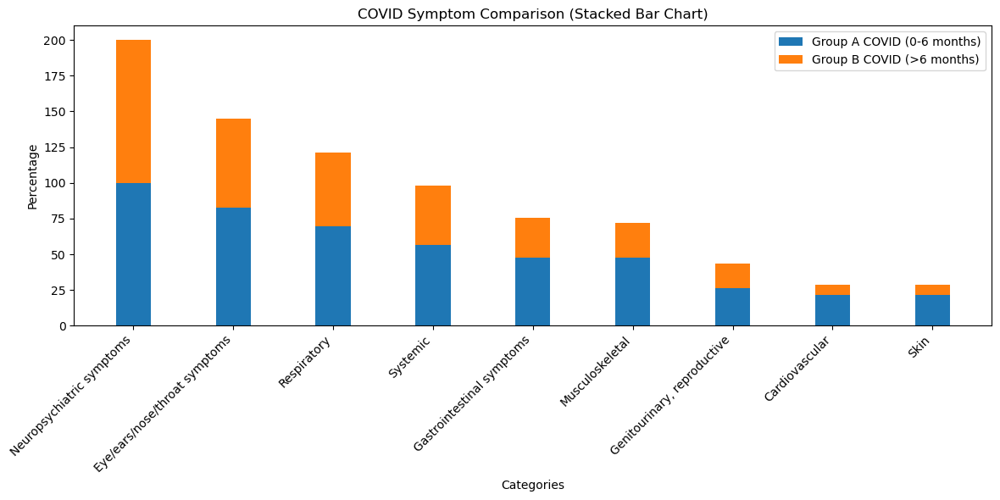

In [14]:
import matplotlib.pyplot as plt
import numpy as np

# Data for Group A (COVID recovered 0-6 months)
group_a_categories = [
    "Neuropsychiatric symptoms",
    "Eye/ears/nose/throat symptoms",
    "Respiratory",
    "Systemic",
    "Gastrointestinal symptoms",
    "Musculoskeletal",
    "Genitourinary, reproductive",
    "Cardiovascular",
    "Skin"
]

group_a_percentages = [100.00, 82.61, 69.57, 56.52, 47.83, 47.83, 26.09, 21.74, 21.74]

# Data for Group B (COVID recovered > 6 months)
group_b_categories = [
    "Neuropsychiatric symptoms",
    "Gastrointestinal symptoms",
    "Systemic",
    "Eye/ears/nose/throat symptoms",
    "Musculoskeletal",
    "Respiratory",
    "Skin",
    "Cardiovascular",
    "Genitourinary, reproductive"
]

group_b_percentages = [100.00, 62.07, 51.72, 41.38, 27.59, 24.14, 17.24, 6.90, 6.90]

x = np.arange(len(group_a_categories))  # X-axis positions for bars
width = 0.35  # Width of the bars

fig, ax = plt.subplots(figsize=(12, 6))

# Plot Group A data
ax.bar(x, group_a_percentages, width, label='Group A COVID (0-6 months)')

# Plot Group B data on top of Group A data
ax.bar(x, group_b_percentages, width, label='Group B COVID (>6 months)', bottom=group_a_percentages)

# Set the labels for the x-axis
ax.set_xticks(x)
ax.set_xticklabels(group_a_categories, rotation=45, ha='right')

# Set the chart title and labels
ax.set_title('COVID Symptom Comparison (Stacked Bar Chart)')
ax.set_xlabel('Categories')
ax.set_ylabel('Percentage')

# Show the legend
ax.legend()

# Display the chart
plt.tight_layout()
plt.show()


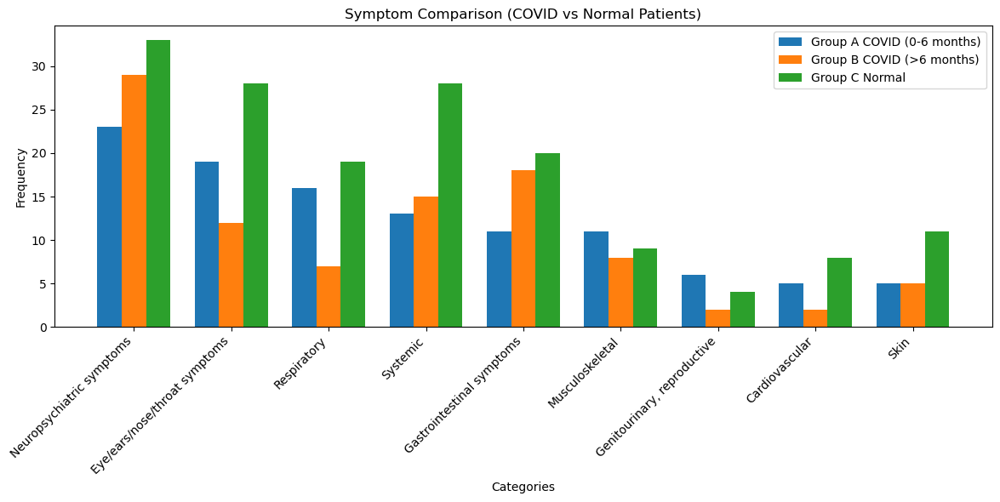

In [35]:
import matplotlib.pyplot as plt
import numpy as np

# Data for Group A (COVID recovered 0-6 months)
group_a_categories = [
    "Neuropsychiatric symptoms",
    "Eye/ears/nose/throat symptoms",
    "Respiratory",
    "Systemic",
    "Gastrointestinal symptoms",
    "Musculoskeletal",
    "Genitourinary, reproductive",
    "Cardiovascular",
    "Skin"
]

group_a_frequency = [23, 19, 16, 13, 11, 11, 6, 5, 5]

# Data for Group B (COVID recovered > 6 months)
group_b_categories = [
    "Neuropsychiatric symptoms",
    "Eye/ears/nose/throat symptoms",
    "Respiratory",
    "Systemic",
    "Gastrointestinal symptoms",
    "Musculoskeletal",
    "Genitourinary, reproductive",
    "Cardiovascular",
    "Skin"
]

group_b_frequency = [29, 12, 7, 15, 18, 8, 2, 2, 5]

# Data for Group C (normal)
group_c_categories = [
    "Neuropsychiatric symptoms",
    "Eye/ears/nose/throat symptoms",
    "Respiratory",
    "Systemic",
    "Gastrointestinal symptoms",
    "Musculoskeletal",
    "Genitourinary, reproductive",
    "Cardiovascular",
    "Skin"
]

group_c_frequency = [33, 28, 19, 28, 20, 9, 4, 8, 11]

x = np.arange(len(group_a_categories))  # X-axis positions for bars
width = 0.25  # Width of the bars

fig, ax = plt.subplots(figsize=(12, 6))

# Plot Group A data
ax.bar(x - width, group_a_frequency, width, label='Group A COVID (0-6 months)')

# Plot Group B data next to Group A data
ax.bar(x, group_b_frequency, width, label='Group B COVID (>6 months)')

# Plot Group C data next to Group B data
ax.bar(x + width, group_c_frequency, width, label='Group C Normal')

# Set the labels for the x-axis
ax.set_xticks(x)
ax.set_xticklabels(group_a_categories, rotation=45, ha='right')

# Set the chart title and labels
ax.set_title('Symptom Comparison (COVID vs Normal Patients)')
ax.set_xlabel('Categories')
ax.set_ylabel('Frequency')

# Show the legend
ax.legend()

# Display the chart
plt.tight_layout()
plt.show()

- Group A COVID (recovering 0-6 motnhs) : Respiratory symptoms
- Group B COVID (recovering > 6 months) : Gastrointestinal symptoms
- Group C Normal : Systemic symptoms

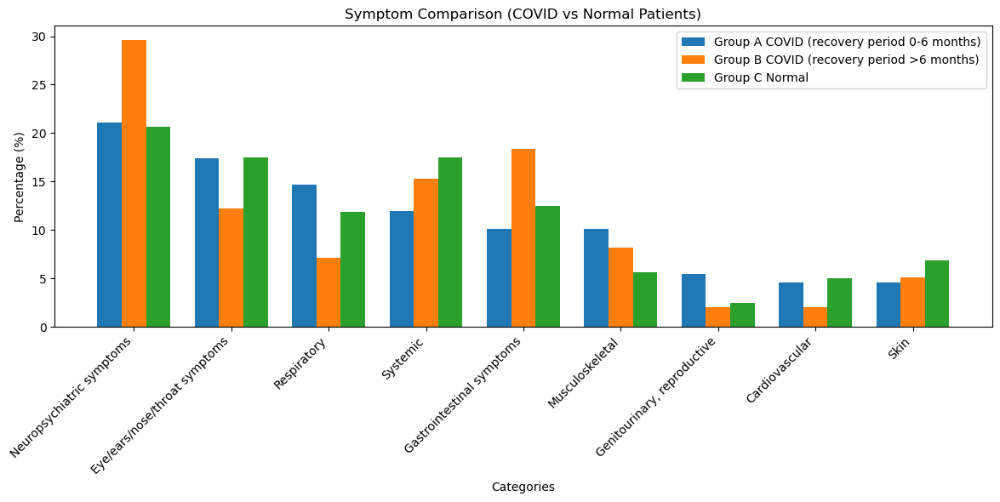

In [28]:
import matplotlib.pyplot as plt
import numpy as np

# Data for Group A (COVID recovered 0-6 months)
group_a_categories = [
    "Neuropsychiatric symptoms",
    "Eye/ears/nose/throat symptoms",
    "Respiratory",
    "Systemic",
    "Gastrointestinal symptoms",
    "Musculoskeletal",
    "Genitourinary, reproductive",
    "Cardiovascular",
    "Skin"
]

group_a_percentage = [21.10, 17.43, 14.68, 11.93, 10.09, 10.09, 5.50, 4.59, 4.59]

# Data for Group B (COVID recovered > 6 months)
group_b_categories = [
    "Neuropsychiatric symptoms",
    "Eye/ears/nose/throat symptoms",
    "Respiratory",
    "Systemic",
    "Gastrointestinal symptoms",
    "Musculoskeletal",
    "Genitourinary, reproductive",
    "Cardiovascular",
    "Skin"
]

group_b_percentage = [29.59, 12.24, 7.14, 15.31, 18.37, 8.16, 2.04, 2.04, 5.10]

# Data for Group C (normal)
group_c_categories = [
    "Neuropsychiatric symptoms",
    "Eye/ears/nose/throat symptoms",
    "Respiratory",
    "Systemic",
    "Gastrointestinal symptoms",
    "Musculoskeletal",
    "Genitourinary, reproductive",
    "Cardiovascular",
    "Skin"
]

group_c_percentage = [20.62, 17.50, 11.88, 17.50, 12.50, 5.62, 2.50, 5.00, 6.88]

x = np.arange(len(group_a_categories))  # X-axis positions for bars
width = 0.25  # Width of the bars

fig, ax = plt.subplots(figsize=(12, 6))

# Plot Group A data
ax.bar(x - width, group_a_percentage, width, label='Group A COVID (recovery period 0-6 months)')

# Plot Group B data next to Group A data
ax.bar(x, group_b_percentage, width, label='Group B COVID (recovery period >6 months)')

# Plot Group C data next to Group B data
ax.bar(x + width, group_c_percentage, width, label='Group C Normal')

# Set the labels for the x-axis
ax.set_xticks(x)
ax.set_xticklabels(group_a_categories, rotation=45, ha='right')

# Set the chart title and labels
ax.set_title('Symptom Comparison (COVID vs Normal Patients)')
ax.set_xlabel('Categories')
ax.set_ylabel('Percentage (%)')

# Show the legend
ax.legend()

# Display the chart
plt.tight_layout()
plt.show()

In [20]:
import pandas as pd
import os
import warnings
warnings.filterwarnings('ignore')

# Define the folder path where your data files are located
folder_path = 'C:/Users/User/Downloads/WQD7002 Data Science Research Project/datasets/trial_normal'

# Define the symptom columns
symptom_columns = [
    'Cardiovascular', 'Skin', 'Gastrointestinal symptoms',
    'Eye/ears/nose/throat symptoms', 'Musculoskeletal',
    'Neuropsychiatric symptoms', 'Respiratory',
    'Genitourinary, reproductive', 'Systemic'
]

# Initialize an empty DataFrame to store the symptoms and their counts
all_symptoms_df = pd.DataFrame(columns=['File', 'Category', 'Symptom', 'Frequency'])

# Loop through files in the folder
for file_name in os.listdir(folder_path):
    if file_name.endswith(".csv"):
        file_path = os.path.join(folder_path, file_name)

        # Read the CSV file into a DataFrame
        df = pd.read_csv(file_path)

        # Iterate over the symptom columns and extract, count, and filter unique symptoms
        for column in symptom_columns:
            non_missing_rows = df[df[column].notna()]
            
            # Split the symptom strings by ';', remove 'NO SYMPTOMS', and create a set of unique symptoms
            unique_symptoms = set()
            for index, row in non_missing_rows.iterrows():
                symptoms = set(row[column].split(';')) - {'NO SYMPTOM'}
                unique_symptoms.update(symptoms)

            # Calculate the count of unique symptoms
            symptom_count = len(unique_symptoms)

            # Append the data to the overall DataFrame
            for symptom in unique_symptoms:
                all_symptoms_df = all_symptoms_df.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)

# Reset the index of the final DataFrame
all_symptoms_df.reset_index(drop=True, inplace=True)
all_symptoms_df['Frequency'] = all_symptoms_df['Frequency'].astype(int)

# Data Analysis: Display the resulting DataFrame
all_symptoms_df



,File,Category,Symptom,Frequency
0,converted_001.csv,Eye/ears/nose/throat symptoms,"Runny nose, Sore throat, Hoarseness of voice",3
1,converted_001.csv,Eye/ears/nose/throat symptoms,"Runny nose, Sore throat, Red eyes, Hoarseness ...",3
2,converted_001.csv,Eye/ears/nose/throat symptoms,"Runny nose, Sore throat",3
3,converted_001.csv,Neuropsychiatric symptoms,Dizziness,1
4,converted_002.csv,Neuropsychiatric symptoms,Anxiety,1
...,...,...,...,...
168,converted_014.csv,Systemic,"Chills, Fever",5
169,converted_017.csv,Neuropsychiatric symptoms,Low mood,2
170,converted_017.csv,Neuropsychiatric symptoms,"Low mood, Difficulty concentrating",2
171,converted_017.csv,Respiratory,Shortness of breath,1


In [21]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

# Create a DataFrame with the sample data
original_df = pd.DataFrame(all_symptoms_df)

# Create an empty DataFrame to store the individual symptoms and their counts
individual_symptoms_df = pd.DataFrame(columns=['File', 'Category', 'Symptom', 'Frequency'])

# Iterate through each row in the original DataFrame
for index, row in original_df.iterrows():
    symptoms = row['Symptom'].split(', ')  # Split the symptoms
    category = row['Category']
    file_name = row['File']
    
    # Count the frequency of each individual symptom within its category
    for symptom in symptoms:
        individual_symptoms_df = individual_symptoms_df.append({'File': file_name, 'Category': category, 'Symptom': symptom, 'Frequency': 1}, ignore_index=True)

# Group the individual symptoms by file, category, and symptom and count their frequencies
grouped_symptoms_df = individual_symptoms_df.groupby(['File', 'Category', 'Symptom']).size().reset_index(name='Frequency')

# Display the grouped DataFrame
grouped_symptoms_df

,File,Category,Symptom,Frequency
0,converted_001.csv,Eye/ears/nose/throat symptoms,Hoarseness of voice,2
1,converted_001.csv,Eye/ears/nose/throat symptoms,Red eyes,1
2,converted_001.csv,Eye/ears/nose/throat symptoms,Runny nose,3
3,converted_001.csv,Eye/ears/nose/throat symptoms,Sore throat,3
4,converted_001.csv,Neuropsychiatric symptoms,Dizziness,1
...,...,...,...,...
155,converted_014.csv,Systemic,Night sweats,2
156,converted_017.csv,Neuropsychiatric symptoms,Difficulty concentrating,1
157,converted_017.csv,Neuropsychiatric symptoms,Low mood,2
158,converted_017.csv,Respiratory,Shortness of breath,1


In [22]:
grouped_symptoms_df.sample(20)

,File,Category,Symptom,Frequency
111,converted_009.csv,Gastrointestinal symptoms,Loss of appetite,1
66,converted_005.csv,Systemic,Weakness,3
122,converted_013.csv,Eye/ears/nose/throat symptoms,Runny nose,1
79,converted_007.csv,Neuropsychiatric symptoms,Difficulty concentrating,1
48,converted_005.csv,Neuropsychiatric symptoms,Anxiety,1
141,converted_014.csv,Neuropsychiatric symptoms,Headaches,4
9,converted_003.csv,Eye/ears/nose/throat symptoms,Blurred vision,2
45,converted_005.csv,"Genitourinary, reproductive",Irregular periods,1
10,converted_003.csv,Eye/ears/nose/throat symptoms,Hoarseness of voice,1
0,converted_001.csv,Eye/ears/nose/throat symptoms,Hoarseness of voice,2


In [23]:
symptom_counts5 = grouped_symptoms_df.groupby('Category')['Frequency'].count().reset_index()

# Sort the DataFrame by frequency in descending order.
symptom_counts5 = symptom_counts5.sort_values(by='Frequency', ascending=False)

# Calculate the total frequency of the selected symptoms.
total_frequency = symptom_counts5['Frequency'].sum()

# Add a new column 'Percentage' to the DataFrame.
symptom_counts5['Percentage'] = round((symptom_counts5['Frequency'] / total_frequency) * 100, 2)

# Calculate the percentage relative to the largest percentage
# max_percentage = symptom_counts5["Frequency"].max()
# symptom_counts5["Percentage"] = round((symptom_counts5["Frequency"] / max_percentage) * 100, 2)

# Display the result.
symptom_counts5

,Category,Frequency,Percentage
5,Neuropsychiatric symptoms,33,20.62
1,Eye/ears/nose/throat symptoms,28,17.50
8,Systemic,28,17.50
2,Gastrointestinal symptoms,20,12.50
6,Respiratory,19,11.88
7,Skin,11,6.88
4,Musculoskeletal,9,5.62
0,Cardiovascular,8,5.00
3,"Genitourinary, reproductive",4,2.50


In [11]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Assuming you have a DataFrame called df
# and you want to normalize a specific column, let's say 'your_column'

# Create a MinMaxScaler instance
scaler = MinMaxScaler()

# Reshape the column to a 2D array as required by MinMaxScaler
column_to_normalize = symptom_counts5['Frequency'].values.reshape(-1, 1)

# Fit and transform the selected column
normalized_column = scaler.fit_transform(column_to_normalize)

# Assign the normalized values back to the DataFrame
symptom_counts5['Frequency'] = normalized_column

symptom_counts5
# # to check
# max_dfvalues = df['min max'].max() == 1
# max_dfvalues

,Category,Frequency,Percentage
5,Neuropsychiatric symptoms,1.000000,100.00
1,Eye/ears/nose/throat symptoms,0.827586,84.85
8,Systemic,0.827586,84.85
2,Gastrointestinal symptoms,0.551724,60.61
6,Respiratory,0.517241,57.58
7,Skin,0.241379,33.33
4,Musculoskeletal,0.172414,27.27
0,Cardiovascular,0.137931,24.24
3,"Genitourinary, reproductive",0.000000,12.12


In [11]:
import pandas as pd
import os
import warnings
warnings.filterwarnings('ignore')

# Define the folder path where your data files are located
folder_path = 'C:/Users/User/Downloads/WQD7002 Data Science Research Project/datasets/trial'

# Define the symptom columns
symptom_columns = [
    'Cardiovascular', 'Skin', 'Gastrointestinal symptoms',
    'Eye/ears/nose/throat symptoms', 'Musculoskeletal',
    'Neuropsychiatric symptoms', 'Respiratory',
    'Genitourinary, reproductive', 'Systemic'
]

# Initialize an empty DataFrame to store the symptoms and their counts
all_symptoms_df1 = pd.DataFrame(columns=['File', 'Category', 'Symptom', 'Frequency'])

# Loop through files in the folder
for file_name in os.listdir(folder_path):
    if file_name.endswith(".csv"):
        file_path = os.path.join(folder_path, file_name)

        # Read the CSV file into a DataFrame
        df = pd.read_csv(file_path)

        # Iterate over the symptom columns and extract, count, and filter unique symptoms
        for column in symptom_columns:
            non_missing_rows = df[df[column].notna()]
            
            # Split the symptom strings by ';', remove 'NO SYMPTOMS', and create a set of unique symptoms
            unique_symptoms = []
            for index, row in non_missing_rows.iterrows():
                symptoms = row[column].split(',')
                symptoms = [symptom.strip() for symptom in symptoms if symptom != 'NO SYMPTOMS']
                unique_symptoms.append(symptoms)

            # Calculate the count of unique symptoms
            # Initialize a dictionary to store the count of each symptom
            symptom_count = {}

            # Calculate the count of unique symptoms
            for symptoms in unique_symptoms:
                for symptom in symptoms:
                    symptom_count[symptom] = symptom_count.get(symptom, 0) + 1

            # Append the data to the overall DataFrame
#             for item in unique_symptoms:
            all_symptoms_df1 = all_symptoms_df1.append({'File': file_name, 'Category': column, 'Symptom': symptom, 'Frequency': symptom_count}, ignore_index=True)

# Reset the index of the final DataFrame
all_symptoms_df1.reset_index(drop=True, inplace=True)
# all_symptoms_df['Frequency'] = all_symptoms_df['Frequency'].astype(int)

# Data Analysis: Display the resulting DataFrame
all_symptoms_df1

all_symptoms_df1.to_csv('all_symptoms_df2.csv', index=False)


In [13]:
import pandas as pd
import os
from collections import Counter
from itertools import chain
import warnings
warnings.filterwarnings('ignore')

# Define the folder path where your data files are located
folder_path = 'C:/Users/User/Downloads/WQD7002 Data Science Research Project/datasets/trial'

# Define the symptom columns
symptom_columns = [
    'Cardiovascular', 'Skin', 'Gastrointestinal symptoms',
    'Eye/ears/nose/throat symptoms', 'Musculoskeletal',
    'Neuropsychiatric symptoms', 'Respiratory',
    'Genitourinary, reproductive', 'Systemic'
]

# Initialize an empty DataFrame to store the symptoms and their counts
all_symptoms_data = []

# Loop through files in the folder
for file_name in os.listdir(folder_path):
    if file_name.endswith(".csv"):
        file_path = os.path.join(folder_path, file_name)

        # Read the CSV file into a DataFrame
        df = pd.read_csv(file_path)

        # Iterate over the symptom columns and extract, count, and filter unique symptoms
        for column in symptom_columns:
            non_missing_rows = df[df[column].notna()]

            # Split the symptom strings by ',', remove 'NO SYMPTOMS', and create a list of unique symptoms
            symptoms = list(chain.from_iterable(
                row[column].split(',')
                for _, row in non_missing_rows.iterrows()
            ))
            symptoms = [symptom.strip() for symptom in symptoms if symptom != 'NO SYMPTOMS']

            # Use Counter to calculate the count of unique symptoms
            symptom_count = Counter(symptoms)

            # Append the data to the overall list
            all_symptoms_data.extend([{
                'File': file_name,
                'Category': column,
                'Symptom': symptom,
                'Frequency': count
            } for symptom, count in symptom_count.items()])

# Create a DataFrame from the collected data
all_symptoms_df1 = pd.DataFrame(all_symptoms_data)

# Reset the index of the final DataFrame
all_symptoms_df1.reset_index(drop=True, inplace=True)

# Data Analysis: Display the resulting DataFrame
print(all_symptoms_df1)

# Save the DataFrame to a CSV file
all_symptoms_df1.to_csv('all_symptoms_df2.csv', index=False)


                 File                       Category              Symptom  \
0    modified_001.csv  Eye/ears/nose/throat symptoms           Runny nose   
1    modified_001.csv  Eye/ears/nose/throat symptoms          Sore throat   
2    modified_001.csv  Eye/ears/nose/throat symptoms             Red eyes   
3    modified_001.csv  Eye/ears/nose/throat symptoms  Hoarseness of voice   
4    modified_001.csv      Neuropsychiatric symptoms            Dizziness   
..                ...                            ...                  ...   
404       ppum017.csv                    Respiratory            Dry cough   
405       ppum017.csv    Genitourinary, reproductive   Sexual dysfunction   
406       ppum017.csv                       Systemic             Weakness   
407       ppum017.csv                       Systemic   Feeling very tired   
408       ppum017.csv                       Systemic               Chills   

     Frequency  
0            3  
1            3  
2            1  
3      

In [15]:
see = all_symptoms_df1['Symptom'].unique
see

<bound method Series.unique of 0               Runny nose
1              Sore throat
2                 Red eyes
3      Hoarseness of voice
4                Dizziness
              ...         
404              Dry cough
405     Sexual dysfunction
406               Weakness
407     Feeling very tired
408                 Chills
Name: Symptom, Length: 409, dtype: object>

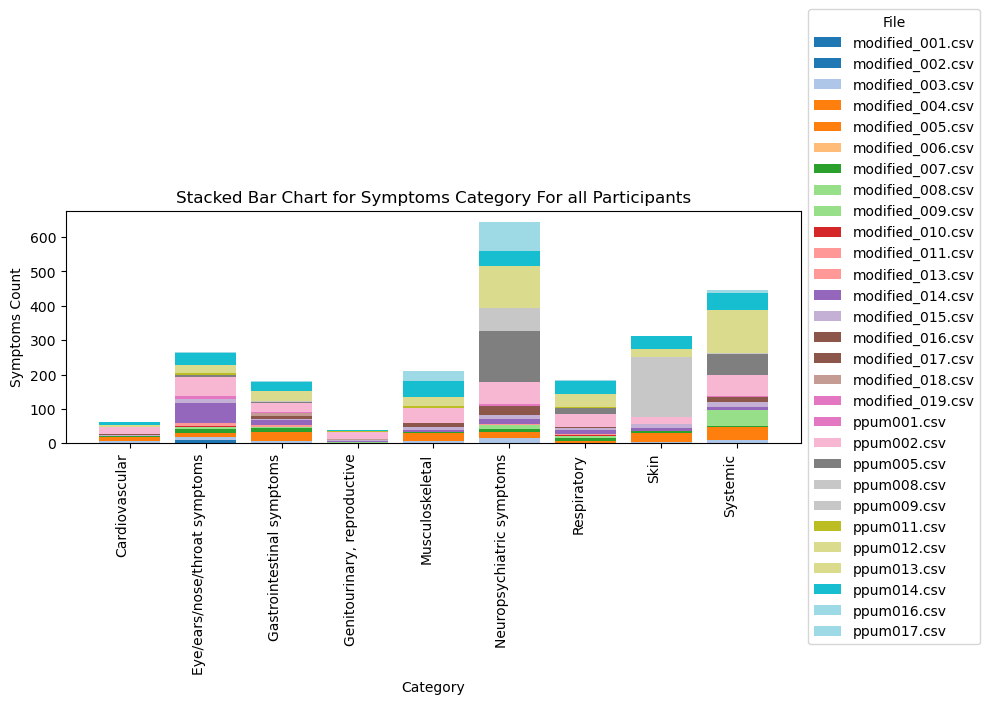

In [22]:
import pandas as pd
import matplotlib.pyplot as plt

# Group by 'Category' and 'File' and sum the 'Frequency'
grouped_data = all_symptoms_df1.groupby(['Category', 'File'])['Frequency'].sum().unstack(fill_value=0)

# Create a custom colormap with a sufficient number of colors
num_colors = len(grouped_data.columns)
custom_cmap = plt.cm.get_cmap('tab20', num_colors)

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Get the list of files
files = grouped_data.columns

# Initialize a color list for each file
colors = [custom_cmap(i) for i in range(num_colors)]

# Plot each file
bottom = None  # Initialize the bottom for the first file
for i, file in enumerate(files):
    values = grouped_data[file]
    ax.bar(grouped_data.index, values, label=file, color=colors[i], bottom=bottom)
    if bottom is None:
        bottom = values
    else:
        bottom += values

# Add labels and legend
ax.set_xlabel('Category')
ax.set_ylabel('Symptoms Count')
ax.set_title('Stacked Bar Chart for Symptoms Category For all Participants')
ax.legend(title='File', loc='center left', bbox_to_anchor=(1, 0.5))

# Rotate x-axis labels for better readability
plt.xticks(rotation=90, ha='right')

# Show the plot
plt.tight_layout()
plt.show()

In [21]:
grouped_data

File,modified_001.csv,modified_002.csv,modified_003.csv,modified_004.csv,modified_005.csv,modified_006.csv,modified_007.csv,modified_008.csv,modified_009.csv,modified_010.csv,...,ppum002.csv,ppum005.csv,ppum008.csv,ppum009.csv,ppum011.csv,ppum012.csv,ppum013.csv,ppum014.csv,ppum016.csv,ppum017.csv
Category,,,,,,,,,,,,,,,,,,,,,
Cardiovascular,63,0,6,0,13,0,1,1,0,0,...,23,0,0,0,0,0,4,10,0,0
Eye/ears/nose/throat symptoms,267,0,9,0,13,0,11,5,2,1,...,57,4,1,1,4,0,24,36,0,3
Gastrointestinal symptoms,180,0,6,0,26,0,12,1,2,0,...,26,3,0,3,0,7,22,27,0,1
"Genitourinary, reproductive",40,0,1,0,1,0,0,3,0,0,...,21,0,1,0,1,0,1,3,0,1
Musculoskeletal,210,0,6,0,25,0,1,0,1,1,...,43,2,0,0,4,0,28,46,0,28
Neuropsychiatric symptoms,645,1,15,1,15,0,10,7,3,0,...,64,149,62,5,0,2,118,45,1,84
Respiratory,183,0,2,0,5,1,8,2,4,1,...,35,18,0,0,4,0,38,37,0,2
Skin,311,0,3,2,26,0,6,0,0,0,...,21,0,0,174,0,0,24,37,0,0
Systemic,446,0,10,0,38,0,3,44,1,0,...,59,62,0,2,1,0,124,49,0,10


In [24]:
pivoted_grouped_data = grouped_data.T
pivoted_grouped_data

Category,Cardiovascular,Eye/ears/nose/throat symptoms,Gastrointestinal symptoms,"Genitourinary, reproductive",Musculoskeletal,Neuropsychiatric symptoms,Respiratory,Skin,Systemic
File,,,,,,,,,
modified_001.csv,63,267,180,40,210,645,183,311,446
modified_002.csv,0,0,0,0,0,1,0,0,0
modified_003.csv,6,9,6,1,6,15,2,3,10
modified_004.csv,0,0,0,0,0,1,0,2,0
modified_005.csv,13,13,26,1,25,15,5,26,38
modified_006.csv,0,0,0,0,0,0,1,0,0
modified_007.csv,1,11,12,0,1,10,8,6,3
modified_008.csv,1,5,1,3,0,7,2,0,44
modified_009.csv,0,2,2,0,1,3,4,0,1


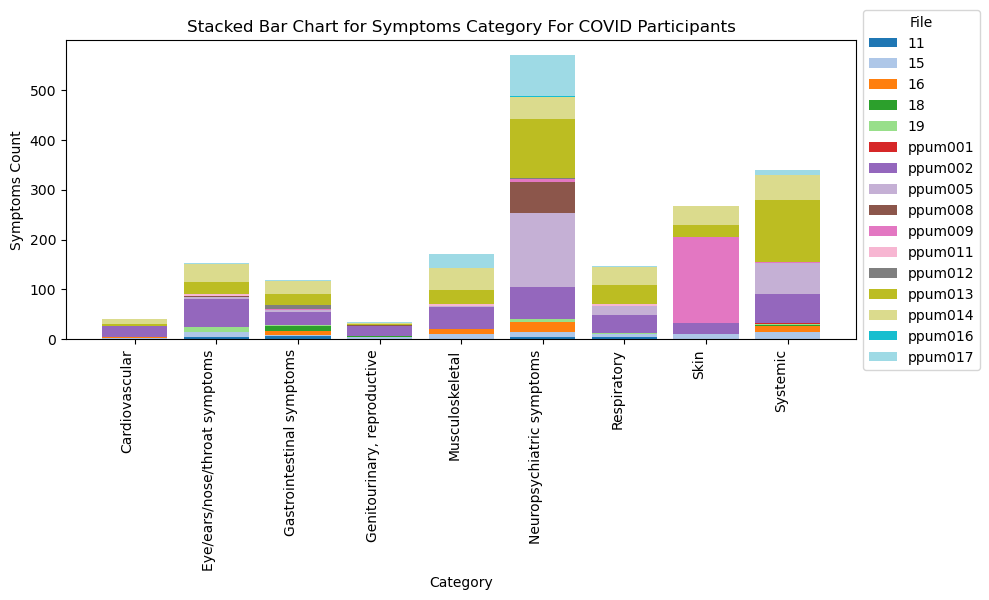

In [25]:
import pandas as pd
import matplotlib.pyplot as plt

symptoms_category_covid = pd.read_csv('C:/Users/User/Downloads/WQD7002 Data Science Research Project/datasets/dataframes from data cleaning/all_symptoms_COVID.csv')

# Group by 'Category' and 'File' and sum the 'Frequency'
grouped_data_covid = symptoms_category_covid.groupby(['Category', 'File'])['Frequency'].sum().unstack(fill_value=0)

# Create a custom colormap with a sufficient number of colors
num_colors = len(grouped_data_covid.columns)
custom_cmap = plt.cm.get_cmap('tab20', num_colors)

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Get the list of files
files = grouped_data_covid.columns

# Initialize a color list for each file
colors = [custom_cmap(i) for i in range(num_colors)]

# Plot each file
bottom = None  # Initialize the bottom for the first file
for i, file in enumerate(files):
    values = grouped_data_covid[file]
    ax.bar(grouped_data_covid.index, values, label=file, color=colors[i], bottom=bottom)
    if bottom is None:
        bottom = values
    else:
        bottom += values

# Add labels and legend
ax.set_xlabel('Category')
ax.set_ylabel('Symptoms Count')
ax.set_title('Stacked Bar Chart for Symptoms Category For COVID Participants')
ax.legend(title='File', loc='center left', bbox_to_anchor=(1, 0.5))

# Rotate x-axis labels for better readability
plt.xticks(rotation=90, ha='right')

# Show the plot
plt.tight_layout()
plt.show()

Most symptoms category experienced by COVID participants is Neuropsychiatric symptoms followed by systemic and skin symptoms.

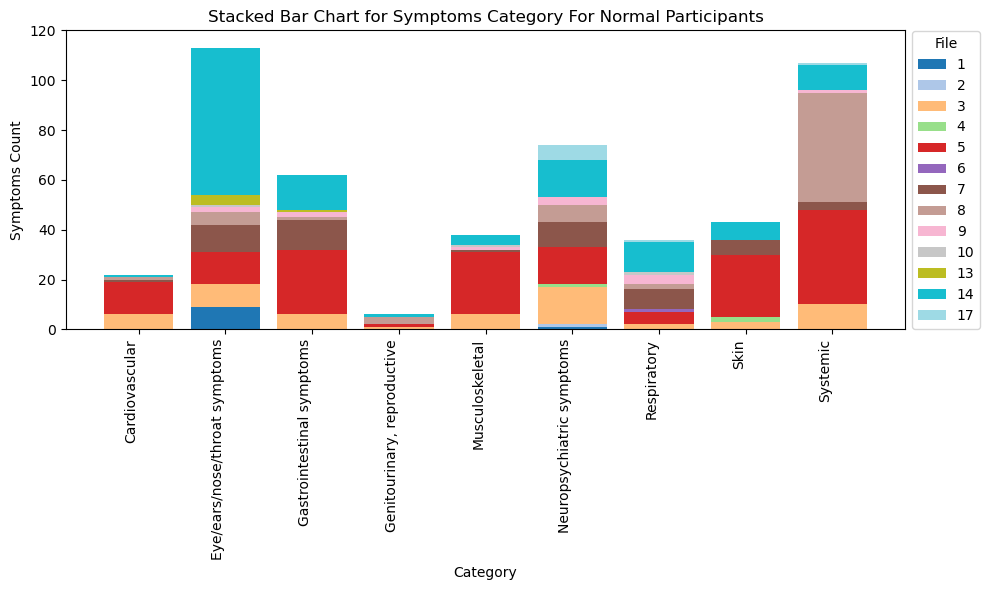

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

symptoms_category_normal = pd.read_csv('C:/Users/User/Downloads/WQD7002 Data Science Research Project/datasets/dataframes from data cleaning/all_symptoms_normal.csv')

# Group by 'Category' and 'File' and sum the 'Frequency'
grouped_data_normal = symptoms_category_normal.groupby(['Category', 'File'])['Frequency'].sum().unstack(fill_value=0)

# Create a custom colormap with a sufficient number of colors
num_colors = len(grouped_data_normal.columns)
custom_cmap = plt.cm.get_cmap('tab20', num_colors)

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Get the list of files
files = grouped_data_normal.columns

# Initialize a color list for each file
colors = [custom_cmap(i) for i in range(num_colors)]

# Plot each file
bottom = None  # Initialize the bottom for the first file
for i, file in enumerate(files):
    values = grouped_data_normal[file]
    ax.bar(grouped_data_normal.index, values, label=file, color=colors[i], bottom=bottom)
    if bottom is None:
        bottom = values
    else:
        bottom += values

# Set the y-axis limits to 150
ax.set_ylim(0, 120)

# Add labels and legend
ax.set_xlabel('Category')
ax.set_ylabel('Symptoms Count')
ax.set_title('Stacked Bar Chart for Symptoms Category For Normal Participants')
ax.legend(title='File', loc='center left', bbox_to_anchor=(1, 0.5))

# Rotate x-axis labels for better readability
plt.xticks(rotation=90, ha='right')

# Show the plot
plt.tight_layout()
plt.show()

Menahwile, the most symptoms category experienced by normal participants is Eyes/ears/nose/throat symptoms followed by systemic and neuropsychiatric symptoms.

In [33]:
grouped_data_covid

File,11,15,16,18,19,ppum001,ppum002,ppum005,ppum008,ppum009,ppum011,ppum012,ppum013,ppum014,ppum016,ppum017
Category,,,,,,,,,,,,,,,,
Cardiovascular,41,3,1,0,0,0,23,0,0,0,0,0,4,10,0,0
Eye/ears/nose/throat symptoms,154,11,0,0,9,0,57,4,1,1,4,0,24,36,0,3
Gastrointestinal symptoms,118,2,9,9,3,0,26,3,0,3,0,7,22,27,0,1
"Genitourinary, reproductive",34,5,0,1,0,0,21,0,1,0,1,0,1,3,0,1
Musculoskeletal,172,11,9,1,0,0,43,2,0,0,4,0,28,46,0,28
Neuropsychiatric symptoms,571,10,20,1,5,1,64,149,62,5,0,2,118,45,1,84
Respiratory,147,7,0,0,2,0,35,18,0,0,4,0,38,37,0,2
Skin,267,11,0,0,0,0,21,0,0,174,0,0,24,37,0,0
Systemic,339,14,13,1,3,1,59,62,0,2,1,0,124,49,0,10


In [38]:
grouped_data_covid = grouped_data_covid.T
grouped_data_covid.to_csv('grouped_data_covid.csv')

In [56]:
import pandas as pd

df = pd.DataFrame(grouped_data_covid)

category = ['Cardiovascular', 'Eye/ears/nose/throat symptoms', 'Gastrointestinal symptoms', 'Genitourinary, reproductive', 'Musculoskeletal', 'Neuropsychiatric symptoms', 'Respiratory', 'Skin', 'Systemic']

# Calculate total frequency for each column
total_frequency = df.values.sum()

# Initialize empty lists for storing values
categories = []
total_frequencies = []
percentages = []

# Calculate sum and percentage for each category
for column in category:
    sum_value = df[column].sum()
    percentage_value = round((sum_value / total_frequency) * 100, 1)

    # Append values to lists
    categories.append(column)
    total_frequencies.append(sum_value)
    percentages.append(percentage_value)

# Create a new DataFrame with category, total frequency, and percentage
summary_df = pd.DataFrame({
    'Category': categories,
    'Total Frequency': total_frequencies,
    'Percentage': percentages
})

summary_df = summary_df.sort_values(by=['Total Frequency', 'Percentage'], ascending=[False, False])

# Display the resulting DataFrame
print("Symptoms Category Records for COVID Patients :")
summary_df

Symptoms Category Records for COVID Patients :


,Category,Total Frequency,Percentage
5,Neuropsychiatric symptoms,1138,31.0
8,Systemic,678,18.5
7,Skin,534,14.6
4,Musculoskeletal,344,9.4
1,Eye/ears/nose/throat symptoms,304,8.3
6,Respiratory,290,7.9
2,Gastrointestinal symptoms,230,6.3
0,Cardiovascular,82,2.2
3,"Genitourinary, reproductive",68,1.9


In [58]:
grouped_data_normal = grouped_data_normal.T

import pandas as pd

dn = pd.DataFrame(grouped_data_normal)

category = ['Cardiovascular', 'Eye/ears/nose/throat symptoms', 'Gastrointestinal symptoms', 'Genitourinary, reproductive', 'Musculoskeletal', 'Neuropsychiatric symptoms', 'Respiratory', 'Skin', 'Systemic']

# Calculate total frequency for each column
total_frequency = dn.values.sum()

# Initialize empty lists for storing values
categories = []
total_frequencies = []
percentages = []

# Calculate sum and percentage for each category
for column in category:
    sum_value = dn[column].sum()
    percentage_value = round((sum_value / total_frequency) * 100, 1)

    # Append values to lists
    categories.append(column)
    total_frequencies.append(sum_value)
    percentages.append(percentage_value)

# Create a new DataFrame with category, total frequency, and percentage
summary_dn = pd.DataFrame({
    'Category': categories,
    'Total Frequency': total_frequencies,
    'Percentage': percentages
})

summary_dn = summary_dn.sort_values(by=['Total Frequency', 'Percentage'], ascending=[False, False])

# Display the resulting DataFrame
print("Symptoms Category Records for Normal Patients:")
summary_dn

Symptoms Category Records for Normal Patients:


,Category,Total Frequency,Percentage
1,Eye/ears/nose/throat symptoms,217,21.9
8,Systemic,214,21.6
5,Neuropsychiatric symptoms,147,14.8
2,Gastrointestinal symptoms,124,12.5
7,Skin,86,8.7
4,Musculoskeletal,76,7.7
6,Respiratory,72,7.3
0,Cardiovascular,44,4.4
3,"Genitourinary, reproductive",12,1.2


In [61]:
import pandas as pd
import matplotlib.pyplot as plt

symptoms_category_covid_less6 = pd.read_csv('C:/Users/User/Downloads/WQD7002 Data Science Research Project/datasets/dataframes from data cleaning/all_symptoms_COVID_less6.csv')

# Group by 'Category' and 'File' and sum the 'Frequency'
grouped_data_covid_less6 = symptoms_category_covid_less6.groupby(['Category', 'File'])['Frequency'].sum().unstack(fill_value=0)

grouped_data_covid_less6 = grouped_data_covid_less6.T

import pandas as pd

less6 = pd.DataFrame(grouped_data_covid_less6)

category = ['Cardiovascular', 'Eye/ears/nose/throat symptoms', 'Gastrointestinal symptoms', 'Genitourinary, reproductive', 'Musculoskeletal', 'Neuropsychiatric symptoms', 'Respiratory', 'Skin', 'Systemic']

# Calculate total frequency for each column
total_frequency = less6.values.sum()

# Initialize empty lists for storing values
categories = []
total_frequencies = []
percentages = []

# Calculate sum and percentage for each category
for column in category:
    sum_value = less6[column].sum()
    percentage_value = round((sum_value / total_frequency) * 100, 1)

    # Append values to lists
    categories.append(column)
    total_frequencies.append(sum_value)
    percentages.append(percentage_value)

# Create a new DataFrame with category, total frequency, and percentage
summary_less6 = pd.DataFrame({
    'Category': categories,
    'Total Frequency': total_frequencies,
    'Percentage': percentages
})

summary_less6 = summary_less6.sort_values(by=['Total Frequency', 'Percentage'], ascending=[False, False])

# Display the resulting DataFrame
print("Symptoms Category Records for COVID Patients (recovering < 6 months):")
summary_less6


Symptoms Category Records for COVID Patients (recovering < 6 months):


,Category,Total Frequency,Percentage
5,Neuropsychiatric symptoms,227,34.5
4,Musculoskeletal,86,13.1
8,Systemic,84,12.8
1,Eye/ears/nose/throat symptoms,80,12.2
6,Respiratory,52,7.9
2,Gastrointestinal symptoms,42,6.4
7,Skin,32,4.9
3,"Genitourinary, reproductive",29,4.4
0,Cardiovascular,26,4.0


In [62]:
import pandas as pd
import matplotlib.pyplot as plt

symptoms_category_covid_more6 = pd.read_csv('C:/Users/User/Downloads/WQD7002 Data Science Research Project/datasets/dataframes from data cleaning/all_symptoms_COVID_more6.csv')

# Group by 'Category' and 'File' and sum the 'Frequency'
grouped_data_covid_more6 = symptoms_category_covid_more6.groupby(['Category', 'File'])['Frequency'].sum().unstack(fill_value=0)

grouped_data_covid_more6 = grouped_data_covid_more6.T

import pandas as pd

more6 = pd.DataFrame(grouped_data_covid_more6)

category = ['Cardiovascular', 'Eye/ears/nose/throat symptoms', 'Gastrointestinal symptoms', 'Genitourinary, reproductive', 'Musculoskeletal', 'Neuropsychiatric symptoms', 'Respiratory', 'Skin', 'Systemic']

# Calculate total frequency for each column
total_frequency = more6.values.sum()

# Initialize empty lists for storing values
categories = []
total_frequencies = []
percentages = []

# Calculate sum and percentage for each category
for column in category:
    sum_value = more6[column].sum()
    percentage_value = round((sum_value / total_frequency) * 100, 1)

    # Append values to lists
    categories.append(column)
    total_frequencies.append(sum_value)
    percentages.append(percentage_value)

# Create a new DataFrame with category, total frequency, and percentage
summary_more6 = pd.DataFrame({
    'Category': categories,
    'Total Frequency': total_frequencies,
    'Percentage': percentages
})

summary_more6 = summary_more6.sort_values(by=['Total Frequency', 'Percentage'], ascending=[False, False])

# Display the resulting DataFrame
print("Symptoms Category Records for COVID Patients (recovering > 6 months):")
summary_more6


Symptoms Category Records for COVID Patients (recovering > 6 months):


,Category,Total Frequency,Percentage
5,Neuropsychiatric symptoms,226,28.2
7,Skin,211,26.3
8,Systemic,131,16.3
4,Musculoskeletal,58,7.2
6,Respiratory,57,7.1
2,Gastrointestinal symptoms,54,6.7
1,Eye/ears/nose/throat symptoms,50,6.2
0,Cardiovascular,11,1.4
3,"Genitourinary, reproductive",4,0.5


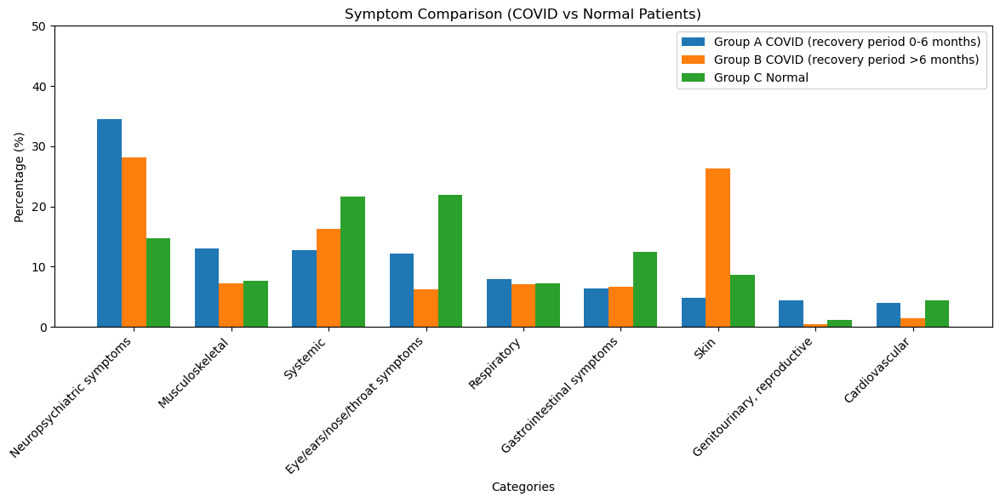

In [65]:
import matplotlib.pyplot as plt
import numpy as np

# Data for Group A (COVID recovered 0-6 months)
group_a_symp_categories = [
    "Neuropsychiatric symptoms",
    "Musculoskeletal",
    "Systemic",
    "Eye/ears/nose/throat symptoms",
    "Respiratory",
    "Gastrointestinal symptoms",
    "Skin",
    "Genitourinary, reproductive",
    "Cardiovascular"
]

group_a_symp_percentage = [34.5, 13.1, 12.8, 12.2, 7.9, 6.4, 4.9, 4.4, 4.0]

# Data for Group B (COVID recovered > 6 months)
group_b_symp_categories = [
    "Neuropsychiatric symptoms",
    "Musculoskeletal",
    "Systemic",
    "Eye/ears/nose/throat symptoms",
    "Respiratory",
    "Gastrointestinal symptoms",
    "Skin",
    "Genitourinary, reproductive",
    "Cardiovascular"
]

group_b_symp_percentage = [28.2, 7.2, 16.3, 6.2, 7.1, 6.7, 26.3, 0.5, 1.4]

# Data for Group C (normal)
group_c_symp_categories = [
    "Neuropsychiatric symptoms",
    "Musculoskeletal",
    "Systemic",
    "Eye/ears/nose/throat symptoms",
    "Respiratory",
    "Gastrointestinal symptoms",
    "Skin",
    "Genitourinary, reproductive",
    "Cardiovascular"
]

group_c_symp_percentage = [14.8, 7.7, 21.6, 21.9, 7.3, 12.5, 8.7, 1.2, 4.4]

x = np.arange(len(group_a_symp_categories))  # X-axis positions for bars
width = 0.25  # Width of the bars

fig, ax = plt.subplots(figsize=(12, 6))

# Plot Group A data
ax.bar(x - width, group_a_symp_percentage, width, label='Group A COVID (recovery period 0-6 months)')

# Plot Group B data next to Group A data
ax.bar(x, group_b_symp_percentage, width, label='Group B COVID (recovery period >6 months)')

# Plot Group C data next to Group B data
ax.bar(x + width, group_c_symp_percentage, width, label='Group C Normal')

# Set the labels for the x-axis
ax.set_xticks(x)
ax.set_xticklabels(group_a_symp_categories, rotation=45, ha='right')

# Set the y-axis limits to 50
ax.set_ylim(0, 50)

# Set the chart title and labels
ax.set_title('Symptom Comparison (COVID vs Normal Patients)')
ax.set_xlabel('Categories')
ax.set_ylabel('Percentage (%)')

# Show the legend
ax.legend()

# Display the chart
plt.tight_layout()
plt.show()

- Group A COVID (recovering 0-6 motnhs) : Neuropsychiatric symptoms
- Group B COVID (recovering > 6 months) : Skin symptoms
- Group C Normal : Eye/ears/nose/throat symptoms

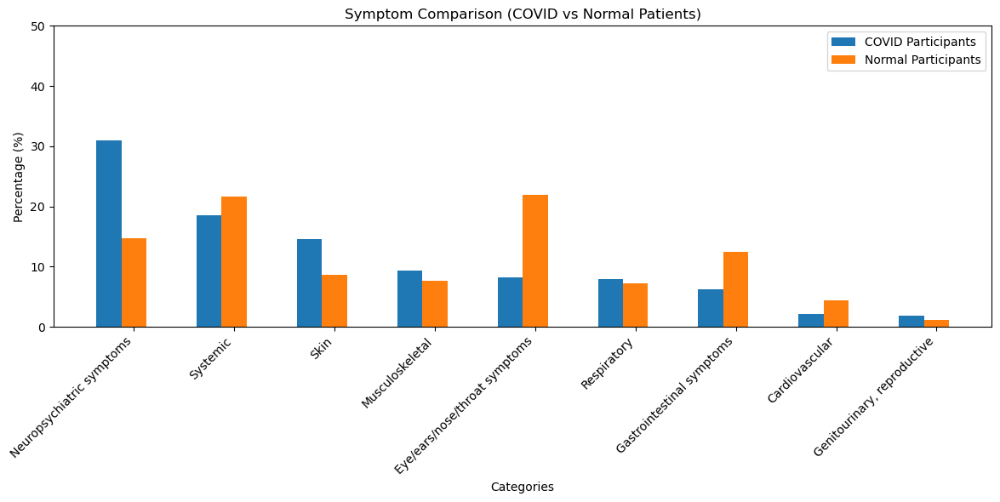

In [67]:
import matplotlib.pyplot as plt
import numpy as np

# Data for Group A (COVID)
covid_symp_categories = [
    "Neuropsychiatric symptoms",
    "Systemic",
    "Skin",
    "Musculoskeletal",
    "Eye/ears/nose/throat symptoms",
    "Respiratory",
    "Gastrointestinal symptoms",
    "Cardiovascular",
    "Genitourinary, reproductive"
]

covid_symp_percentage = [31.0, 18.5, 14.6, 9.4, 8.3, 7.9, 6.3, 2.2, 1.9]

# Data for Group B (normal)
normal_symp_categories = [
    "Neuropsychiatric symptoms",
    "Systemic",
    "Skin",
    "Musculoskeletal",
    "Eye/ears/nose/throat symptoms",
    "Respiratory",
    "Gastrointestinal symptoms",
    "Cardiovascular",
    "Genitourinary, reproductive"
]

normal_symp_percentage = [14.8, 21.6, 8.7, 7.7, 21.9, 7.3, 12.5, 4.4, 1.2]

x = np.arange(len(covid_symp_categories))  # X-axis positions for bars
width = 0.25  # Width of the bars

fig, ax = plt.subplots(figsize=(12, 6))

# Plot Group A data
ax.bar(x - width, covid_symp_percentage, width, label='COVID Participants')

# Plot Group B data next to Group A data
ax.bar(x, normal_symp_percentage, width, label='Normal Participants')

# Set the labels for the x-axis
ax.set_xticks(x)
ax.set_xticklabels(covid_symp_categories, rotation=45, ha='right')

# Set the y-axis limits to 50
ax.set_ylim(0, 50)

# Set the chart title and labels
ax.set_title('Symptom Comparison (COVID vs Normal Patients)')
ax.set_xlabel('Categories')
ax.set_ylabel('Percentage (%)')

# Show the legend
ax.legend()

# Display the chart
plt.tight_layout()
plt.show()

In [77]:
symptoms_covid = pd.read_csv('C:/Users/User/Downloads/WQD7002 Data Science Research Project/datasets/dataframes from data cleaning/all_symptoms_COVID.csv')

# Filter the DataFrame to select only rows with 'Neuropsychiatric symptoms' in the 'Category' column.
neuropsychiatric_covid = symptoms_covid[symptoms_covid['Category'] == 'Neuropsychiatric symptoms']

# Group by 'Category' and 'Symptom', and calculate sum and percentage
grouped_symptom_covid = neuropsychiatric_covid.groupby(['Symptom']).agg({'Frequency': 'sum'}).reset_index()
grouped_symptom_covid['Percentage'] = round((grouped_symptom_covid['Frequency'] / grouped_symptom_covid['Frequency'].sum()) * 100, 1)

grouped_symptom_covid = grouped_symptom_covid.sort_values(by=['Frequency', 'Percentage'], ascending=[False, False])
# Display the resulting DataFrame

grouped_symptom_covid

,Symptom,Frequency,Percentage
10,Memory issues,142,24.9
4,Difficulty concentrating,74,13.0
6,Dizziness,72,12.6
8,Headaches,64,11.2
9,Low mood,61,10.7
0,Anxiety,54,9.5
1,Change in smell,38,6.7
2,Change in taste,28,4.9
5,Difficulty sleeping,26,4.6
3,Confusion,7,1.2


In [79]:
symptoms_normal = pd.read_csv('C:/Users/User/Downloads/WQD7002 Data Science Research Project/datasets/dataframes from data cleaning/all_symptoms_normal.csv')

# Filter the DataFrame to select only rows with 'Neuropsychiatric symptoms' in the 'Category' column.
neuropsychiatric_normal = symptoms_normal[symptoms_normal['Category'] == 'Neuropsychiatric symptoms']

# Group by 'Category' and 'Symptom', and calculate sum and percentage
grouped_symptom_normal = neuropsychiatric_normal.groupby(['Symptom']).agg({'Frequency': 'sum'}).reset_index()
grouped_symptom_normal['Percentage'] = round((grouped_symptom_normal['Frequency'] / grouped_symptom_normal['Frequency'].sum()) * 100, 1)

grouped_symptom_normal = grouped_symptom_normal.sort_values(by=['Frequency', 'Percentage'], ascending=[False, False])

# Display the resulting DataFrame
grouped_symptom_normal

,Symptom,Frequency,Percentage
7,Headaches,25,33.8
6,Dizziness,13,17.6
8,Low mood,11,14.9
5,Difficulty sleeping,10,13.5
4,Difficulty concentrating,4,5.4
0,Anxiety,3,4.1
1,Change in smell,2,2.7
2,Change in taste,2,2.7
9,Memory issues,2,2.7
3,Confusion,1,1.4


In [80]:
symptoms_covid_less6 = pd.read_csv('C:/Users/User/Downloads/WQD7002 Data Science Research Project/datasets/dataframes from data cleaning/all_symptoms_COVID_less6.csv')

# Filter the DataFrame to select only rows with 'Neuropsychiatric symptoms' in the 'Category' column.
neuropsychiatric_covid_less6 = symptoms_covid_less6[symptoms_covid_less6['Category'] == 'Neuropsychiatric symptoms']

# Group by 'Category' and 'Symptom', and calculate sum and percentage
grouped_symptom_covid_less6 = neuropsychiatric_covid_less6.groupby(['Symptom']).agg({'Frequency': 'sum'}).reset_index()
grouped_symptom_covid_less6['Percentage'] = round((grouped_symptom_covid_less6['Frequency'] / grouped_symptom_covid_less6['Frequency'].sum()) * 100, 1)

grouped_symptom_covid_less6 = grouped_symptom_covid_less6.sort_values(by=['Frequency', 'Percentage'], ascending=[False, False])
# Display the resulting DataFrame

grouped_symptom_covid_less6

,Symptom,Frequency,Percentage
9,Memory issues,94,41.4
1,Change in smell,35,15.4
6,Dizziness,27,11.9
2,Change in taste,21,9.3
4,Difficulty concentrating,16,7.0
7,Headaches,16,7.0
5,Difficulty sleeping,15,6.6
0,Anxiety,1,0.4
3,Confusion,1,0.4
8,Low mood,1,0.4


In [81]:
symptoms_covid_more6 = pd.read_csv('C:/Users/User/Downloads/WQD7002 Data Science Research Project/datasets/dataframes from data cleaning/all_symptoms_COVID_more6.csv')

# Filter the DataFrame to select only rows with 'Neuropsychiatric symptoms' in the 'Category' column.
neuropsychiatric_covid_more6 = symptoms_covid_more6[symptoms_covid_more6['Category'] == 'Neuropsychiatric symptoms']

# Group by 'Category' and 'Symptom', and calculate sum and percentage
grouped_symptom_covid_more6 = neuropsychiatric_covid_more6.groupby(['Symptom']).agg({'Frequency': 'sum'}).reset_index()
grouped_symptom_covid_more6['Percentage'] = round((grouped_symptom_covid_more6['Frequency'] / grouped_symptom_covid_more6['Frequency'].sum()) * 100, 1)

grouped_symptom_covid_more6 = grouped_symptom_covid_more6.sort_values(by=['Frequency', 'Percentage'], ascending=[False, False])
# Display the resulting DataFrame

grouped_symptom_covid_more6

,Symptom,Frequency,Percentage
4,Difficulty concentrating,38,16.8
10,Memory issues,38,16.8
8,Headaches,35,15.5
6,Dizziness,34,15.0
0,Anxiety,28,12.4
9,Low mood,28,12.4
2,Change in taste,7,3.1
5,Difficulty sleeping,7,3.1
1,Change in smell,3,1.3
3,Confusion,3,1.3


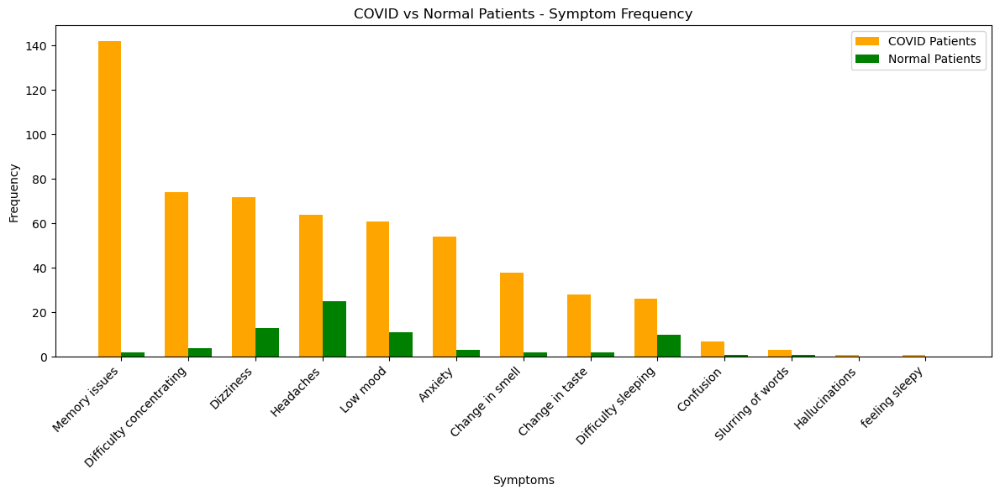

In [84]:
import matplotlib.pyplot as plt
import numpy as np

# Data for COVID patients
covid_symptoms = ["Memory issues", "Difficulty concentrating",  "Dizziness", "Headaches", "Low mood", 
                  "Anxiety", "Change in smell", "Change in taste", "Difficulty sleeping", "Confusion",  
                  "Slurring of words", "Hallucinations", "feeling sleepy"]
covid_frequency = [142, 74, 72, 64, 61, 54, 38, 28, 26, 7, 3, 1, 1]

# Data for normal patients
normal_symptoms = ["Memory issues", "Difficulty concentrating",  "Dizziness", "Headaches", "Low mood", 
                  "Anxiety", "Change in smell", "Change in taste", "Difficulty sleeping", "Confusion",  
                  "Slurring of words", "Hallucinations", "feeling sleepy"]
normal_frequency = [2, 4, 13, 25, 11, 3, 2, 2, 10, 1, 1, 0, 0]

x = np.arange(len(covid_symptoms))  # The x-axis positions for bars
width = 0.35  # The width of the bars

fig, ax = plt.subplots(figsize=(12, 6))

# Plot COVID patients' data
covid_bars = ax.bar(x - width/2, covid_frequency, width, label='COVID Patients', color='orange')

# Plot normal patients' data
normal_bars = ax.bar(x + width/2, normal_frequency, width, label='Normal Patients', color='green')

# Set the labels for the x-axis
ax.set_xticks(x)
ax.set_xticklabels(covid_symptoms, rotation=45, ha='right')

# Set the chart title and labels
ax.set_title('COVID vs Normal Patients - Symptom Frequency')
ax.set_xlabel('Symptoms')
ax.set_ylabel('Frequency')

# Show the legend
ax.legend()

# Display the chart
plt.tight_layout()
plt.show()


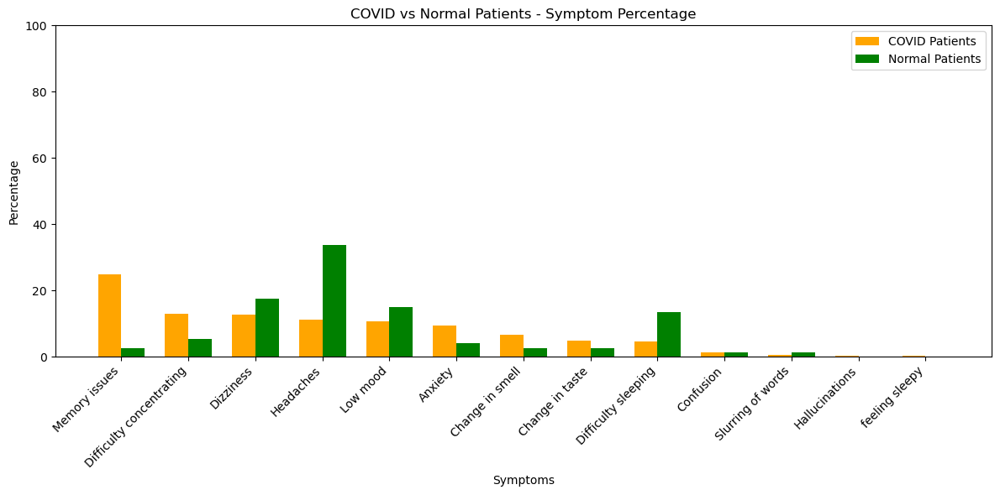

In [87]:
import matplotlib.pyplot as plt
import numpy as np

# Data for COVID patients
covid_symptoms = ["Memory issues", "Difficulty concentrating",  "Dizziness", "Headaches", "Low mood", 
                  "Anxiety", "Change in smell", "Change in taste", "Difficulty sleeping", "Confusion",  
                  "Slurring of words", "Hallucinations", "feeling sleepy"]
covid_percentage = [24.9, 13.0, 12.6, 11.2, 10.7, 9.5, 6.7, 4.9, 4.6, 1.2, 0.5, 0.2, 0.2]

# Data for normal patients
normal_symptoms = ["Memory issues", "Difficulty concentrating",  "Dizziness", "Headaches", "Low mood", 
                  "Anxiety", "Change in smell", "Change in taste", "Difficulty sleeping", "Confusion",  
                  "Slurring of words", "Hallucinations", "feeling sleepy"]
normal_percentage = [2.7, 5.4, 17.6, 33.8, 14.9, 4.1, 2.7, 2.7, 13.5, 1.4, 1.4, 0, 0]

x = np.arange(len(covid_symptoms))  # The x-axis positions for bars
width = 0.35  # The width of the bars

fig, ax = plt.subplots(figsize=(12, 6))

# Plot COVID patients' data
covid_bars = ax.bar(x - width/2, covid_percentage, width, label='COVID Patients', color='orange')

# Plot normal patients' data
normal_bars = ax.bar(x + width/2, normal_percentage, width, label='Normal Patients', color='green')

# Set the labels for the x-axis
ax.set_xticks(x)
ax.set_xticklabels(covid_symptoms, rotation=45, ha='right')

# Set the chart title and labels
ax.set_title('COVID vs Normal Patients - Symptom Percentage')
ax.set_xlabel('Symptoms')
ax.set_ylabel('Percentage')

# Set the y-axis limits to 100
ax.set_ylim(0, 100)

# Show the legend
ax.legend()

# Display the chart
plt.tight_layout()
plt.show()

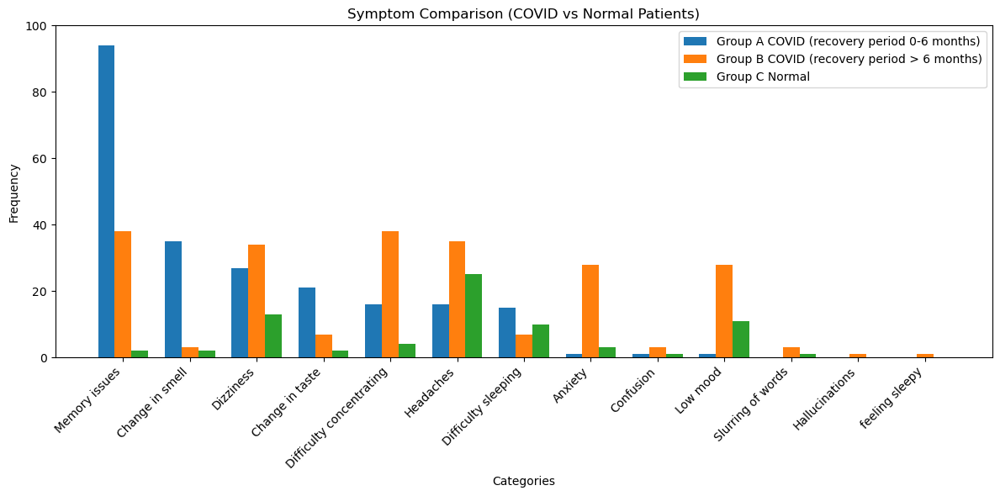

In [88]:
import matplotlib.pyplot as plt
import numpy as np

# Data for COVID patients (less 6)
covid_less6_symptoms = ["Memory issues", "Change in smell", "Dizziness", "Change in taste", "Difficulty concentrating",  
                  "Headaches", "Difficulty sleeping", "Anxiety", "Confusion", "Low mood",
                  "Slurring of words", "Hallucinations", "feeling sleepy"]
covid_less6_frequency = [94, 35, 27, 21, 16, 16, 15, 1, 1, 1, 0, 0, 0]

# Data for COVID patients
covid_more6_symptoms = ["Memory issues", "Change in smell", "Dizziness", "Change in taste", "Difficulty concentrating",  
                  "Headaches", "Difficulty sleeping", "Anxiety", "Confusion", "Low mood",
                  "Slurring of words", "Hallucinations", "feeling sleepy"]
covid_more6_frequency = [38, 3, 34, 7, 38, 35, 7, 28, 3, 28, 3, 1, 1]

# Data for normal patients
normal_symptoms = ["Memory issues", "Change in smell", "Dizziness", "Change in taste", "Difficulty concentrating",  
                  "Headaches", "Difficulty sleeping", "Anxiety", "Confusion", "Low mood",
                  "Slurring of words", "Hallucinations", "feeling sleepy"]
normal_frequency = [2, 2, 13, 2, 4, 25, 10, 3, 1, 11, 1, 0, 0]

x = np.arange(len(covid_less6_symptoms))  # X-axis positions for bars
width = 0.25  # Width of the bars

fig, ax = plt.subplots(figsize=(12, 6))

# Plot Group A data
ax.bar(x - width, covid_less6_frequency, width, label='Group A COVID (recovery period 0-6 months)')

# Plot Group B data next to Group A data
ax.bar(x, covid_more6_frequency, width, label='Group B COVID (recovery period > 6 months)')

# Plot Group C data next to Group B data
ax.bar(x + width, normal_frequency, width, label='Group C Normal')

# Set the labels for the x-axis
ax.set_xticks(x)
ax.set_xticklabels(covid_less6_symptoms, rotation=45, ha='right')

# Set the y-axis limits to 100
ax.set_ylim(0, 100)

# Set the chart title and labels
ax.set_title('Symptom Comparison (COVID vs Normal Patients)')
ax.set_xlabel('Categories')
ax.set_ylabel('Frequency')

# Show the legend
ax.legend()

# Display the chart
plt.tight_layout()
plt.show()

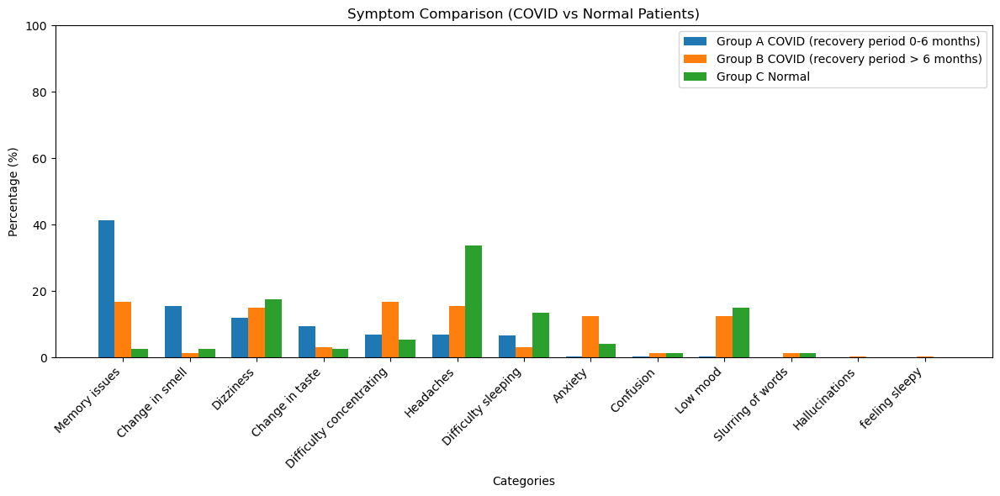

In [2]:
import matplotlib.pyplot as plt
import numpy as np

# Data for COVID patients (less 6)
covid_less6_symptoms = ["Memory issues", "Change in smell", "Dizziness", "Change in taste", "Difficulty concentrating",  
                  "Headaches", "Difficulty sleeping", "Anxiety", "Confusion", "Low mood",
                  "Slurring of words", "Hallucinations", "feeling sleepy"]
covid_less6_percentage = [41.4, 15.4, 11.9, 9.3, 7.0, 7.0, 6.6, 0.4, 0.4, 0.4, 0, 0, 0]

# Data for COVID patients
covid_more6_symptoms = ["Memory issues", "Change in smell", "Dizziness", "Change in taste", "Difficulty concentrating",  
                  "Headaches", "Difficulty sleeping", "Anxiety", "Confusion", "Low mood",
                  "Slurring of words", "Hallucinations", "feeling sleepy"]
covid_more6_percentage = [16.8, 1.3, 15.0, 3.1, 16.8, 15.5, 3.1, 12.4, 1.3, 12.4, 1.3, 0.4, 0.4]

# Data for normal patients
normal_symptoms = ["Memory issues", "Change in smell", "Dizziness", "Change in taste", "Difficulty concentrating",  
                  "Headaches", "Difficulty sleeping", "Anxiety", "Confusion", "Low mood",
                  "Slurring of words", "Hallucinations", "feeling sleepy"]
normal_percentage = [2.7, 2.7, 17.6, 2.7, 5.4, 33.8, 13.5, 4.1, 1.4, 14.9, 1.4, 0, 0]

x = np.arange(len(covid_less6_symptoms))  # X-axis positions for bars
width = 0.25  # Width of the bars

fig, ax = plt.subplots(figsize=(12, 6))

# Plot Group A data
ax.bar(x - width, covid_less6_percentage, width, label='Group A COVID (recovery period 0-6 months)')

# Plot Group B data next to Group A data
ax.bar(x, covid_more6_percentage, width, label='Group B COVID (recovery period > 6 months)')

# Plot Group C data next to Group B data
ax.bar(x + width, normal_percentage, width, label='Group C Normal')

# Set the labels for the x-axis
ax.set_xticks(x)
ax.set_xticklabels(covid_less6_symptoms, rotation=45, ha='right')

# Set the y-axis limits to 100
ax.set_ylim(0, 100)

# Set the chart title and labels
ax.set_title('Symptom Comparison (COVID vs Normal Patients)')
ax.set_xlabel('Categories')
ax.set_ylabel('Percentage (%)')

# Show the legend
ax.legend()

# Display the chart
plt.tight_layout()
plt.show()

In [2]:
import pandas as pd 

df = pd.read_csv('/Users/User/Downloads/sleep_study_10,17.11.2023.csv')  
df
a = df['REMTime']
a

0       1h
1      10m
2      40m
3    1h04m
4      10m
5    1h14m
6       0m
7      24m
8    1h18m
Name: REMTime, dtype: object